In [246]:
# !/usr/bin/env python
import glob
from subprocess import run

import numpy as np
import scipy.stats as stats
from scipy.optimize import curve_fit

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

from transit_time_dependence_plots import (extract_json, extract_json_tts_filter, extract_json_min_tts_filter, extract_json_tts_chi2_filter,plot_single_transit_time_histogram,
                                           prod_id_to_icm_id,extract_channel,extract_fit_params)

from refit_bad_tt_fits import merge_bins_reduceat
from transit_time_fit_functions import gaussian

import json

from pathlib import Path
home = str(Path.home())

plt.rcParams["font.family"] = "serif"
plt.rcParams["mathtext.fontset"] = "dejavuserif"
plt.rcParams.update({'font.size': 10})


# colorsCustom = ['#8dd3c7','#bebada','#fb8072','#80b1d3','#fdb462','#b3de69','#fccde5','#d9d9d9','#bc80bd','#ccebc5','#ffed6f','#1f78b4','#33a02c','#e31a1c','#a6cee3','#b2df8a','#fb9a99','#fdbf6f','#ff7f00','#cab2d6','#ffff99','#6a3d9a','#b15928','#1b9e77','#d95f02','#7570b3','#e7298a','#66a61e','#e6ab02','#a6761d','#666666','#1f78b4']
colorsCustom = ["#4477AA", "#EE6677", "#228833", "#CCBB44", "#66CCEE", "#AA3377", "#BBBBBB", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7", "#000075", "#F032E6", "#42D4F4", "#FABED4", "#469990", "#DCBEFF", "#9A6324", "#FFFAC8", "#800000", "#AAFFC3", "#808000", "#FFD8B1", "#911EB4", "#3CB44B", "#E6194B", "#8B8682"]


In [247]:
my_selection_file = home + "/research_ua/icecube/upgrade/timing_calibration/scripts/mdom_tt_run_picks_with_MSU_list.json"

In [248]:
MSU_selection_file = home + "/research_ua/icecube/upgrade/timing_calibration/scripts/MSU_mDOM_FAT_Run_List.json"

In [249]:
def compare_msu_list_with_my_list(my_selection_file, MSU_selection_file):
    recheck_mdom_list = {}
    with open(my_selection_file, "r") as f:
        my_selection = json.load(f)

    with open(MSU_selection_file, "r") as f:
        MSU_selection = json.load(f)

    my_selection_mdom_list = [ielt["mDOM"] for ielt in my_selection]
    MSU_selection_mdom_list = [f"mDOM_{imdom}" for imdom in MSU_selection.keys()]
    print(f"mDOMs in my selection: {my_selection_mdom_list}")
    for ielt in my_selection:
        mdom = ielt["mDOM"]
        if mdom in MSU_selection_mdom_list:
            MSU_select_run = MSU_selection[f"{mdom.split('_')[1]}"]["selected_run"]
            my_selected_run_map = ielt["select_run"]
            my_selected_run_list = list(set([ich['run'] for ich in ielt['select_run']]))
            # if str(MSU_select_run) not in my_selected_run_list or len(my_selected_run_list) != 1:
            # if str(MSU_select_run) not in my_selected_run_list and len(my_selected_run_list) > 1:
            if str(MSU_select_run) in my_selected_run_list and len(my_selected_run_list) > 1:
                print(f"{mdom} {MSU_select_run} {my_selected_run_list}")
                recheck_mdom_list[mdom] = (MSU_select_run, my_selected_run_list)
            # print(f"mDOM {mdom} MSU run {MSU_select_run} {}")
    return recheck_mdom_list
    



In [250]:
recheck_mdom_list = compare_msu_list_with_my_list(my_selection_file, MSU_selection_file)

mDOMs in my selection: ['mDOM_D017', 'mDOM_D021', 'mDOM_D044', 'mDOM_D048', 'mDOM_D069', 'mDOM_D077', 'mDOM_D083', 'mDOM_D110', 'mDOM_D111', 'mDOM_D112', 'mDOM_D117', 'mDOM_D123', 'mDOM_D126', 'mDOM_D134', 'mDOM_D139', 'mDOM_D140', 'mDOM_M001', 'mDOM_M005', 'mDOM_M008', 'mDOM_M011', 'mDOM_M013', 'mDOM_M014', 'mDOM_M019', 'mDOM_M021', 'mDOM_M024', 'mDOM_M025', 'mDOM_M028', 'mDOM_M030', 'mDOM_M032', 'mDOM_M033', 'mDOM_M035', 'mDOM_M036', 'mDOM_M037', 'mDOM_M038', 'mDOM_M039', 'mDOM_M045', 'mDOM_M048', 'mDOM_M049', 'mDOM_M051', 'mDOM_M054', 'mDOM_M055', 'mDOM_M060', 'mDOM_M061', 'mDOM_M062', 'mDOM_M063', 'mDOM_M064', 'mDOM_M065', 'mDOM_M066', 'mDOM_M068', 'mDOM_M071', 'mDOM_M072', 'mDOM_M074', 'mDOM_M075', 'mDOM_M080', 'mDOM_M082', 'mDOM_M084', 'mDOM_M086', 'mDOM_M088', 'mDOM_M090', 'mDOM_M092', 'mDOM_M093', 'mDOM_M094', 'mDOM_M095', 'mDOM_M100', 'mDOM_M105', 'mDOM_M107', 'mDOM_M108', 'mDOM_M109', 'mDOM_M115', 'mDOM_M116', 'mDOM_M119', 'mDOM_M123', 'mDOM_M124', 'mDOM_M125', 'mDOM_M136', '

In [251]:
C_msu = 23.9 #ns
C_desy = 25.5 #ns
upgrade_commissioning_scripts = home+"/research_ua/icecube/software/upgrade_commissioning_scripts/"
geometry_files = sorted(glob.glob(upgrade_commissioning_scripts+"/geometry/string_*geometry*.json"))
mdom_tt_dir = home+"/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/"
plotFolder: str = home+"/research_ua/icecube/Upgrade/timing_calibration/plots/mdom_transit"
# run_picks_json = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mDOM_tt_run_picks.json"
run_picks_json = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mDOM_tt_run_picks_with_MSU_list.json"
refit_json = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mdom_tt_needing_refit.json"
empty_meas_json = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mDOM_tt_empty_meas.json"

transit_time_file = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mdom_transit_time.json"
transit_times_single_per_pmt_file = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mdom_transit_time_single_pick.json"
transit_times_single_gaussian_file = home+"/research_ua/icecube/upgrade/timing_calibration/scripts/mdom_transit_time_gaussian_refit.json"
# transit_times = extract_json(transit_time_file,obj_key="mu",filter_non_zero=False)
# transit_times_single_per_pmt = extract_json_unique_tt(transit_time_file,run_picks_json,refit_json,empty_meas_json,obj_key="mu",filter_non_zero=True)

In [252]:
def plot_single_transit_time_run_residual(mDOM_prod_id, channel, mdom_tt_dir, plotFolder,fit_line=False,fit_xlim=[],include_runs=[]) -> None:
    '''Plots the transit time histogram for a single mDOM and all its channels'''
    meas_files = glob.glob(f"{mdom_tt_dir}/{mDOM_prod_id}*/*.json")
    print(f"meas files {sorted([ifile for ifile in meas_files if "ch_3" in ifile])}")

    available_channels = [extract_channel(ifile) for ifile in meas_files]
    print(f"available channels for {mDOM_prod_id}: {list(set(available_channels))}")
    meas_files = [ifile for ifile in meas_files if int(extract_channel(ifile)) == int(channel)]
    print(f"meas file {meas_files}")
    if len(meas_files) == 0:
        print(f"meas files for {mDOM_prod_id} channel {channel}: {meas_files}")
    if "_M" in mDOM_prod_id:
        correction = C_msu
    elif "_D" in mDOM_prod_id:
        correction = C_desy
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 7),
                                    gridspec_kw={'height_ratios': [3, 1]})
    x_label = ""
    y_label = ""
    color_num = 0
    for i,ifile in enumerate(meas_files):
        with open(ifile, 'r') as f:
            data = json.load(f)
            transit_times = []
            y_values = data["meas_data"][0]['y_values']
            # print(f"sum of y values {ifile} {sum(y_values)}")
            x_min = data["meas_data"][0]["x_min"]
            x_max = data["meas_data"][0]["x_max"]
            n_bins = data["meas_data"][0]["n_bins"]
            x_values = np.linspace(x_min,x_max,n_bins)
            x_label = data["meas_data"][0]["x_label"]
            y_label = data["meas_data"][0]["y_label"]
            run = data["run_number"]
            if len(include_runs) > 0 and run not in include_runs:
                continue
            # ax.step(x_values,y_values,ls='-',lw = 2.5,c=colorsCustom[i],label=f" tt {mu:.1f}\u00B1{sigma:.1f} ns PMT HV {hv:.1f} V {temperature:.1f} \u00b0C Run {run}",alpha=1)
            tt, tt_spread, a, b, c, chi2, hv = extract_fit_params(ifile)
            print(f"mdom {mDOM_prod_id} channel {channel} Run {run}: tt {tt:.1f} ns, tts {tt_spread:.1f} ns, a {a:.1f}, b {b:.1f}, c {c:.1f}, chi2 {chi2:.1f}, hv {hv:.1f} V")
            # if c < 20:
            try:
                poisson_errors = np.sqrt(np.asarray(y_values))
                poisson_errors[poisson_errors == 0] = 1
                y_fit = gaussian(x_values, a,b,c)
                residuals = y_values - y_fit
                RSS = np.sum(residuals**2)
                ax1.errorbar(x_values, y_values, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], label=f"Run {run}: tt={b-correction:.0f} ns, tts={c:.0f} ns,",alpha=1)
                if fit_line:
                    if len(fit_xlim) > 0:
                        x_values_fit = np.linspace(fit_xlim[0], fit_xlim[1], 1000)
                    else:
                        x_values_fit = np.linspace(min(x_values),max(x_values),1000)
                    ax1.plot(x_values_fit, gaussian(x_values_fit,a,b,c),  '-',c=colorsCustom[color_num],  linewidth=2.5,   label=rf'Gaussian fit A: {a:.0f}, $\mu$: {b:.0f}, $\sigma$: {c:.0f}'+'\n'+f'RSS: {RSS:.0f}, χ²: {chi2:.1f}')
                    ax2.errorbar(x_values, residuals, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], alpha=1)
                    ax2.axhline(0, color="gray", linewidth=2)
            except RuntimeError as e:
                print(f"Fit failed for {ifile} with error: {e}")

            color_num += 1

    ax2.set_ylabel('Residuals', fontsize=22)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='both',which='both', direction='in', labelsize=22)   
             

    ax1.tick_params(axis='both',which='both', direction='in', labelsize=22)
    ax1.text(0.02, 0.95, f"{mDOM_prod_id} channel {channel}", transform=ax1.transAxes, ha='left', fontsize=10)
    # ax1.text(0.55, 0.95, f"{mDOM_prod_id} channel {channel} {get_pmt_uid(mDOM_prod_id, int(channel), mdom_tt_dir)}", transform=ax1.transAxes, ha='left', fontsize=10)
    ax2.set_xlabel(f"{x_label}", fontsize=22)
    ax1.set_ylabel(f"{y_label}", fontsize=22)
    if len(fit_xlim) > 0:
        ax1.set_xlim(fit_xlim[0], fit_xlim[1])
        ax2.set_xlim(fit_xlim[0], fit_xlim[1])
    # ax1.set_ylim(bottom=0)
    ax1.grid(True,alpha=0.6)
    ax1.legend(fontsize=12,ncols=1)
    plot_name = f"{plotFolder}/{mDOM_prod_id}_channel_{channel}"
    # plt.savefig(plot_name+".png",transparent=False,bbox_inches='tight')
    # plt.savefig(plot_name+".pdf",transparent=False,bbox_inches='tight')
    # plt.close()
    plt.show()

In [253]:
def plot_single_gaussian_fit_residual(mDOM_prod_id, channel, mdom_tt_dir, plotFolder,fit_line=False,fit_xlim=[],include_runs=[],remove_pedestal=None,merge_bins=None) -> None:
    '''Plots the transit time histogram for a single mDOM and all its channels'''
    meas_files = glob.glob(f"{mdom_tt_dir}/{mDOM_prod_id}*/*.json")
    # print(f"meas files {sorted([ifile for ifile in meas_files if "ch_3" in ifile])}")

    available_channels = [extract_channel(ifile) for ifile in meas_files]
    # print(f"available channels for {mDOM_prod_id}: {list(set(available_channels))}")
    meas_files = [ifile for ifile in meas_files if int(extract_channel(ifile)) == int(channel)]
    print(f"meas file {meas_files}")
    if len(meas_files) == 0:
        print(f"meas files for {mDOM_prod_id} channel {channel}: {meas_files}")
    if "_M" in mDOM_prod_id:
        correction = C_msu
    elif "_D" in mDOM_prod_id:
        correction = C_desy
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 7),
                                    gridspec_kw={'height_ratios': [3, 1]})
    x_label = ""
    y_label = ""
    color_num = 0
    for i,ifile in enumerate(meas_files):
        with open(ifile, 'r') as f:
            data = json.load(f)
            transit_times = []
            y_values = data["meas_data"][0]['y_values']
            # print(f"sum of y values {ifile} {sum(y_values)}")
            x_min = data["meas_data"][0]["x_min"]
            x_max = data["meas_data"][0]["x_max"]
            n_bins = data["meas_data"][0]["n_bins"]
            x_values = np.linspace(x_min,x_max,n_bins)
            x_label = data["meas_data"][0]["x_label"]
            y_label = data["meas_data"][0]["y_label"]
            if remove_pedestal is not None:
                x_values_wo_ped = []
                y_values_wo_ped = []
                for ix,iy in zip(x_values,y_values):
                    if abs(iy - remove_pedestal) > 0.001:
                        x_values_wo_ped.append(ix)
                        y_values_wo_ped.append(iy)

                x_values = x_values_wo_ped
                y_values = y_values_wo_ped
                # print(x_values)
            if merge_bins is not None:
                y_values, x_values = merge_bins_reduceat(y_values, x_values, n=merge_bins)
            run = data["run_number"]
            if len(include_runs) > 0 and run not in include_runs:
                continue
            # ax.step(x_values,y_values,ls='-',lw = 2.5,c=colorsCustom[i],label=f" tt {mu:.1f}\u00B1{sigma:.1f} ns PMT HV {hv:.1f} V {temperature:.1f} \u00b0C Run {run}",alpha=1)
            ######################################################################
            initial_guess = [np.max(y_values), 55, 5]
            bounds = ([0, 45, 0.1], #lower limits
                       [np.max(y_values)+100, 65, 5])      # upper limits
            poisson_errors = np.sqrt(np.asarray(y_values))
            poisson_errors[poisson_errors == 0] = 1

            try:
                popt, pcov = curve_fit(gaussian,x_values,y_values,p0=initial_guess,bounds=bounds,maxfev=10000,sigma=poisson_errors,absolute_sigma=True)

                # print(f"popt {popt} {pcov}")



                #####################different initial guess and boundaries###########

                # initial_guess = [np.max(y_values), 55, 3]
                # # bounds = ([0, 30, 0.1,0, 30, 0.1], #lower limits
                # #            [np.max(y_values)+100, 80, 6,np.max(y_values)+100, 80, 6])      # upper limits
                # bounds = ([0.5*np.max(y_values), 45, 0.1], #lower limits
                #             [np.max(y_values)+100, 65, 5])      # upper limits


                # poisson_errors = np.sqrt(np.asarray(y_values))
                # poisson_errors[poisson_errors == 0] = 1

                # popt, pcov = curve_fit(
                #     gaussian,
                #     x_values, y_values,
                #     p0=initial_guess,
                #     bounds=bounds,
                #     maxfev=10000,
                #     sigma=poisson_errors,
                #     absolute_sigma=True
                # )


                perr = np.sqrt(np.diag(pcov))
                perr_dof = perr / np.sqrt(len(x_values) - len(popt))
                chi2 = np.sum(((y_values - gaussian(x_values, *popt))/poisson_errors)**2)
                ndof = len(x_values) - len(popt)
                reduced_chi2 = chi2 / ndof
                a,b,c = popt
                # print(a,b,c)

                # -------------------------------------------------------------------
                # Plot
                # -------------------------------------------------------------------
                y_fit = gaussian(x_values, *popt)
                residuals = y_values - y_fit
                RSS = np.sum(residuals**2)
                ax1.errorbar(x_values, y_values, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], label=f"Run {run}: tt={b-correction:.0f} ns, tts={c:.0f} ns,",alpha=1)
                if fit_line:
                    if len(fit_xlim) > 0:
                        x_values_fit = np.linspace(fit_xlim[0], fit_xlim[1], 1000)
                    else:
                        x_values_fit = np.linspace(min(x_values),max(x_values),1000)
                    ax1.plot(x_values_fit, gaussian(x_values_fit,*popt),  '-',c=colorsCustom[color_num],  linewidth=2.5,   label=rf'Gaussian fit A: {a:.0f}, $\mu$: {b:.0f}, $\sigma$: {c:.0f}'+'\n'+f'RSS: {RSS:.0f}, χ²: {reduced_chi2:.1f}')
                    ax2.errorbar(x_values, residuals, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], alpha=1)
                    ax2.axhline(0, color="gray", linewidth=2)
            except RuntimeError as e:
                print(f"Fit failed for {ifile} with error: {e}")
        color_num += 1

    ax2.set_ylabel('Residuals', fontsize=22)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='both',which='both', direction='in', labelsize=22)                

    ax1.tick_params(axis='both',which='both', direction='in', labelsize=22)
    ax1.text(0.02, 0.95, f"{mDOM_prod_id} channel {channel}", transform=ax1.transAxes, ha='left', fontsize=10)
    # ax1.text(0.55, 0.95, f"{mDOM_prod_id} channel {channel} {get_pmt_uid(mDOM_prod_id, int(channel), mdom_tt_dir)}", transform=ax1.transAxes, ha='left', fontsize=10)
    ax2.set_xlabel(f"{x_label}", fontsize=22)
    ax1.set_ylabel(f"{y_label}", fontsize=22)
    if len(fit_xlim) > 0:
        ax1.set_xlim(fit_xlim[0], fit_xlim[1])
        ax2.set_xlim(fit_xlim[0], fit_xlim[1])
    ax1.grid(True,alpha=0.6)
    ax1.legend(fontsize=12,ncols=1)
    plot_name = f"{plotFolder}/{mDOM_prod_id}_channel_{channel}"
    # plt.savefig(plot_name+".png",transparent=False,bbox_inches='tight')
    # plt.savefig(plot_name+".pdf",transparent=False,bbox_inches='tight')
    # plt.close()
    plt.show()

mDOM_M189
(1005, ['1462', '1005'])
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_0_pmt_DM09136_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_0_pmt_DM09136_1462.json']


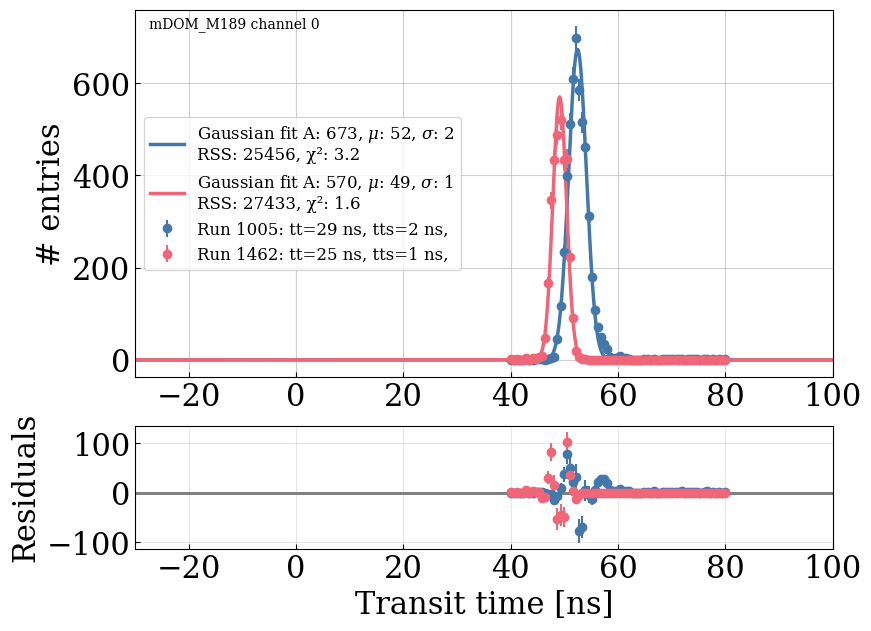

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_0_pmt_DM09136_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_0_pmt_DM09136_1462.json']


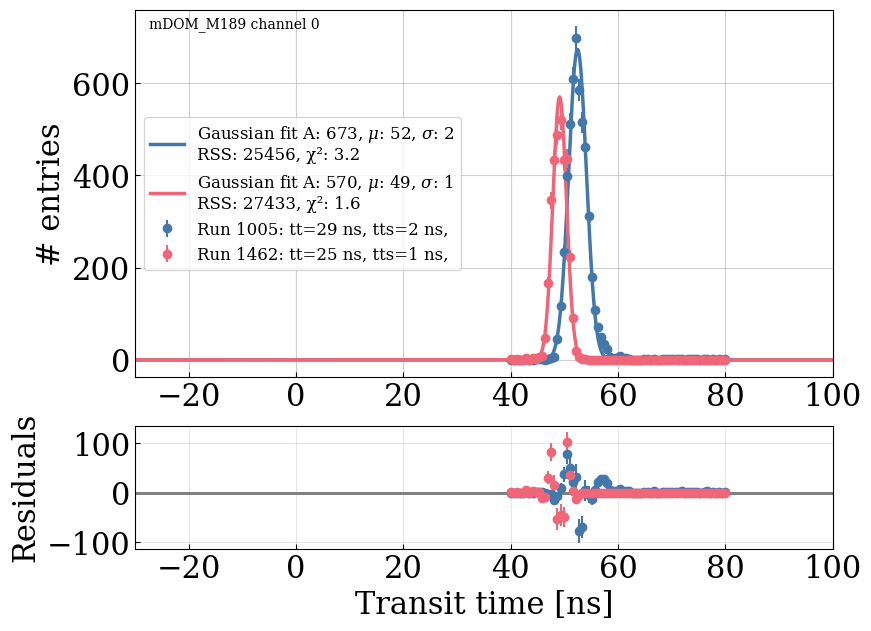

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_1_pmt_DM01459_1462.json']


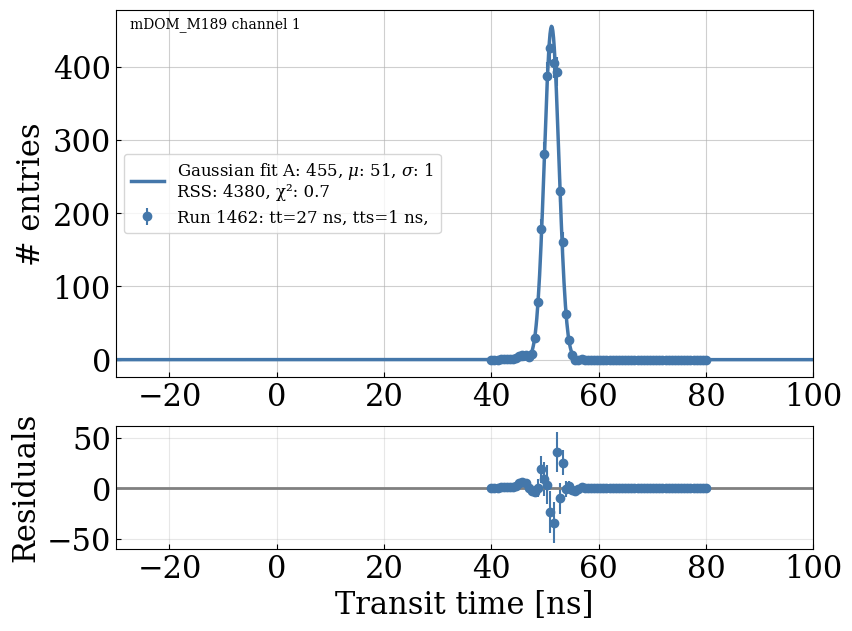

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_1_pmt_DM01459_1462.json']


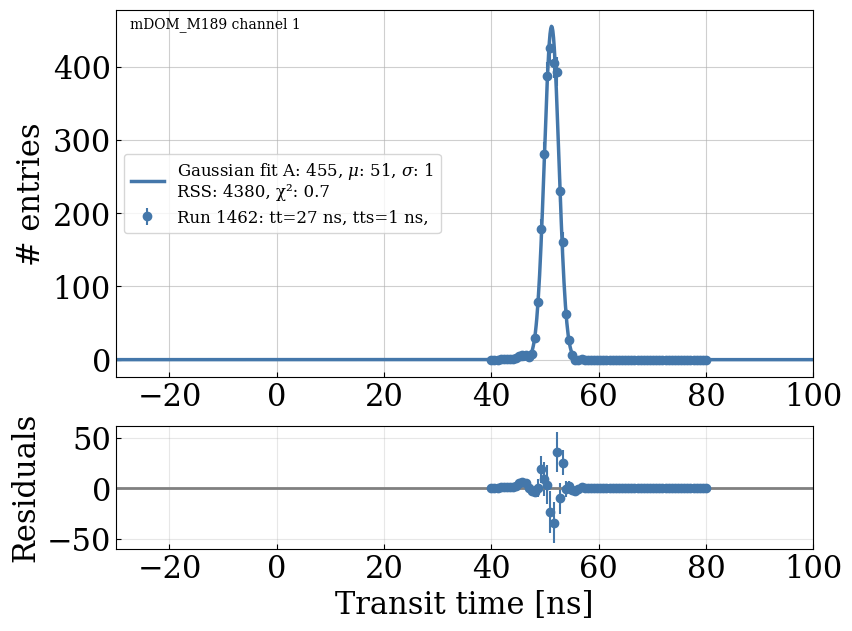

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_2_pmt_DM03468_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_2_pmt_DM03468_1462.json']


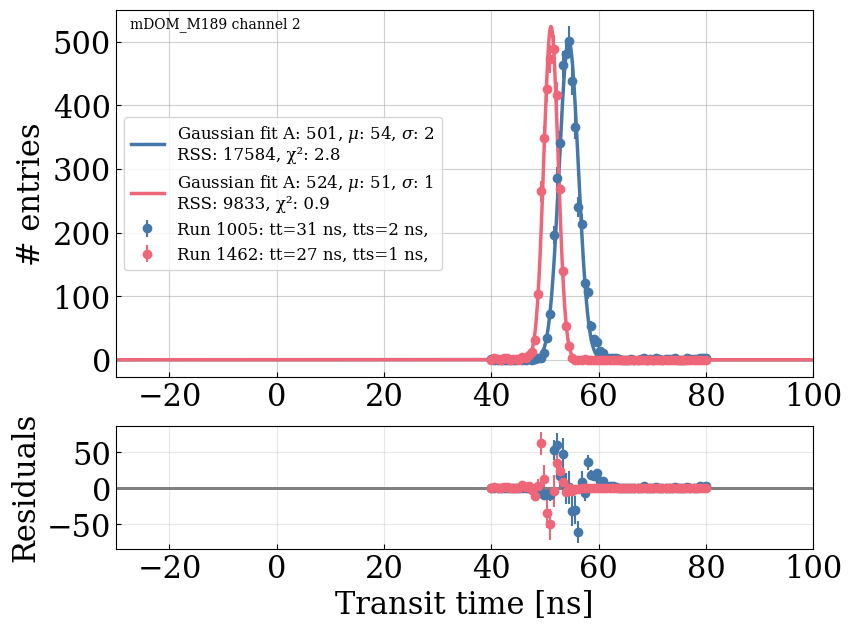

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_2_pmt_DM03468_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_2_pmt_DM03468_1462.json']


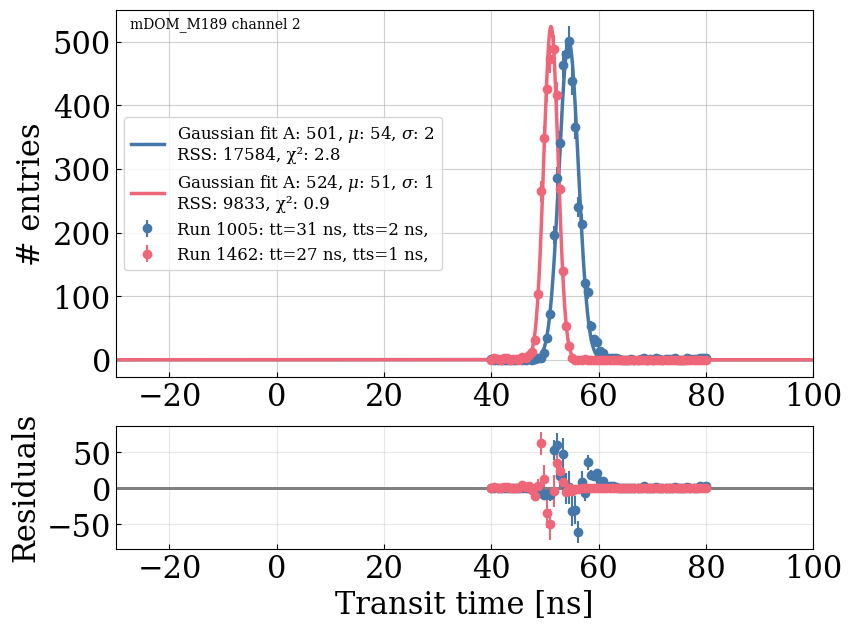

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_3_pmt_DM01498_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_3_pmt_DM01498_1005.json']


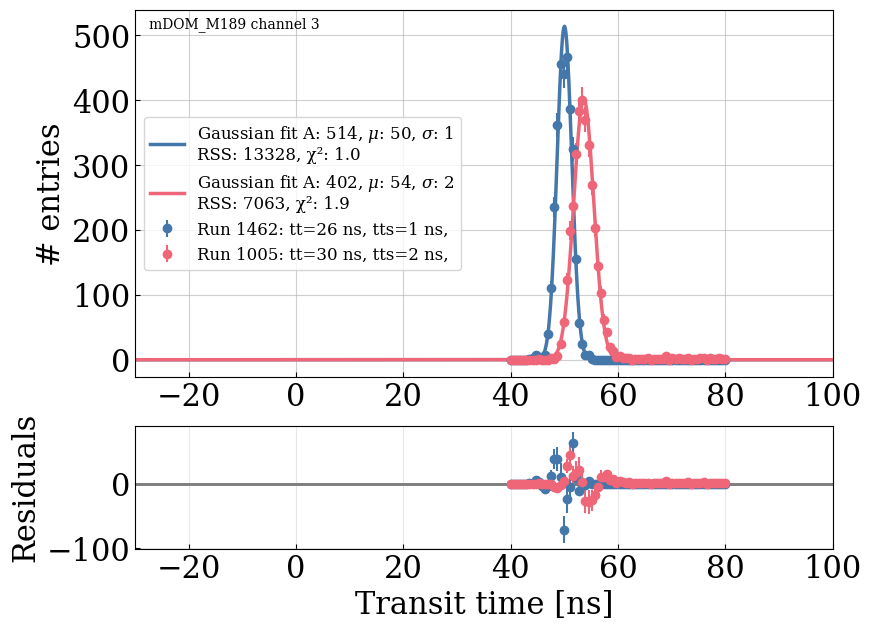

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_3_pmt_DM01498_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_3_pmt_DM01498_1005.json']


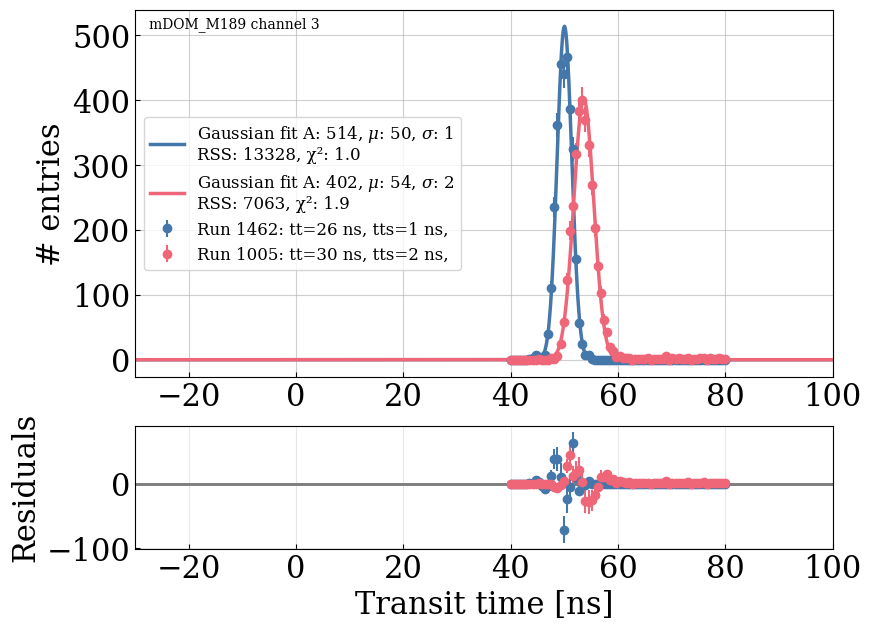

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_4_pmt_DM04641_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_4_pmt_DM04641_1462.json']


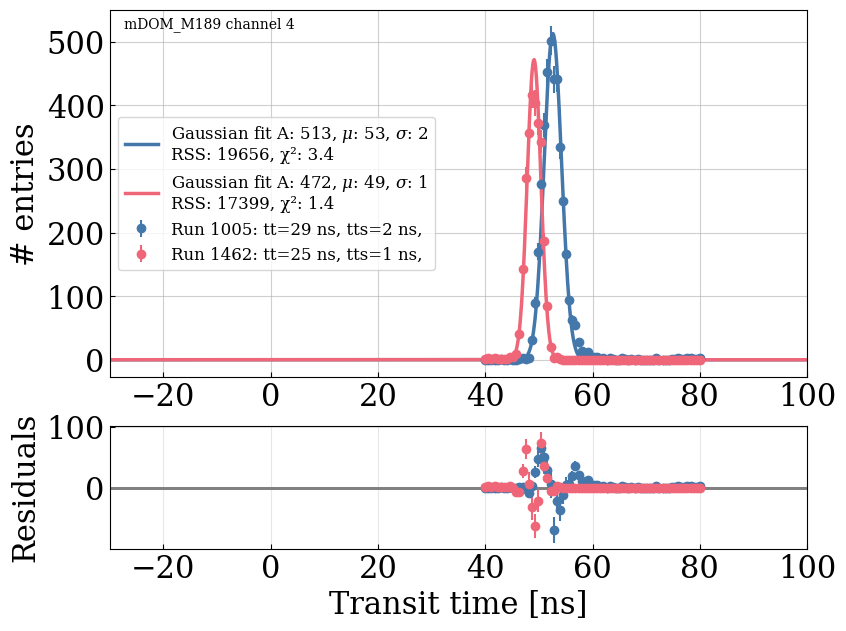

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_4_pmt_DM04641_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_4_pmt_DM04641_1462.json']


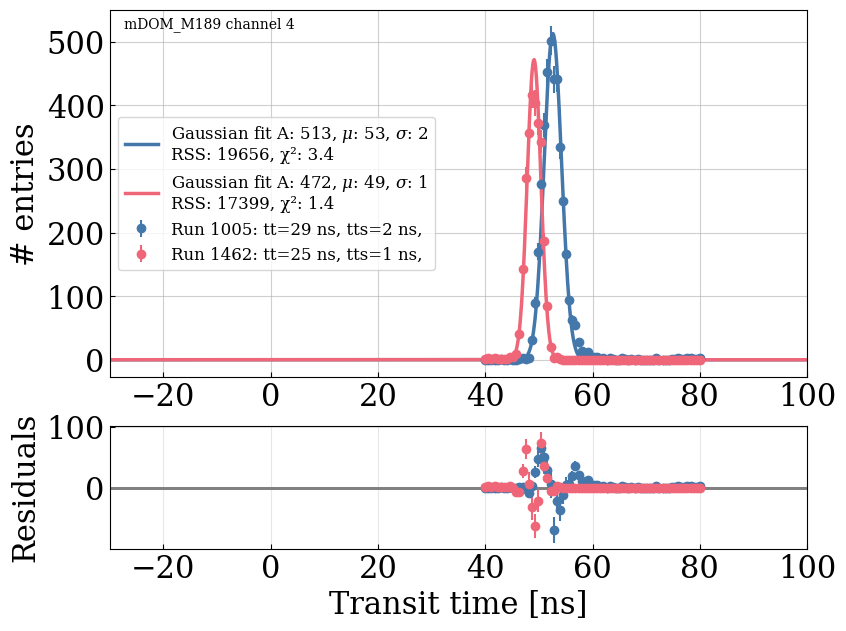

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_5_pmt_DM01761_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_5_pmt_DM01761_1462.json']


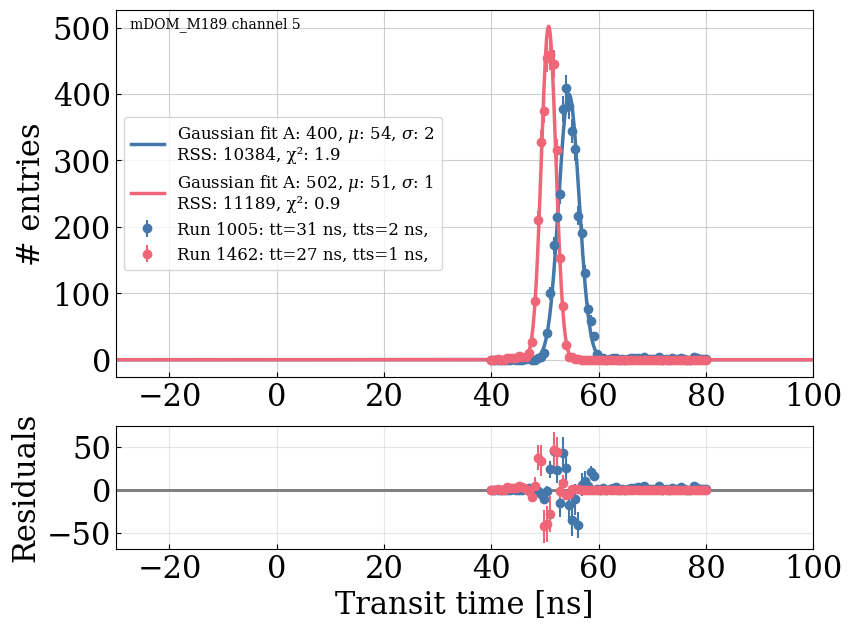

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_5_pmt_DM01761_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_5_pmt_DM01761_1462.json']


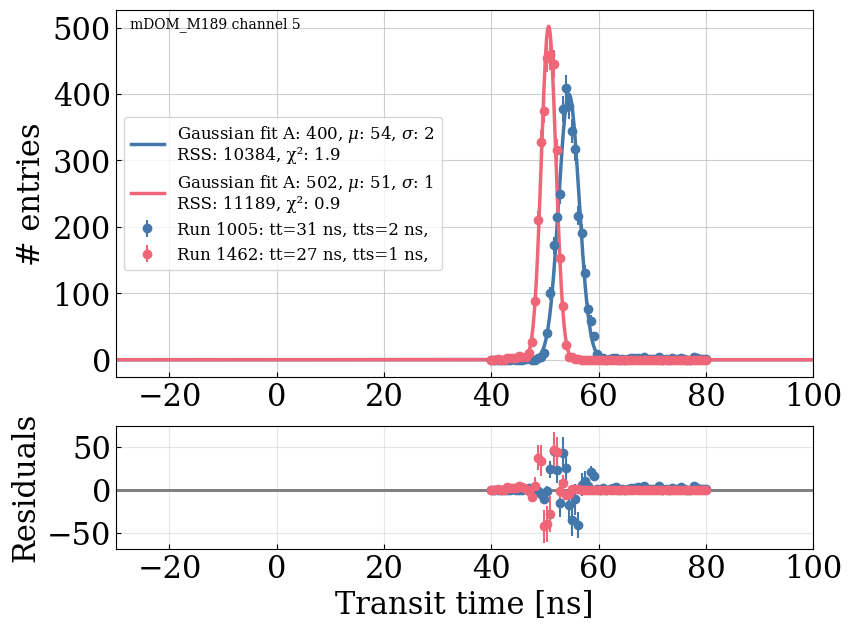

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_6_pmt_DM02822_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_6_pmt_DM02822_1005.json']


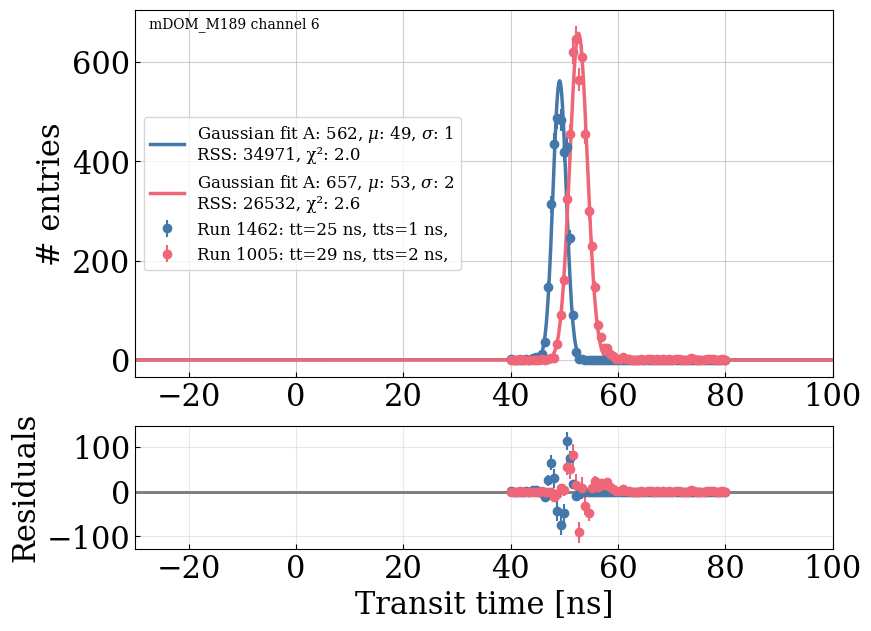

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_6_pmt_DM02822_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_6_pmt_DM02822_1005.json']


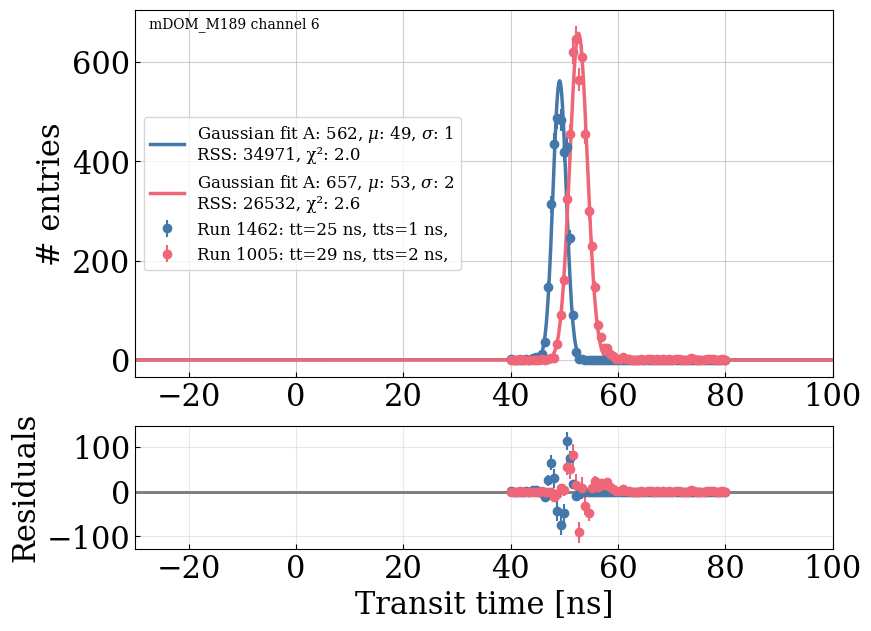

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_7_pmt_DM01306_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_7_pmt_DM01306_1462.json']


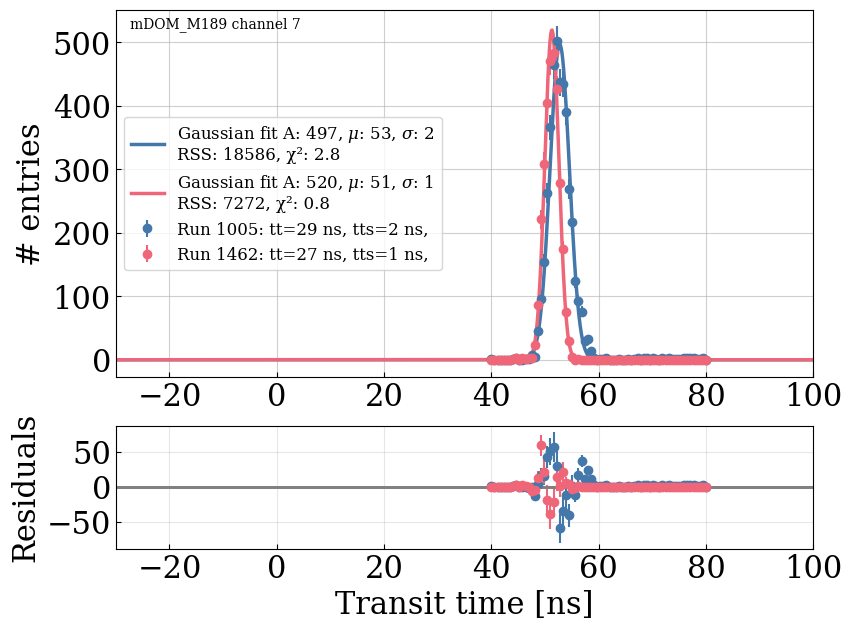

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_7_pmt_DM01306_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_7_pmt_DM01306_1462.json']


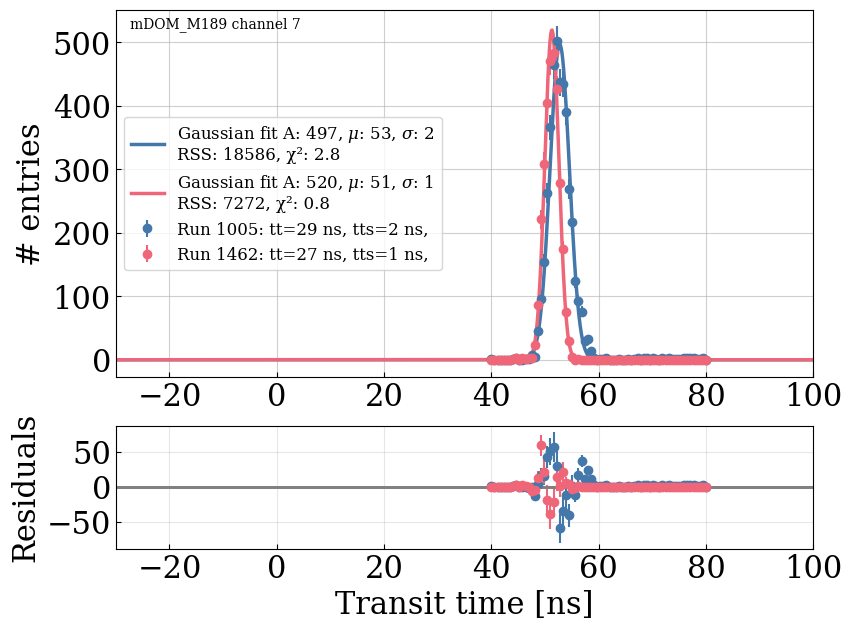

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_8_pmt_DM02193_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_8_pmt_DM02193_1462.json']


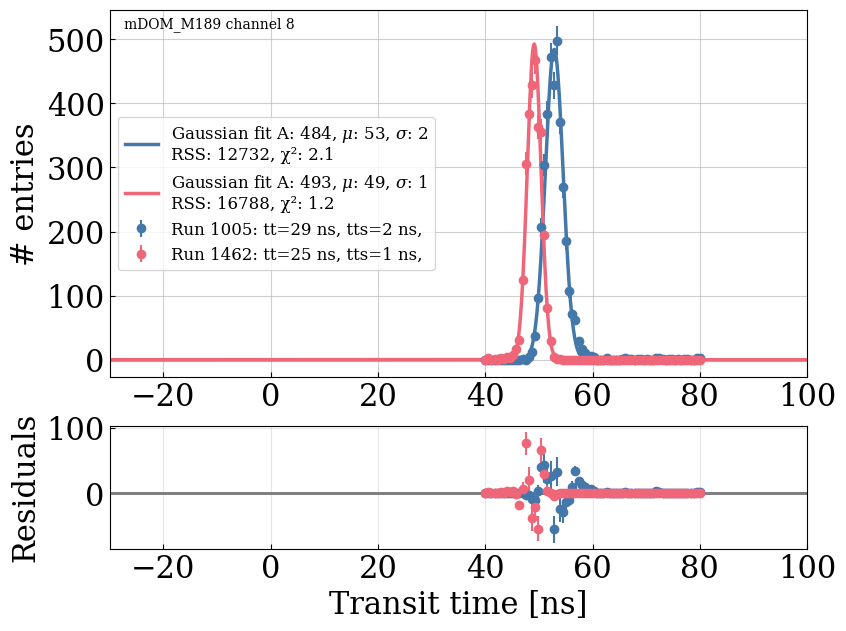

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_8_pmt_DM02193_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_8_pmt_DM02193_1462.json']


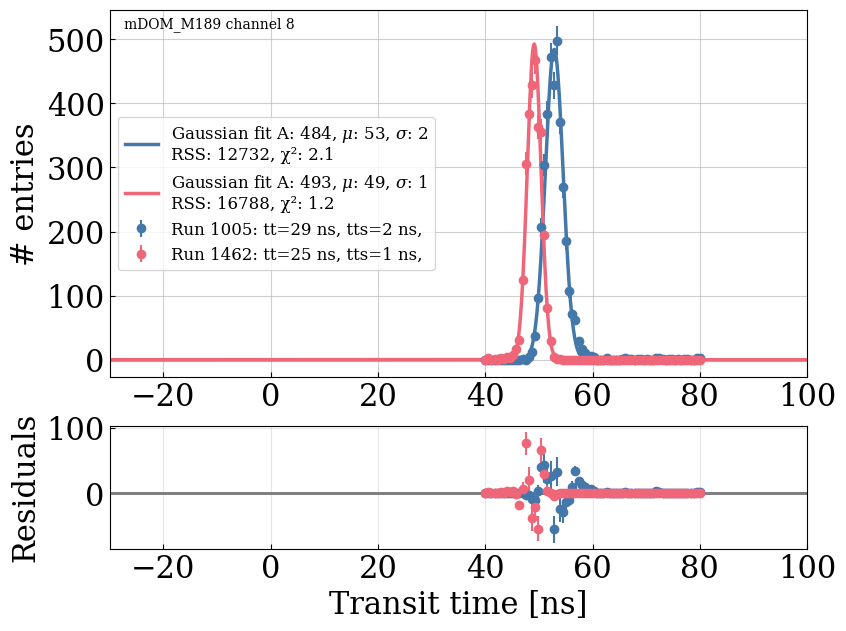

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_9_pmt_DM03944_1462.json']


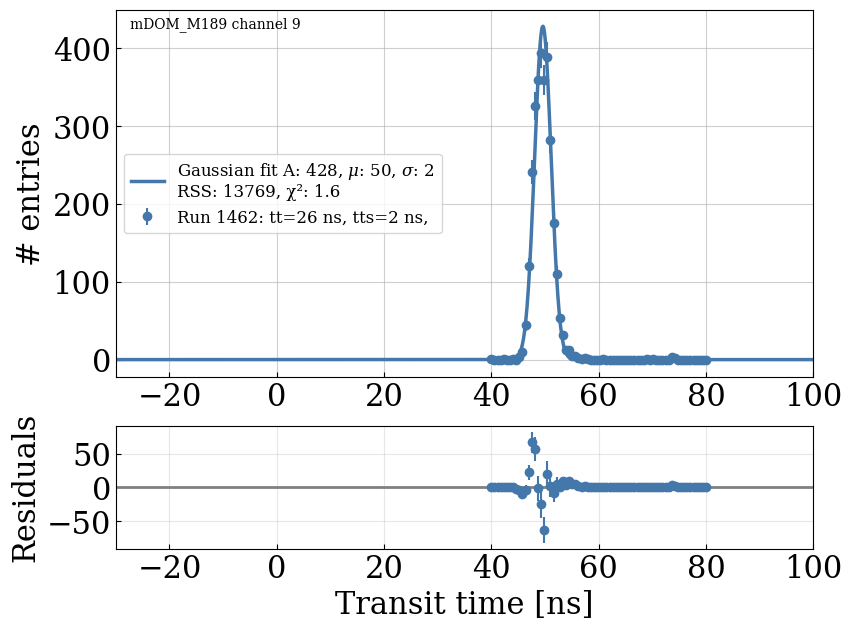

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_9_pmt_DM03944_1462.json']


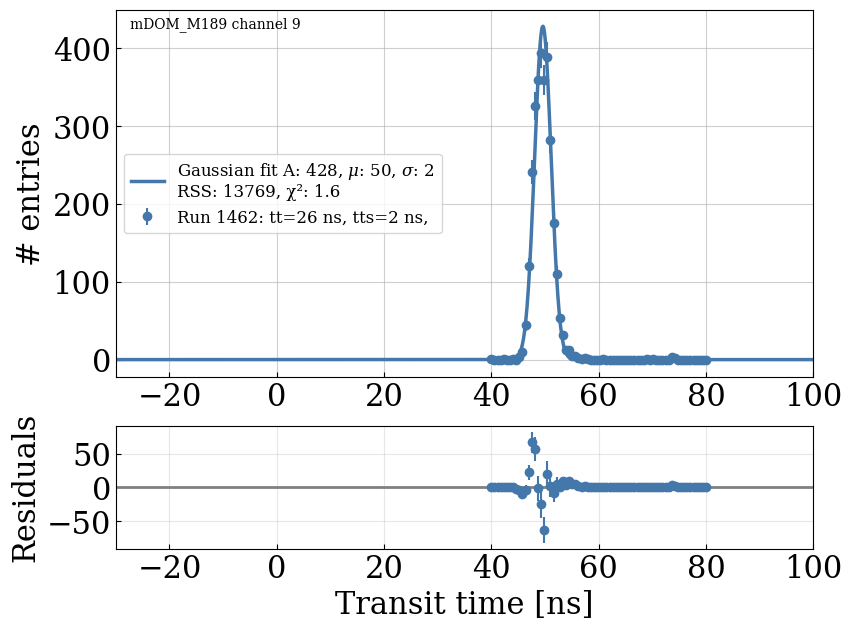

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_10_pmt_DM03813_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_10_pmt_DM03813_1005.json']


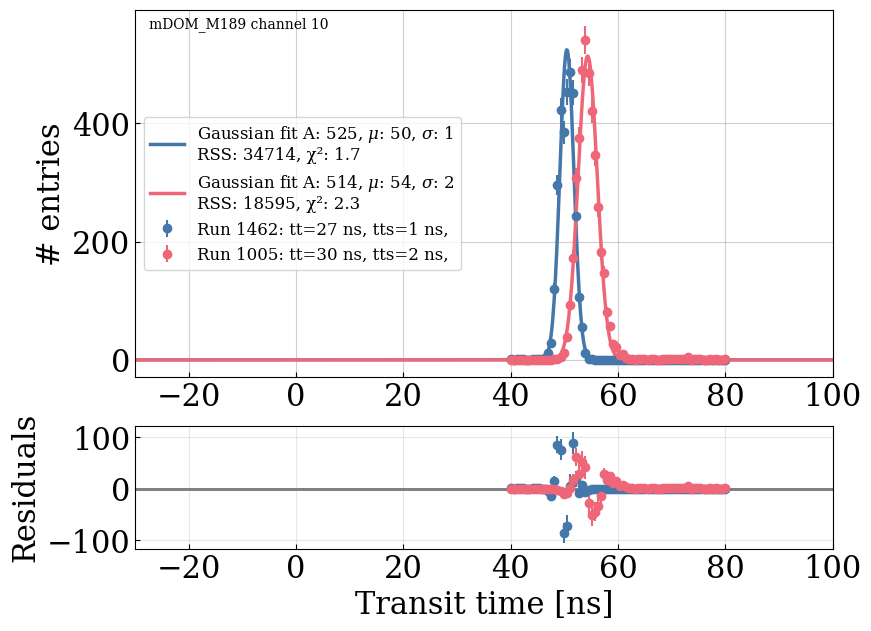

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_10_pmt_DM03813_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_10_pmt_DM03813_1005.json']


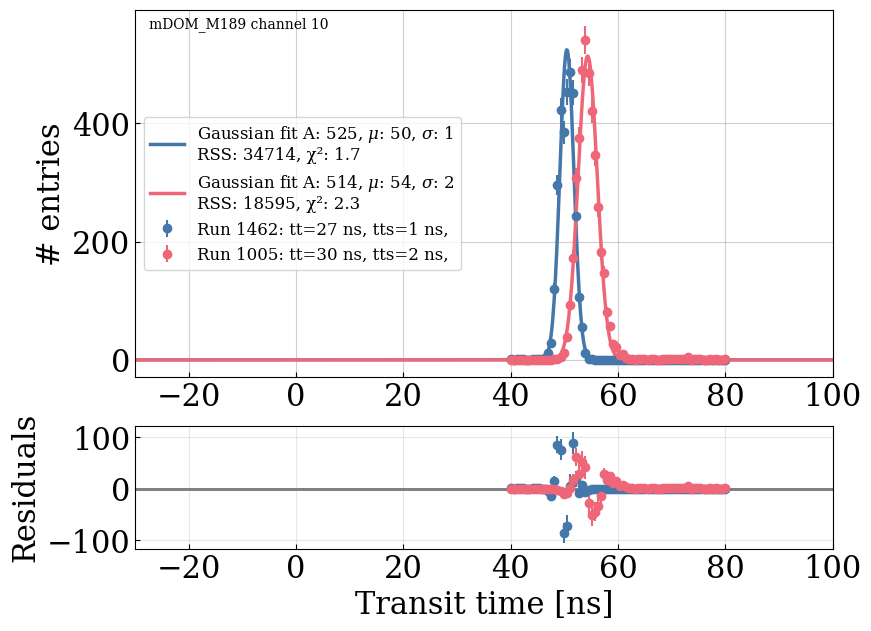

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_11_pmt_DM02628_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_11_pmt_DM02628_1005.json']


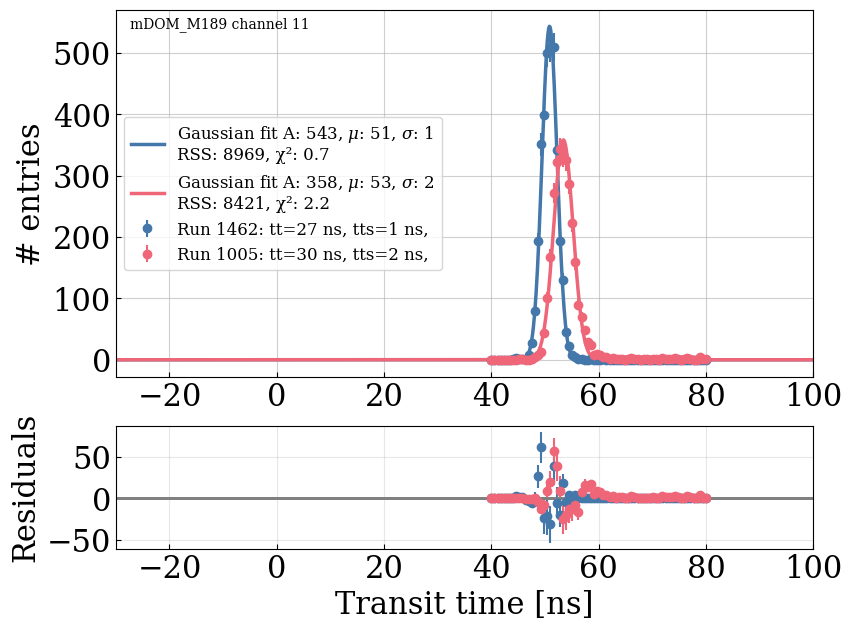

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_11_pmt_DM02628_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_11_pmt_DM02628_1005.json']


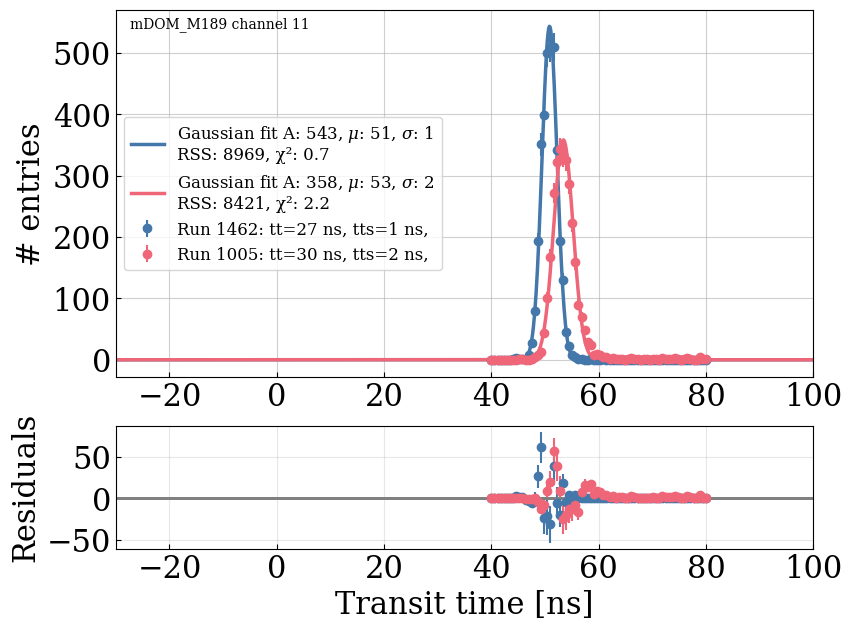

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_12_pmt_DM03743_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_12_pmt_DM03743_1005.json']


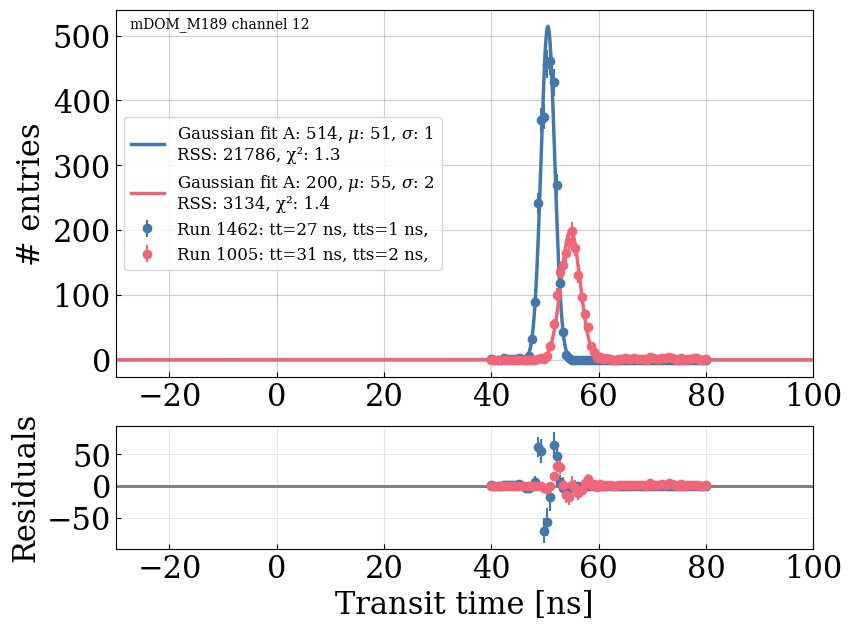

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_12_pmt_DM03743_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_12_pmt_DM03743_1005.json']


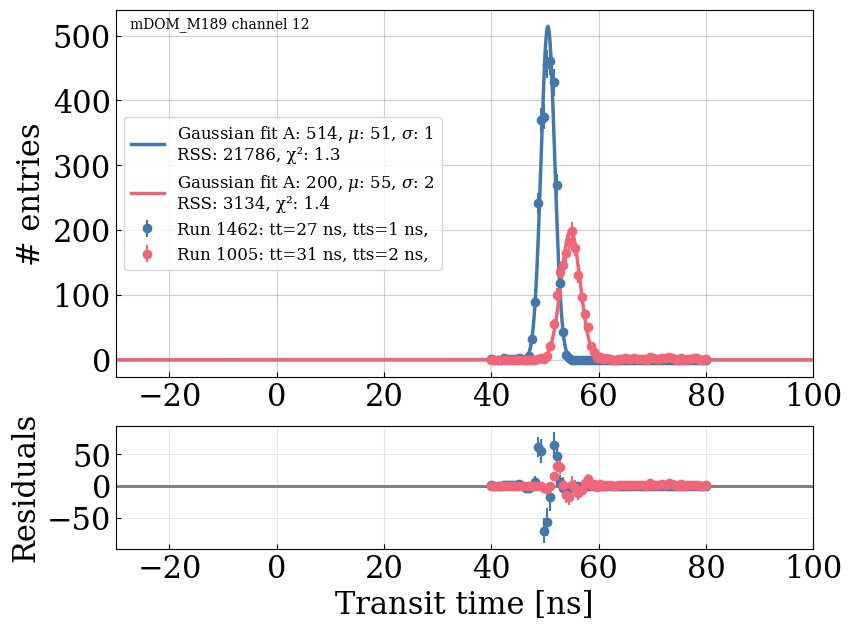

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_13_pmt_DM01477_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_13_pmt_DM01477_1005.json']


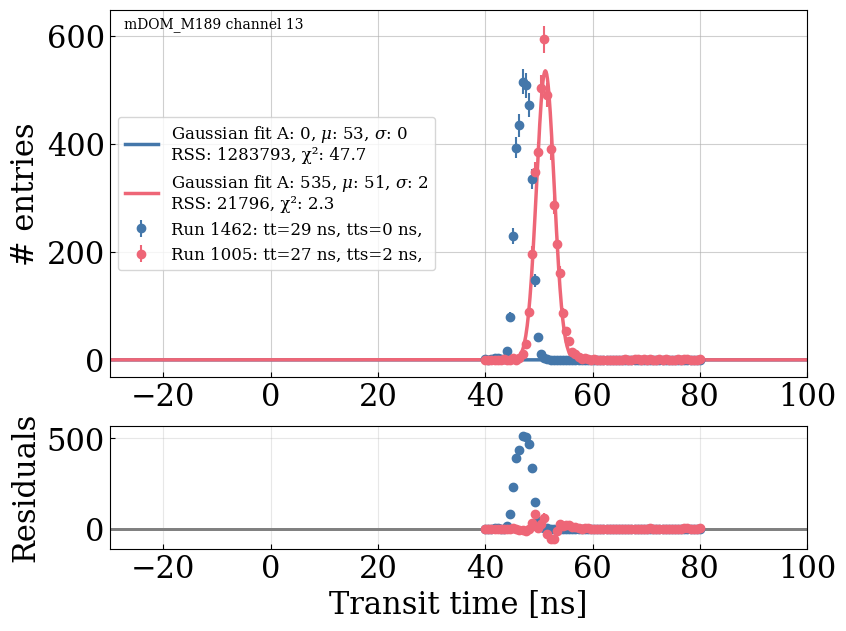

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_13_pmt_DM01477_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_13_pmt_DM01477_1005.json']


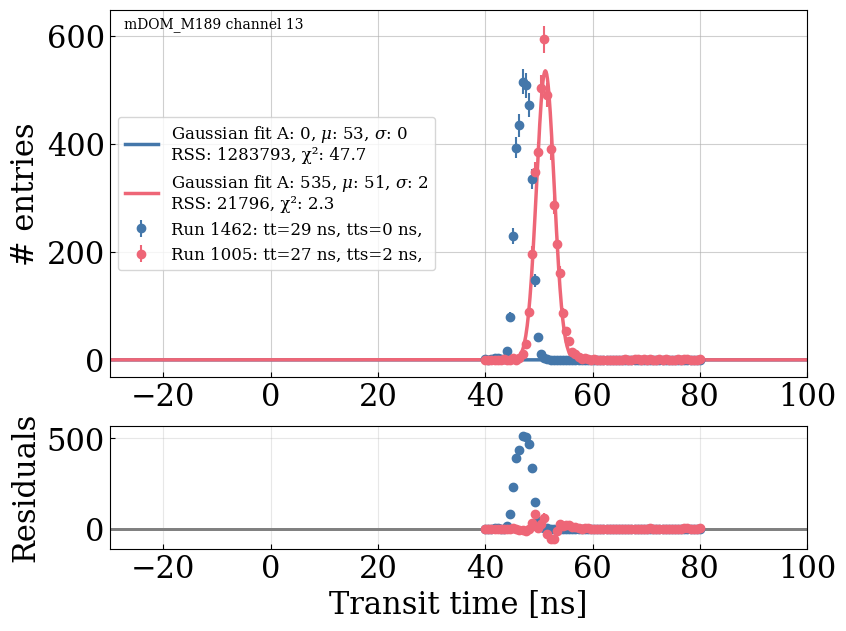

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_14_pmt_DM08863_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_14_pmt_DM08863_1462.json']


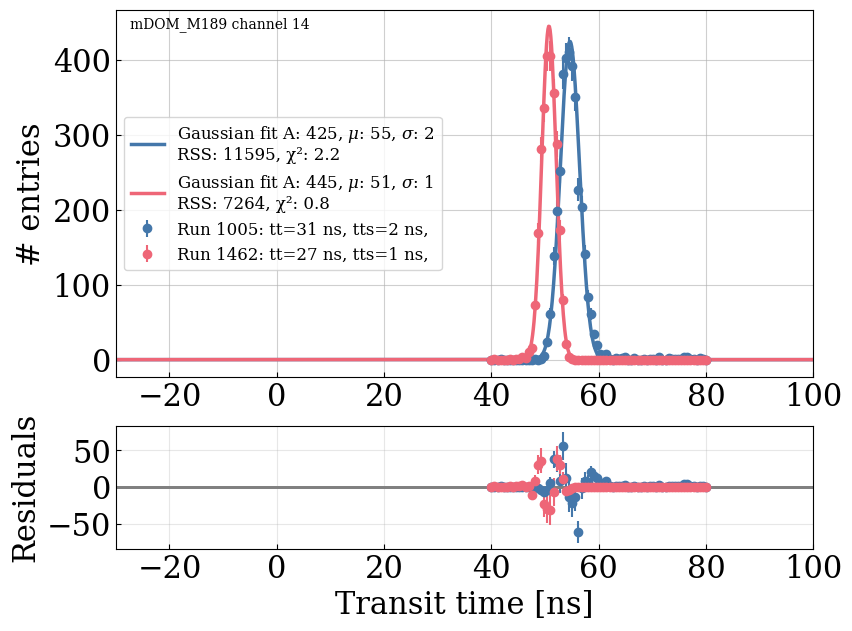

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_14_pmt_DM08863_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_14_pmt_DM08863_1462.json']


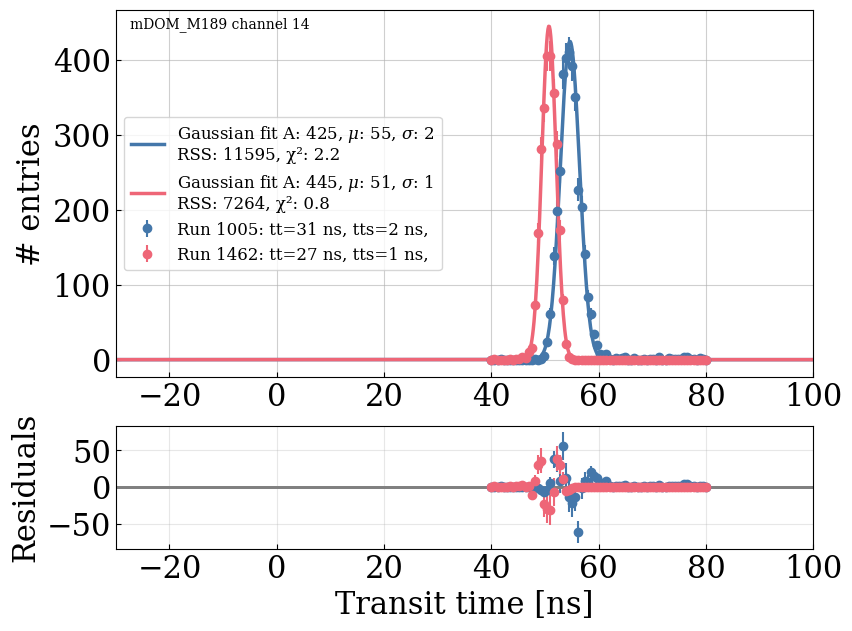

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_15_pmt_DM04190_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_15_pmt_DM04190_1462.json']


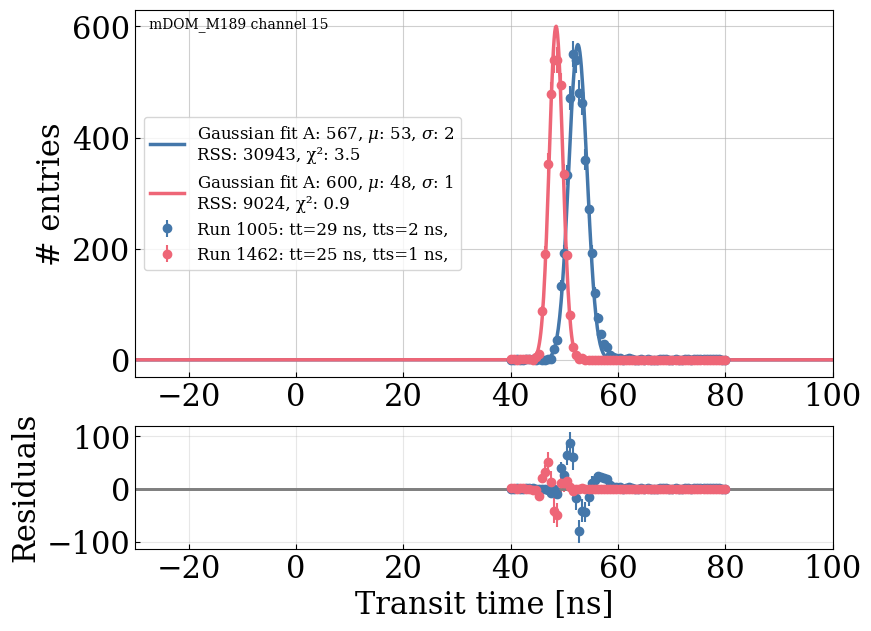

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_15_pmt_DM04190_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_15_pmt_DM04190_1462.json']


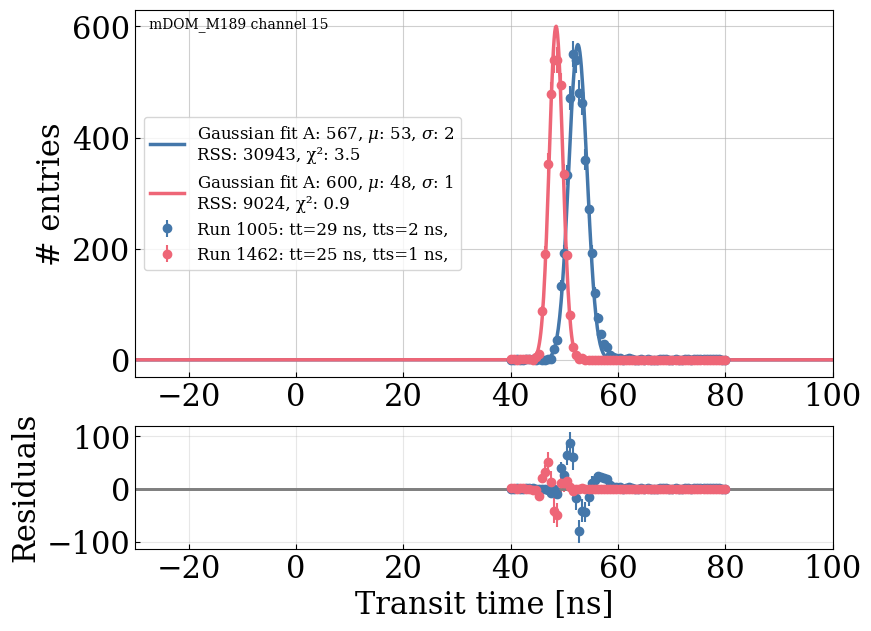

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_16_pmt_DM01705_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_16_pmt_DM01705_1005.json']


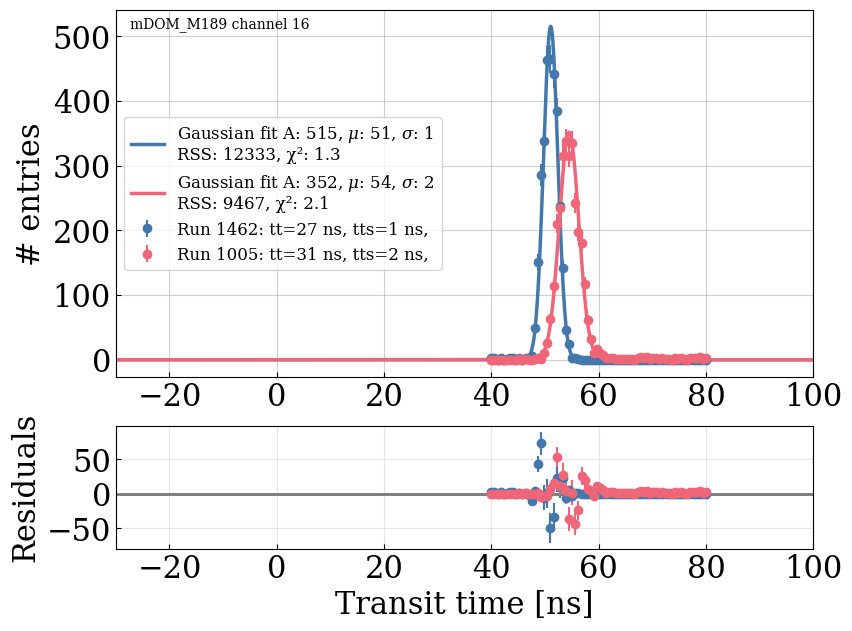

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_16_pmt_DM01705_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_16_pmt_DM01705_1005.json']


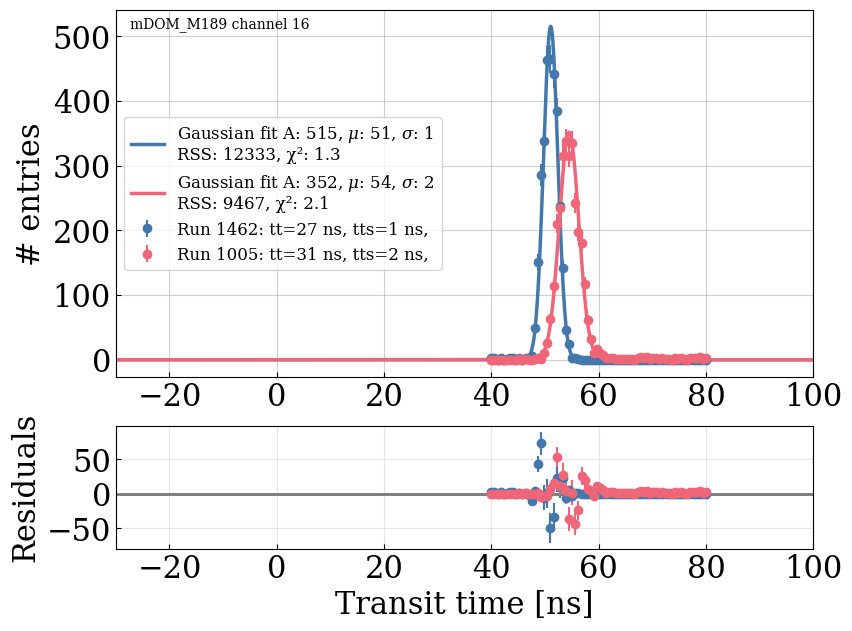

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_17_pmt_DM07914_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_17_pmt_DM07914_1462.json']


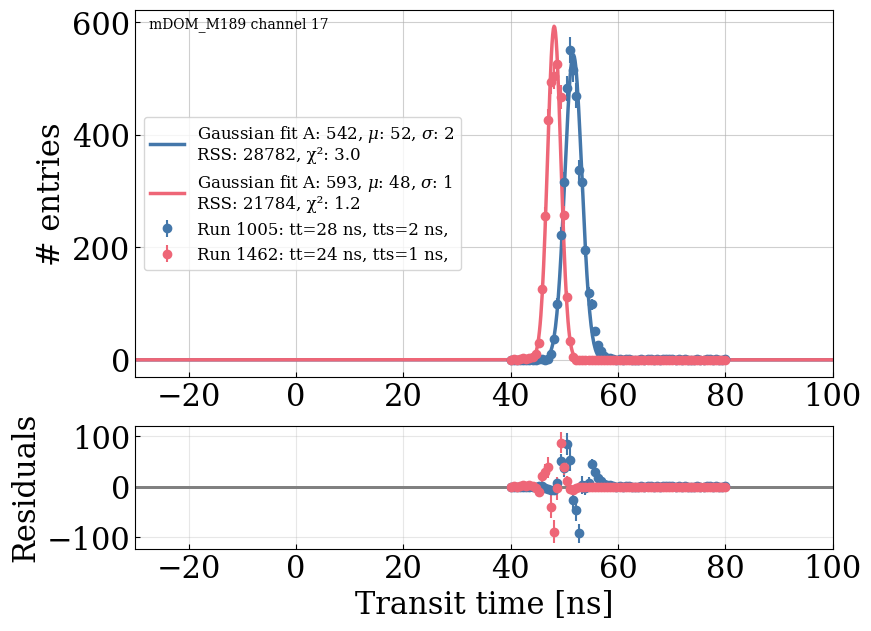

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_17_pmt_DM07914_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_17_pmt_DM07914_1462.json']


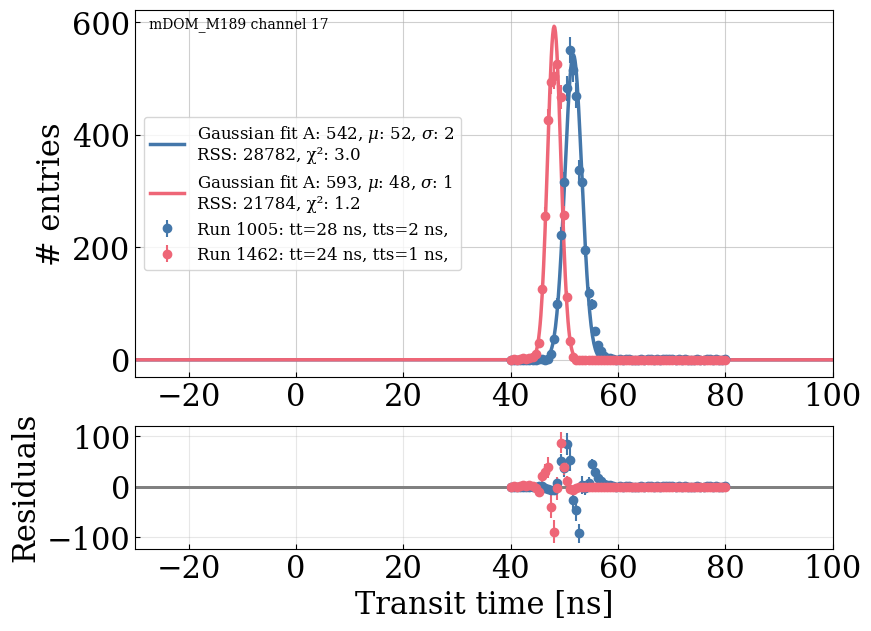

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_18_pmt_DM09208_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_18_pmt_DM09208_1005.json']


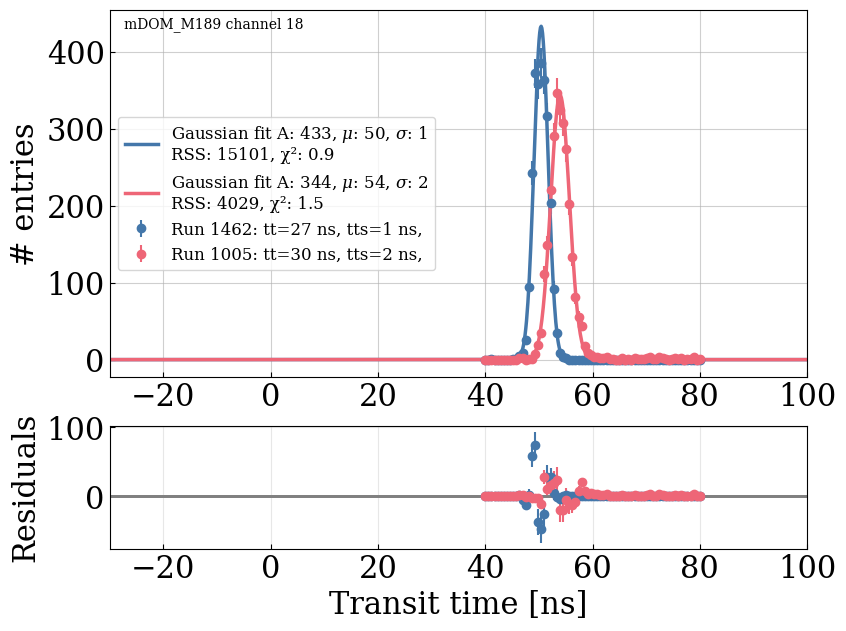

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_18_pmt_DM09208_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_18_pmt_DM09208_1005.json']


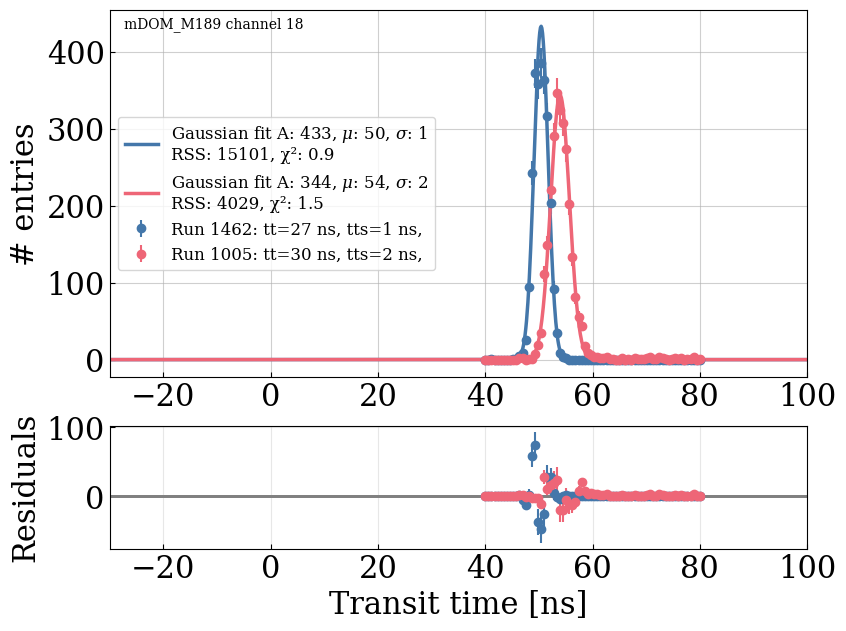

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_19_pmt_DM00600_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_19_pmt_DM00600_1005.json']


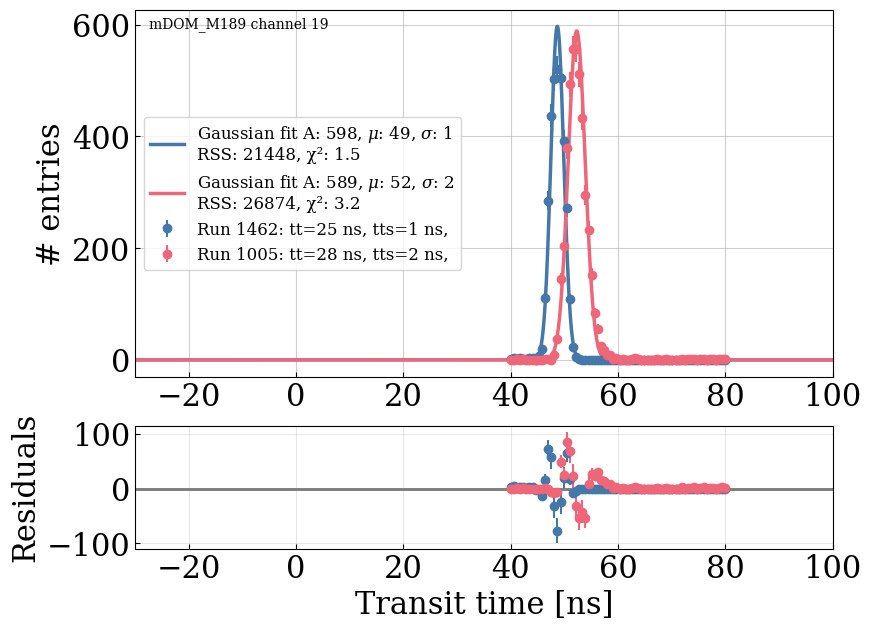

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_19_pmt_DM00600_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_19_pmt_DM00600_1005.json']


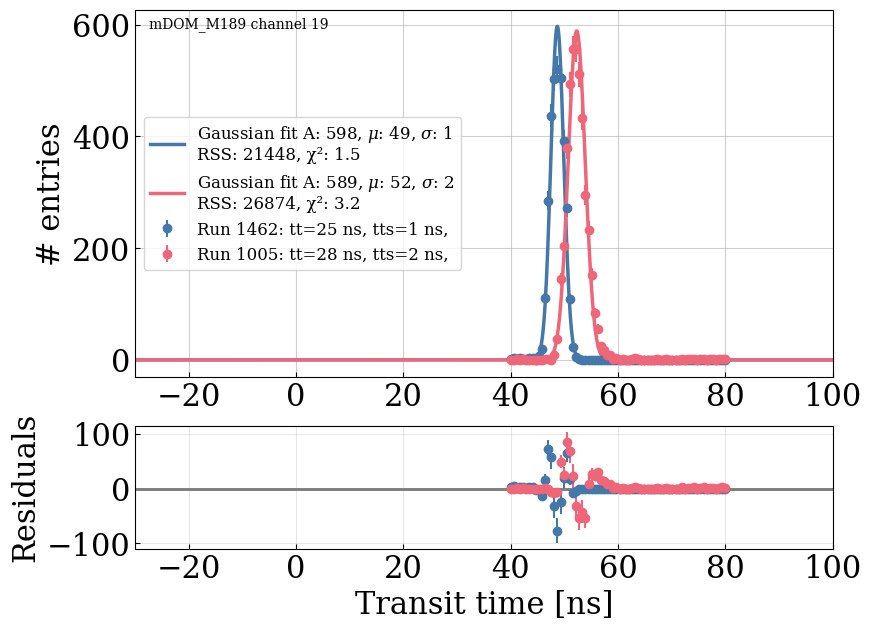

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_20_pmt_DM06403_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_20_pmt_DM06403_1005.json']


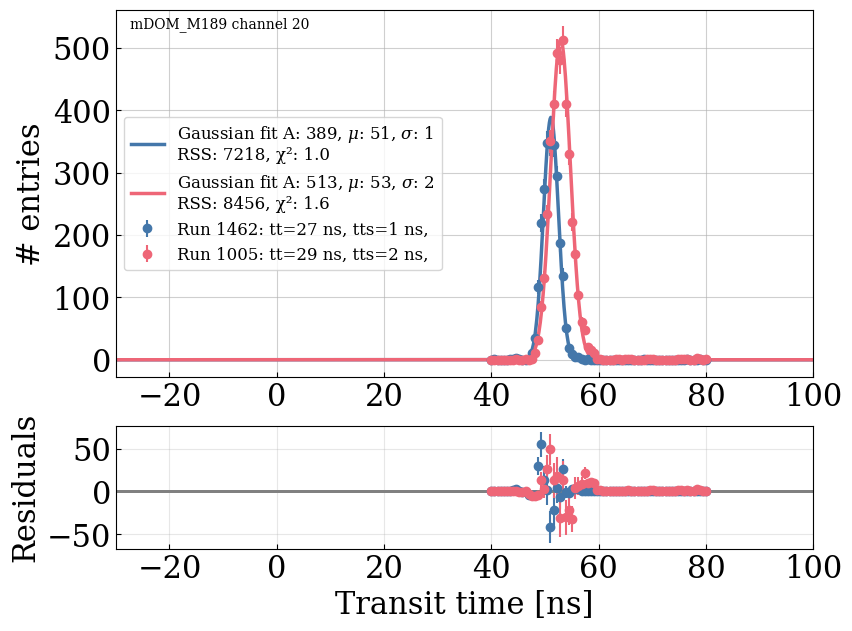

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_20_pmt_DM06403_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_20_pmt_DM06403_1005.json']


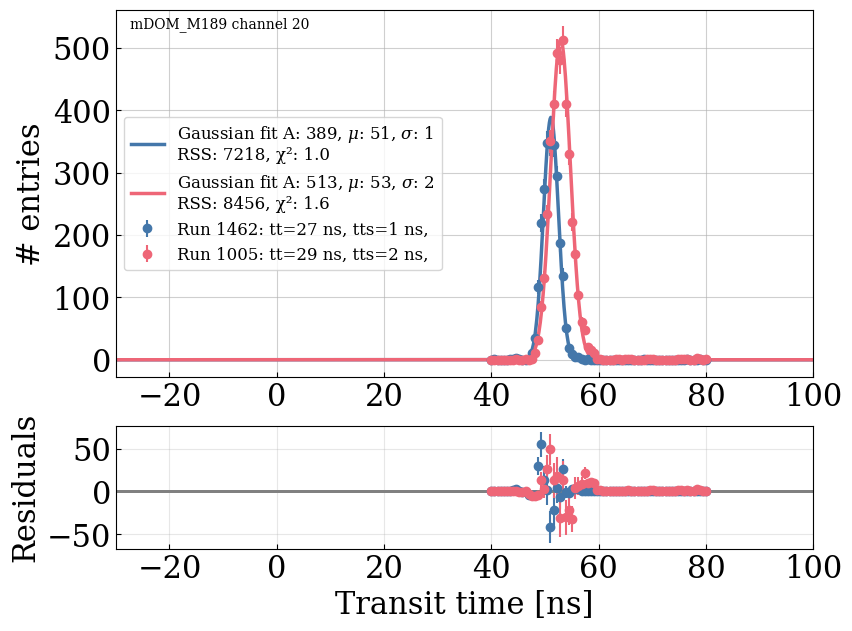

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_21_pmt_DM08948_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_21_pmt_DM08948_1005.json']


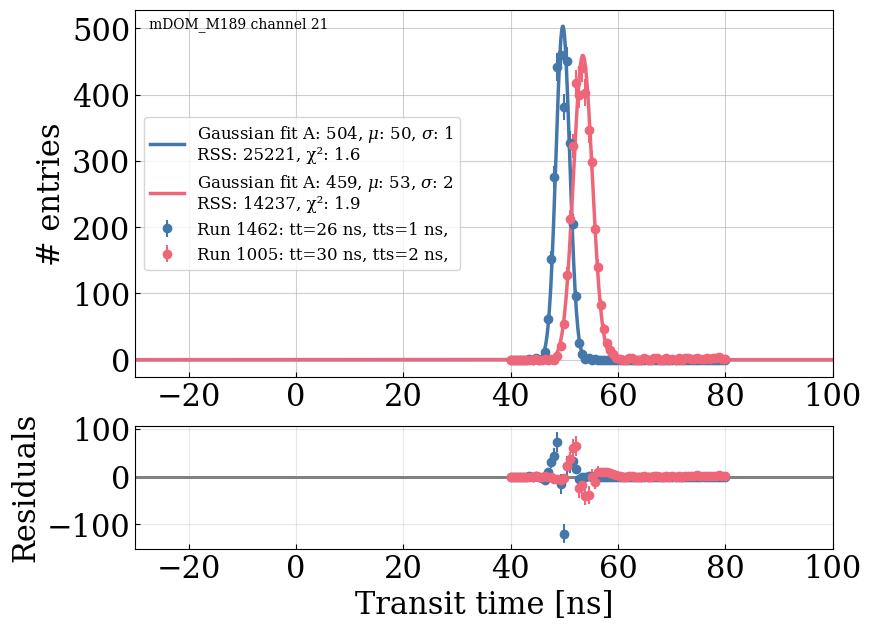

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_21_pmt_DM08948_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_21_pmt_DM08948_1005.json']


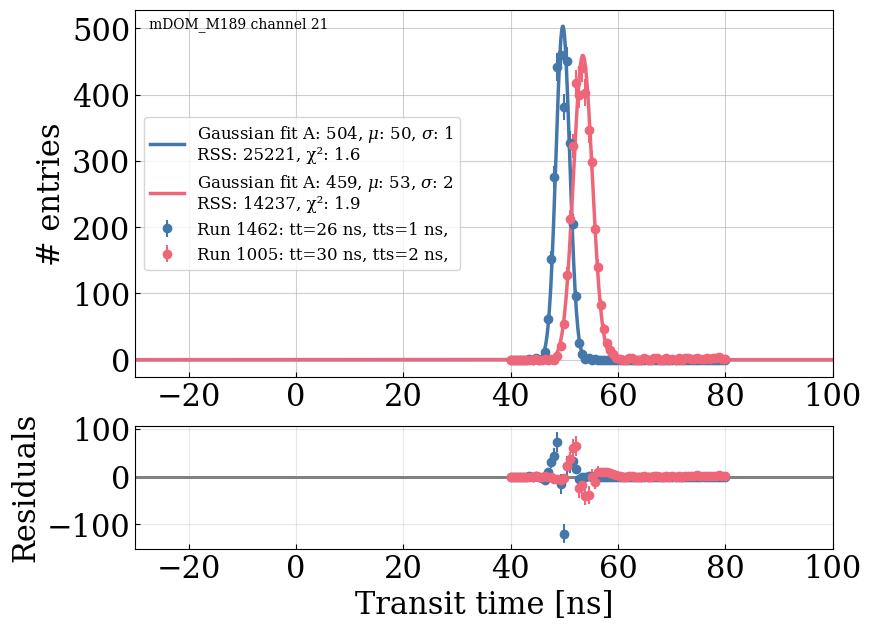

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_22_pmt_DM07263_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_22_pmt_DM07263_1005.json']


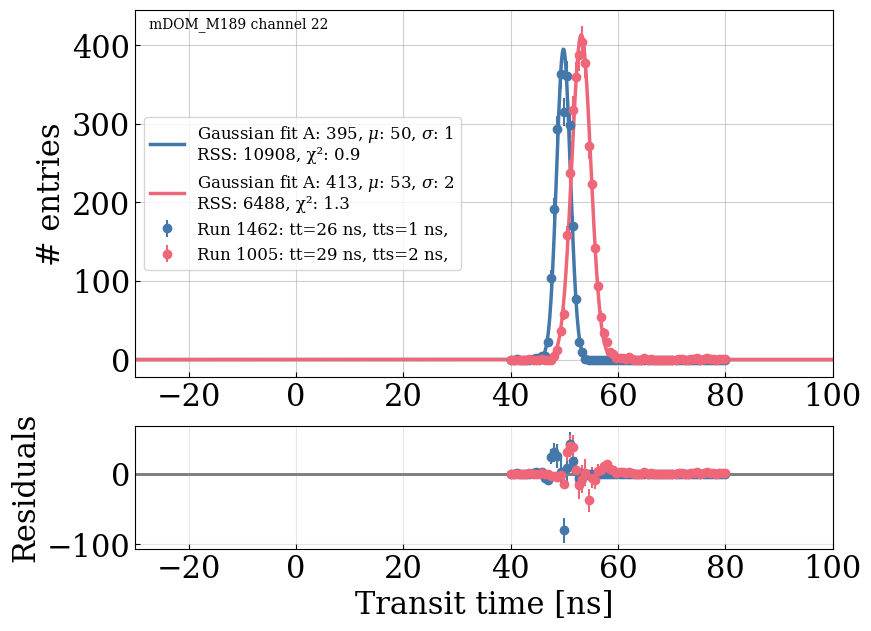

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_22_pmt_DM07263_1462.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_22_pmt_DM07263_1005.json']


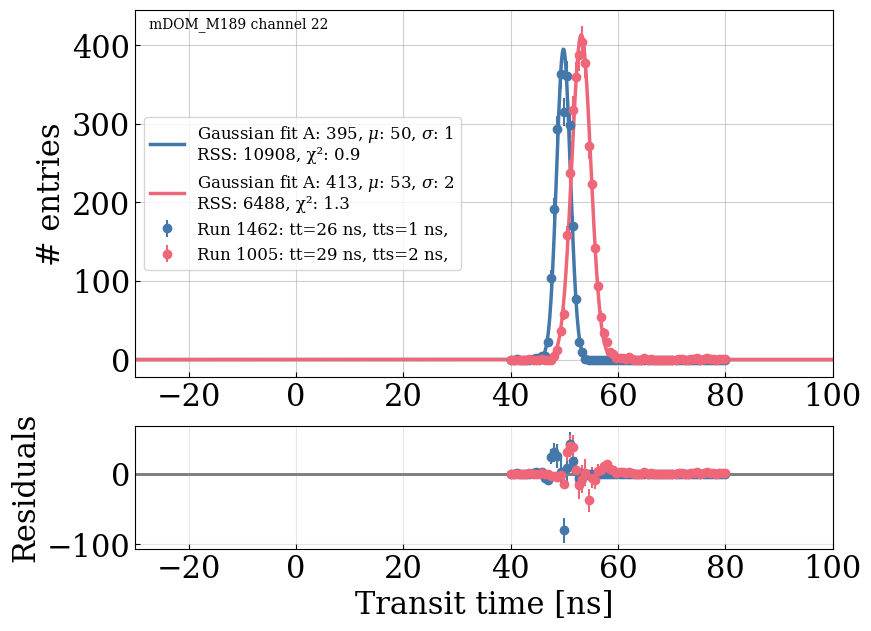

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_23_pmt_DM03775_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_23_pmt_DM03775_1462.json']


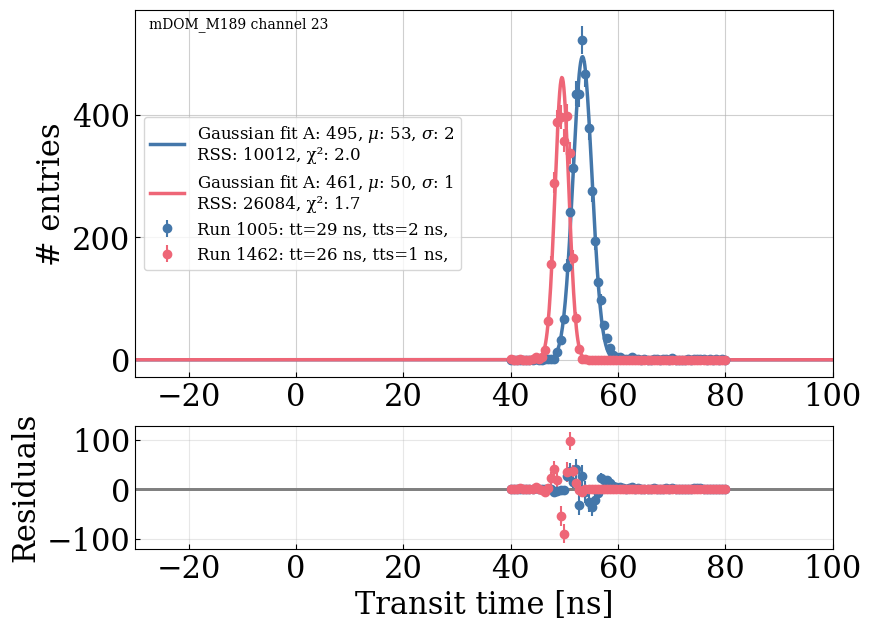

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_23_pmt_DM03775_1005.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M189_v1/mDOM_M189_v1_ch_23_pmt_DM03775_1462.json']


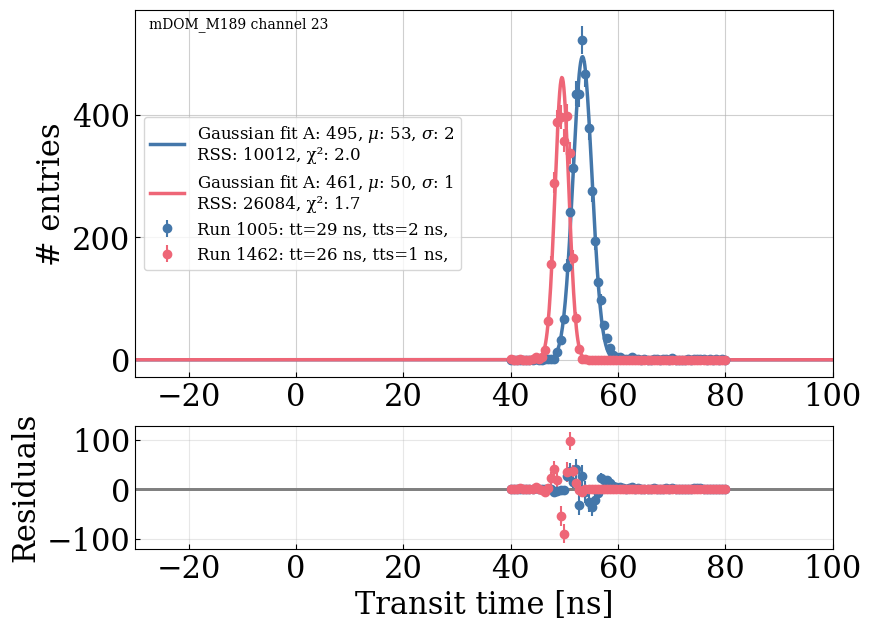

In [254]:
keys = list(recheck_mdom_list.keys())[5] 
imdom = keys  
print(imdom)
print(recheck_mdom_list[imdom])
my_runs = recheck_mdom_list[imdom][1]
msu_run = recheck_mdom_list[imdom][0]
all_runs = my_runs + [msu_run]
all_runs = [int(run) for run in all_runs]
for ichannel in range(0, 24):
    # plot_single_transit_time_run_residual(imdom, ichannel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=all_runs)
    # plot_single_transit_time_run_residual(imdom, ichannel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
    plot_single_gaussian_fit_residual(imdom, ichannel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=all_runs)
    plot_single_gaussian_fit_residual(imdom, ichannel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

In [166]:
# for imdom in recheck_mdom_list:    
#     print(imdom)
#     print(recheck_mdom_list[imdom])
#     my_runs = recheck_mdom_list[imdom][1]
#     msu_run = recheck_mdom_list[imdom][0]
#     all_runs = my_runs + [msu_run]
#     all_runs = [int(run) for run in all_runs]
#     for ichannel in range(1, 2):
#         plot_single_transit_time_run_residual(imdom, ichannel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=all_runs)

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M061_v1/mDOM_M061_v1_ch_3_pmt_DM03158_789.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M061_v1/mDOM_M061_v1_ch_3_pmt_DM03158_791.json']
available channels for mDOM_M061: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M061_v1/mDOM_M061_v1_ch_3_pmt_DM03158_789.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M061_v1/mDOM_M061_v1_ch_3_pmt_DM03158_791.json']
mdom mDOM_M061 channel 3 Run 789: tt 42.0 ns, tts 3.1 ns, a 172.6, b 54.0, c 3.1, chi2 8.0, hv 81.9 V


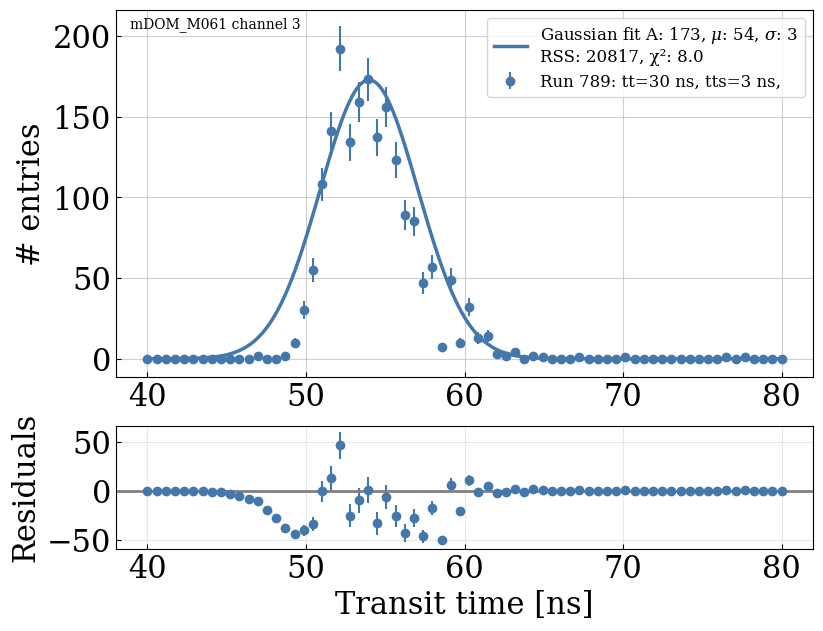

In [167]:
plot_single_transit_time_run_residual("mDOM_M061", 3, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[789])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M182_v1/mDOM_M182_v1_ch_3_pmt_DM12263_1012.json']
available channels for mDOM_M182: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M182_v1/mDOM_M182_v1_ch_13_pmt_DM09482_1012.json']
mdom mDOM_M182 channel 13 Run 1012: tt 33.7 ns, tts 3.2 ns, a 445.5, b 45.7, c 3.2, chi2 2.5, hv 93.7 V


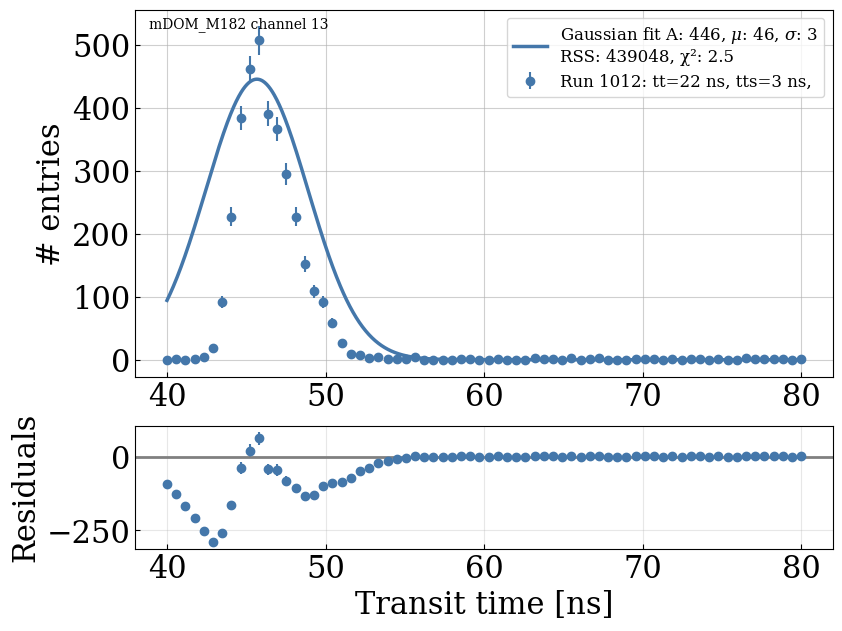

In [168]:
plot_single_transit_time_run_residual("mDOM_M182", 13, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1012])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M182_v1/mDOM_M182_v1_ch_3_pmt_DM12263_1012.json']
available channels for mDOM_M182: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M182_v1/mDOM_M182_v1_ch_13_pmt_DM09482_1012.json']
mdom mDOM_M182 channel 13 Run 1012: tt 33.7 ns, tts 3.2 ns, a 445.5, b 45.7, c 3.2, chi2 2.5, hv 93.7 V


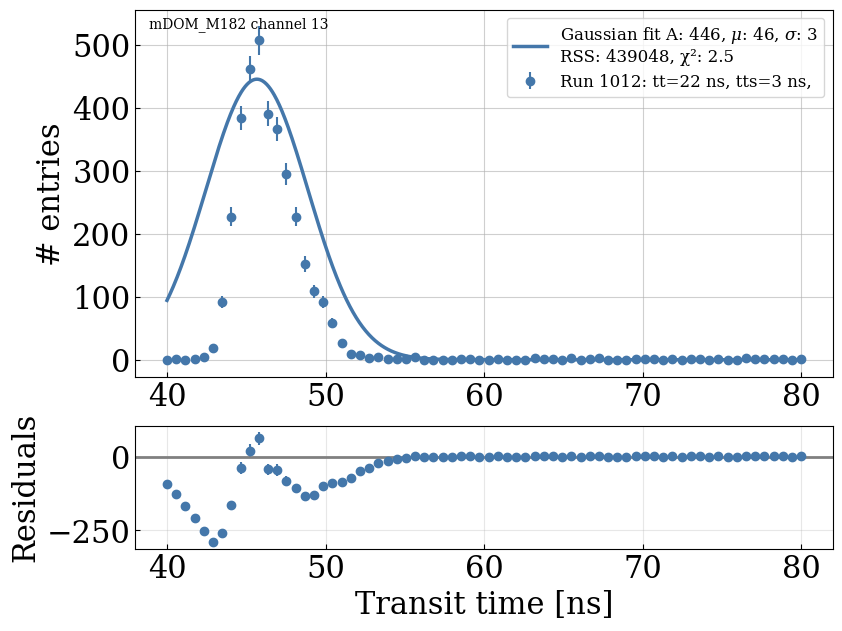

In [169]:
plot_single_transit_time_run_residual("mDOM_M182", 13, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M182_v1/mDOM_M182_v1_ch_13_pmt_DM09482_1012.json']


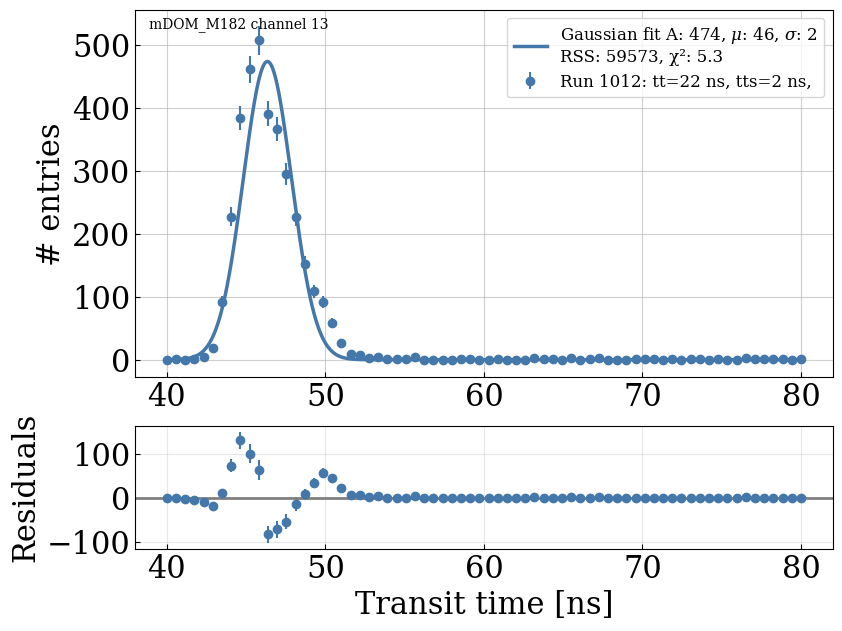

In [170]:
plot_single_gaussian_fit_residual("mDOM_M182", 13, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_853.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_798.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_426.json', '/Users/epaudel/research_ua/icecube/upgrade/

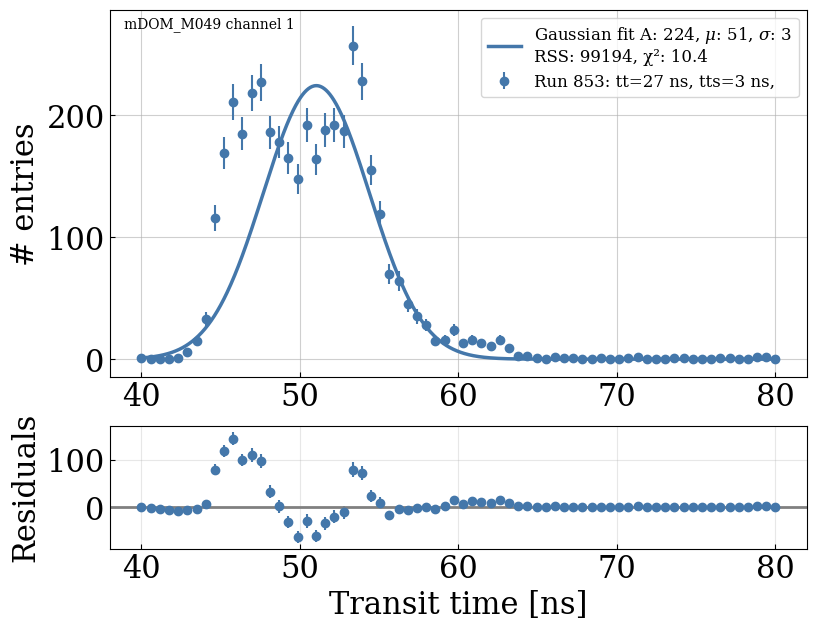

In [171]:
plot_single_gaussian_fit_residual("mDOM_M049", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[853])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_853.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_798.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_426.json', '/Users/epaudel/research_ua/icecube/upgrade/

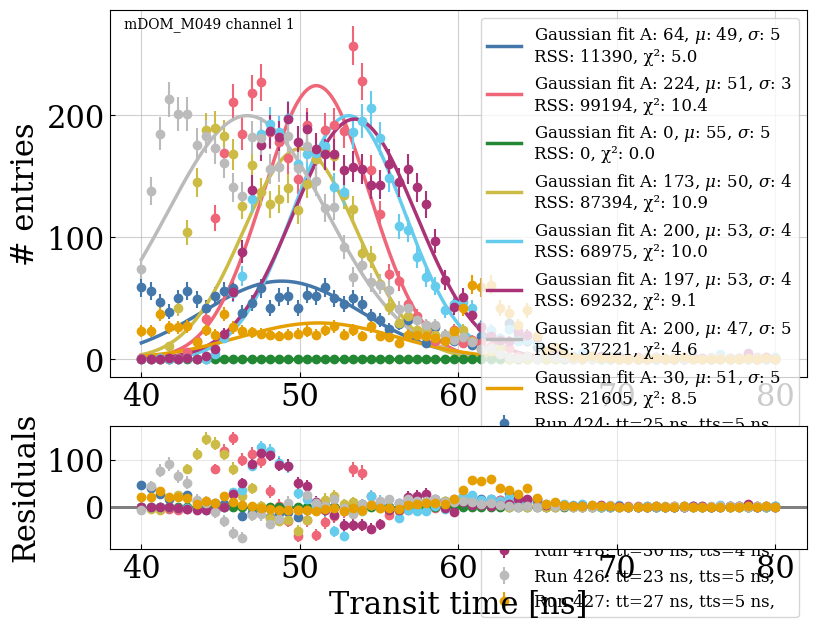

In [172]:
plot_single_gaussian_fit_residual("mDOM_M049", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_798.json', '/Users/epaudel/research_ua/icecube/upgrade

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_853.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_798.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_1_pmt_DM04656_426.json', '/Users/epaudel/research_ua/icecube/upgrade/

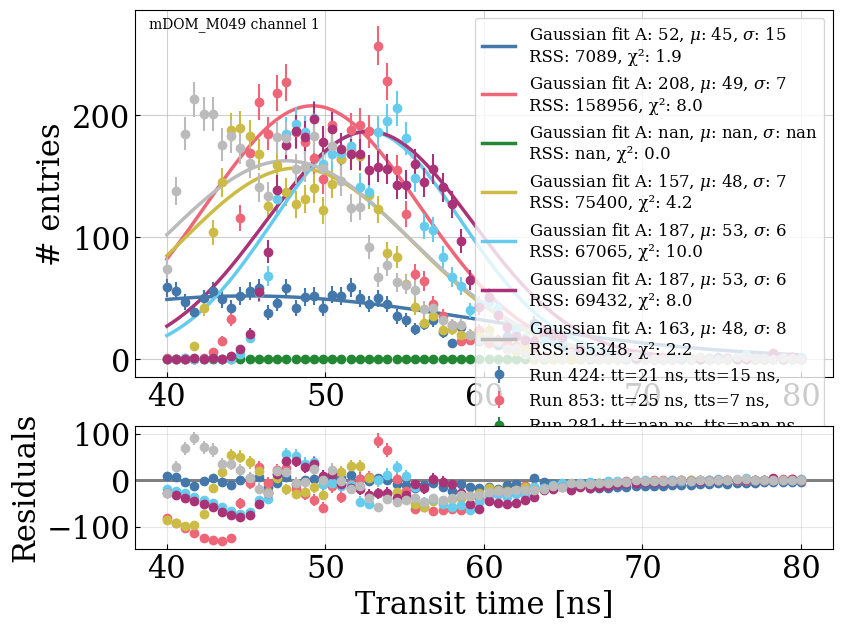

In [173]:
plot_single_transit_time_run_residual("mDOM_M049", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[424,853,281,798,320,418,426])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_798.json', '/Users/epaudel/research_ua/icecube/upgrade

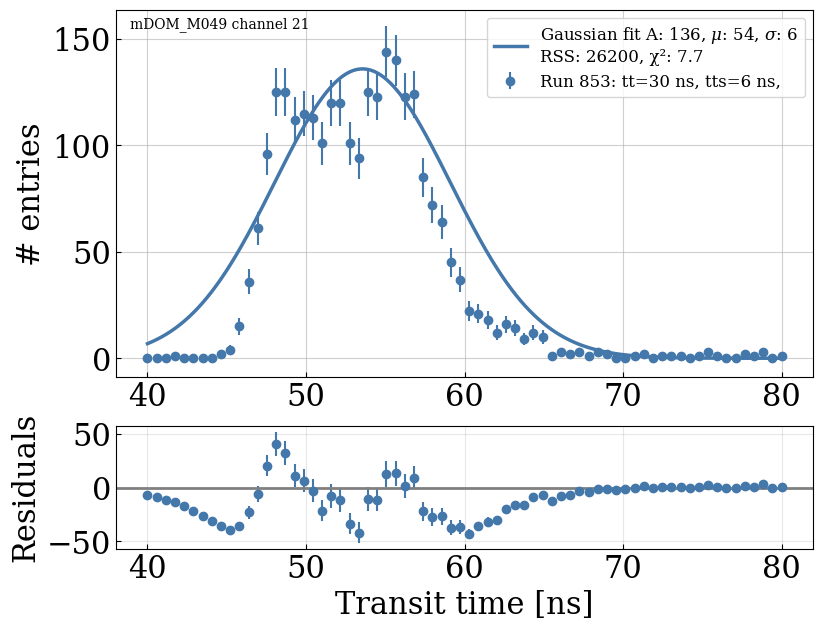

In [174]:
plot_single_transit_time_run_residual("mDOM_M049", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[853])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1122.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1433.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1434.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1435.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1436.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1440.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1441.json', '/Users/epaudel/research_ua/icecube/

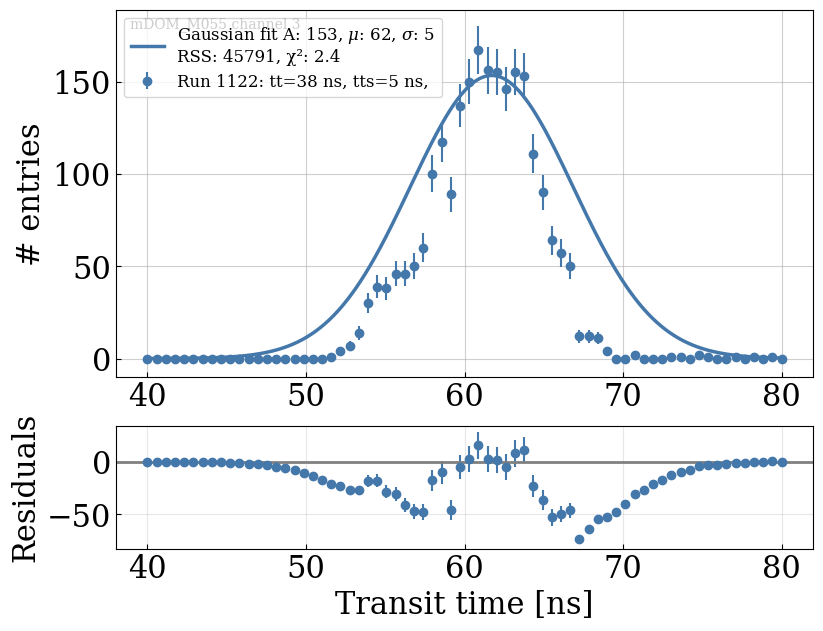

In [175]:
plot_single_transit_time_run_residual("mDOM_M055", 3, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1122])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1122.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1440.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1441.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1436.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1435.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1443.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1434.json', '/Users/epaudel/research_ua/icecube/u

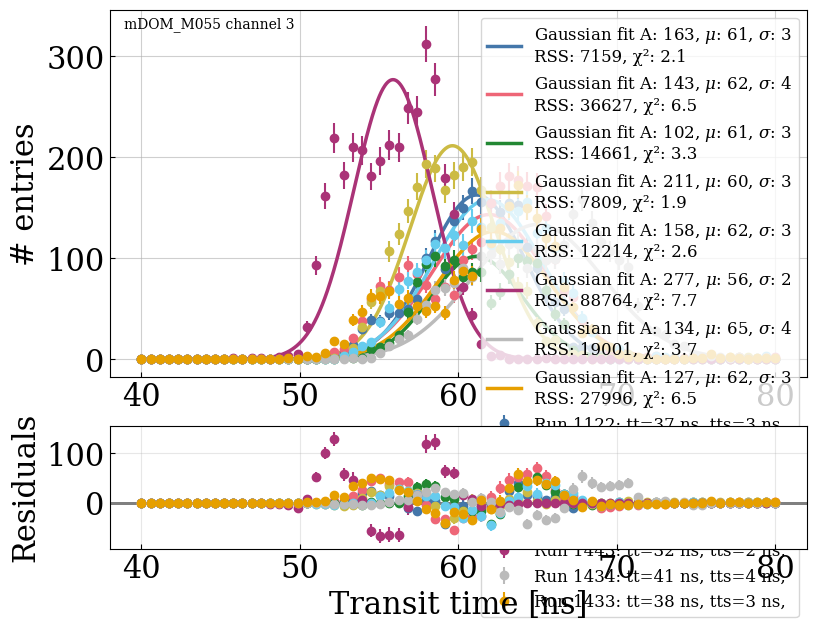

In [176]:
plot_single_gaussian_fit_residual("mDOM_M055", 3, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M101_v1/mDOM_M101_v1_ch_3_pmt_DM13629_1054.json']
available channels for mDOM_M101: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M101_v1/mDOM_M101_v1_ch_6_pmt_DM13030_1054.json']
mdom mDOM_M101 channel 6 Run 1054: tt 38.6 ns, tts 5.2 ns, a 227.3, b 50.6, c 5.2, chi2 6.8, hv 89.2 V


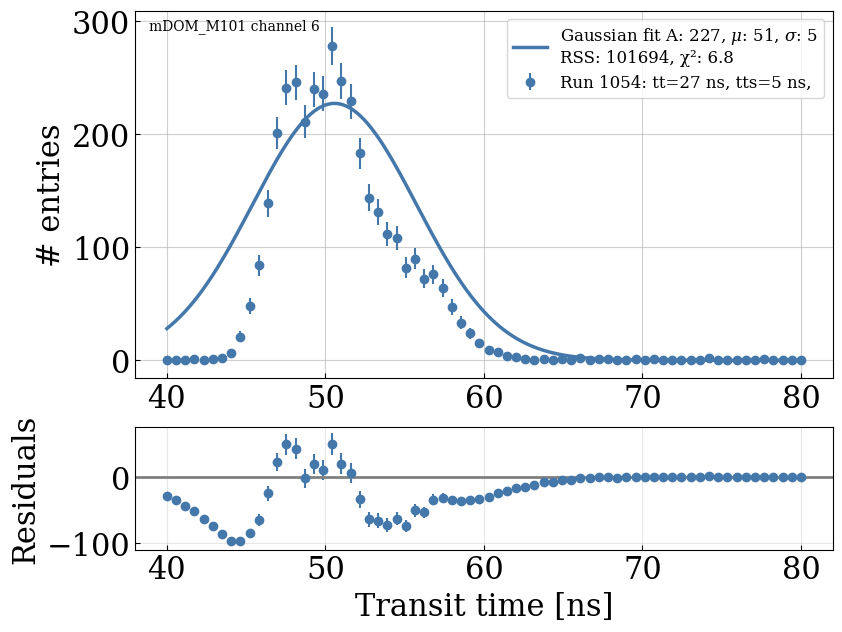

In [177]:
plot_single_transit_time_run_residual("mDOM_M101", 6, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1054])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D116_v1/mDOM_D116_v1_ch_3_pmt_DM11723_226.json']
available channels for mDOM_D116: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D116_v1/mDOM_D116_v1_ch_14_pmt_DM10531_226.json']
mdom mDOM_D116 channel 14 Run 226: tt 43.4 ns, tts 5.0 ns, a 5.2, b 55.4, c 5.0, chi2 3.4, hv 80.9 V


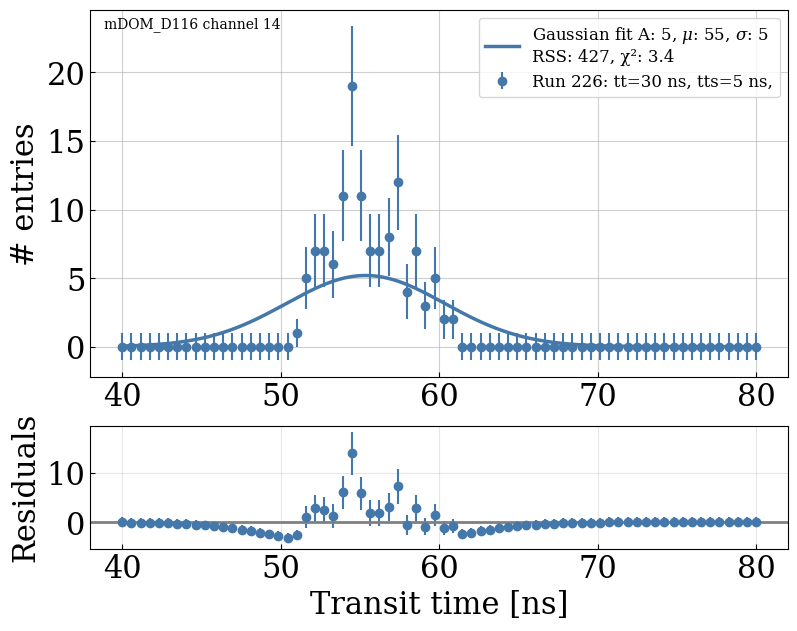

In [178]:
plot_single_transit_time_run_residual("mDOM_D116", 14, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D092_v1/mDOM_D092_v1_ch_3_pmt_DM13637_139.json']
available channels for mDOM_D092: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D092_v1/mDOM_D092_v1_ch_10_pmt_DM13306_139.json']
mdom mDOM_D092 channel 10 Run 139: tt 46.6 ns, tts 4.3 ns, a 7.3, b 58.6, c 4.3, chi2 2.8, hv 81.5 V


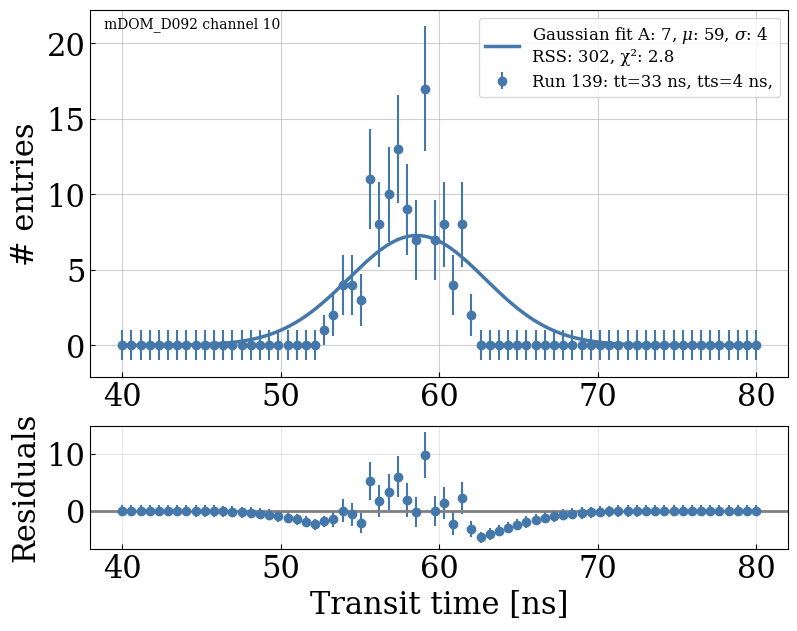

In [179]:
plot_single_transit_time_run_residual("mDOM_D092", 10, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D001_v1/mDOM_D001_v1_ch_3_pmt_DM00605_137.json']
available channels for mDOM_D001: [0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D001_v1/mDOM_D001_v1_ch_18_pmt_DM01158_137.json']
mdom mDOM_D001 channel 18 Run 137: tt 43.6 ns, tts 4.5 ns, a 3.0, b 55.6, c 4.5, chi2 0.6, hv 98.1 V


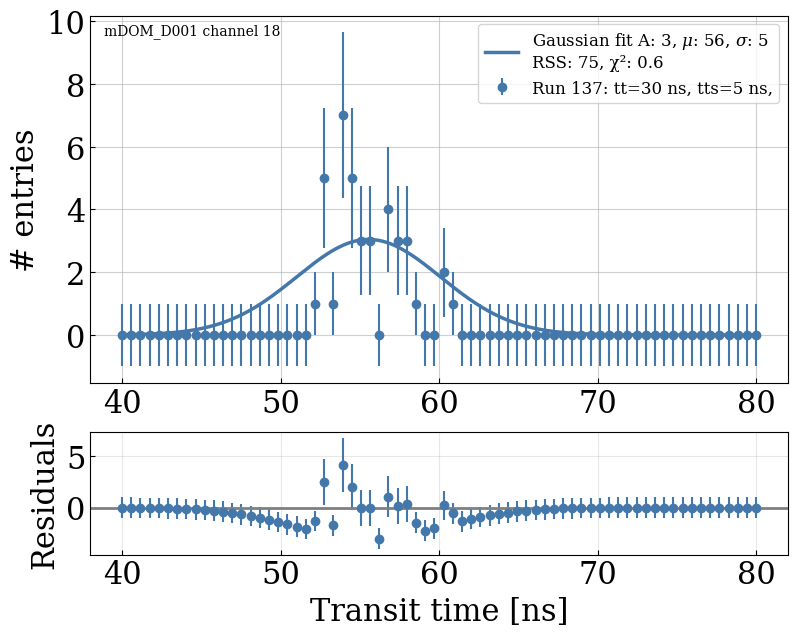

In [180]:
plot_single_transit_time_run_residual("mDOM_D001", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D061_v1/mDOM_D061_v1_ch_3_pmt_DM11391_222.json']
available channels for mDOM_D061: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D061_v1/mDOM_D061_v1_ch_5_pmt_DM07866_222.json']
mdom mDOM_D061 channel 5 Run 222: tt 40.4 ns, tts 3.2 ns, a 98.1, b 52.4, c 3.2, chi2 1.2, hv 85.3 V


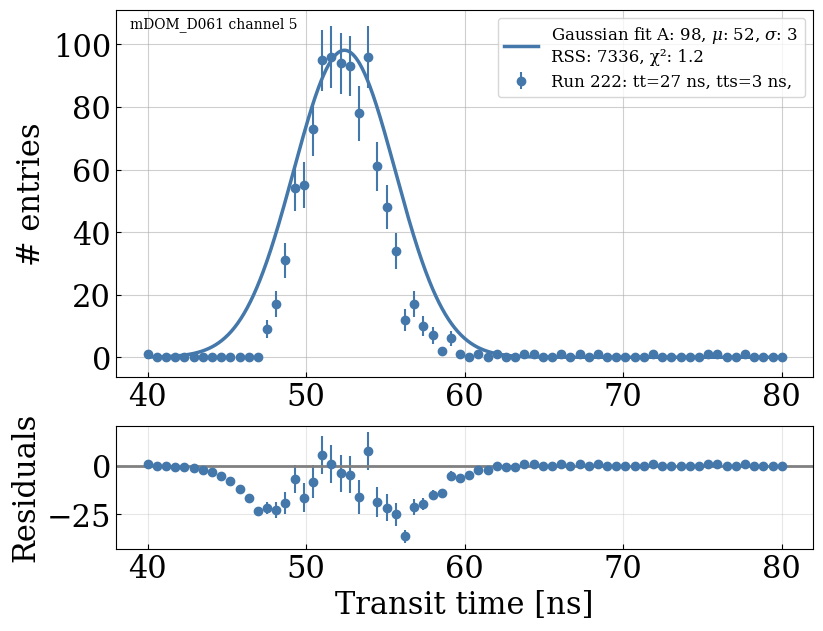

In [181]:
plot_single_transit_time_run_residual("mDOM_D061", 5, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_3_pmt_DM11504_140.json']
available channels for mDOM_D090: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_18_pmt_DM12591_140.json']
mdom mDOM_D090 channel 18 Run 140: tt 47.6 ns, tts 2.1 ns, a 27.6, b 59.6, c 2.1, chi2 0.8, hv 83.1 V


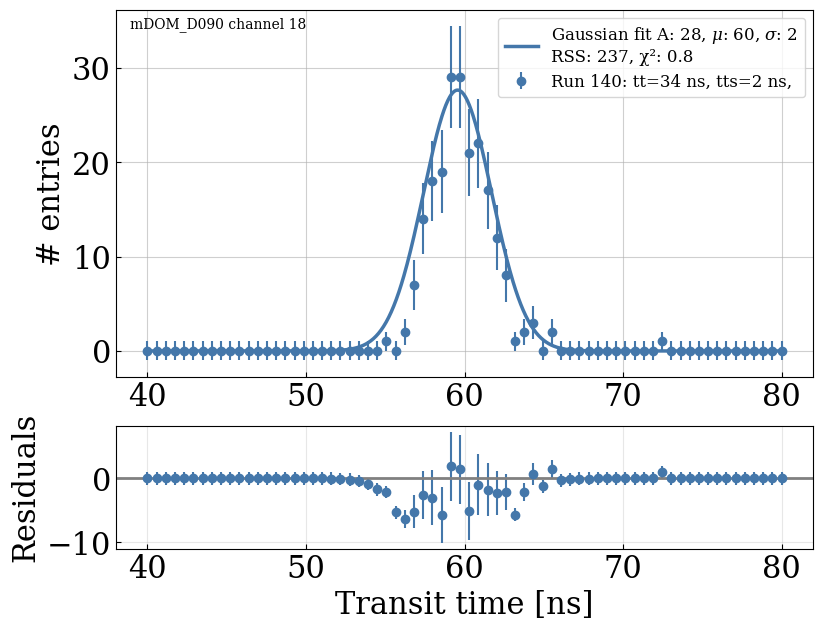

In [182]:
plot_single_transit_time_run_residual("mDOM_D090", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_5_pmt_DM09635_140.json']


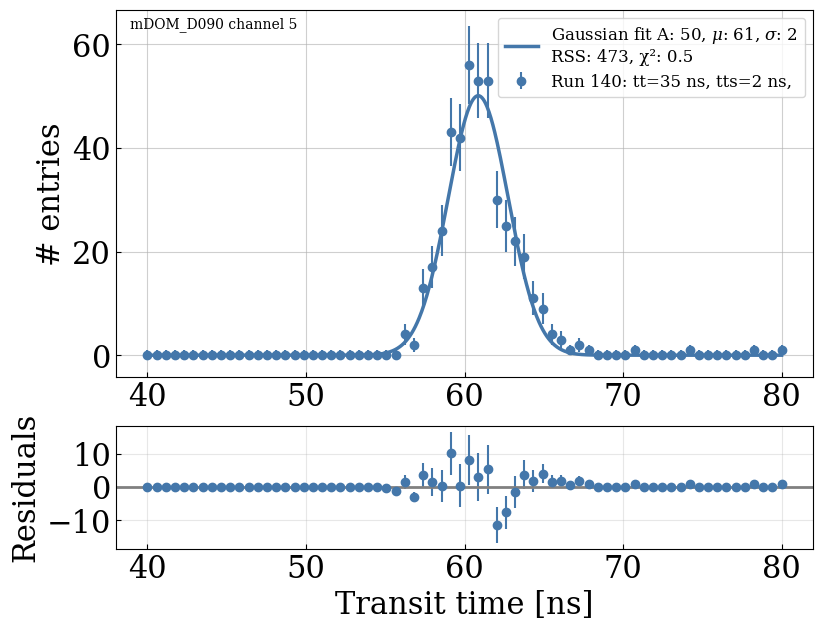

In [183]:
plot_single_gaussian_fit_residual("mDOM_D090", 5, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D061_v1/mDOM_D061_v1_ch_5_pmt_DM07866_222.json']


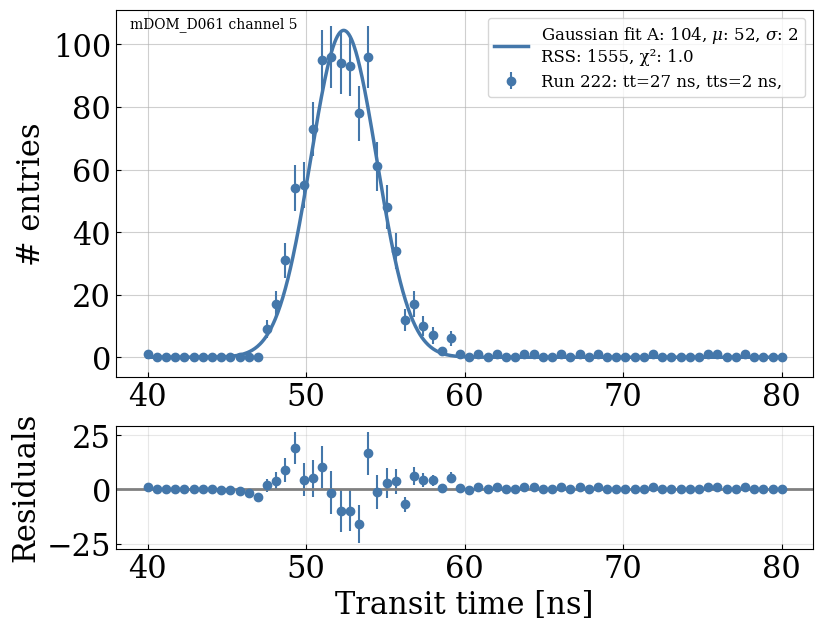

In [184]:
plot_single_gaussian_fit_residual("mDOM_D061", 5, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

MDOMs with tts greater than 4 ns

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1367.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1368.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1369.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1370.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1371.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1372.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_3_pmt_DM10117_1373.json', '/Users/epaudel/research_ua/icecube/

available channels for mDOM_M115: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_981.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1370.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1371.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1367.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1374.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1375.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_ca

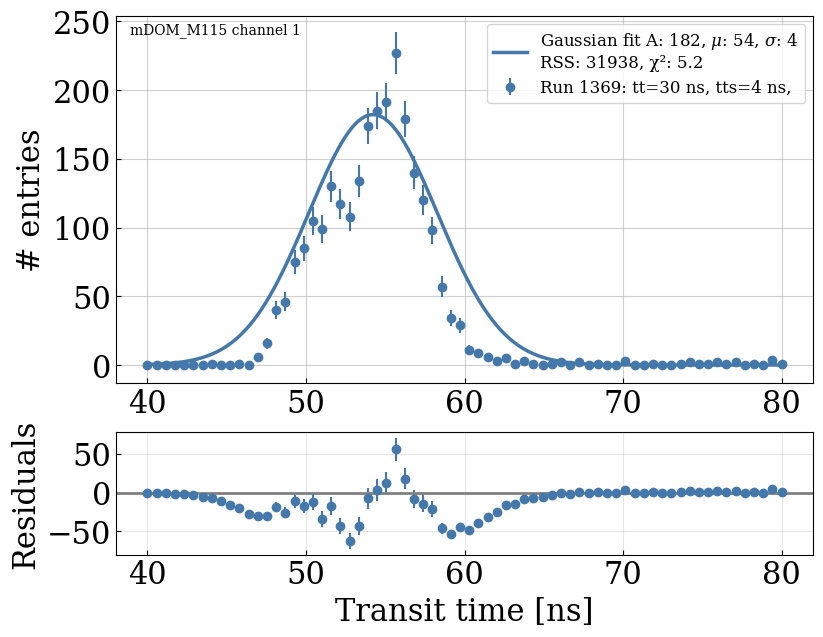

In [185]:
plot_single_transit_time_run_residual("mDOM_M115", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1369])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_981.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1370.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1371.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1367.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1374.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1375.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M115_v1/mDOM_M115_v1_ch_1_pmt_DM10252_1372.json', '/Users/epaudel/research_ua/icecube/up

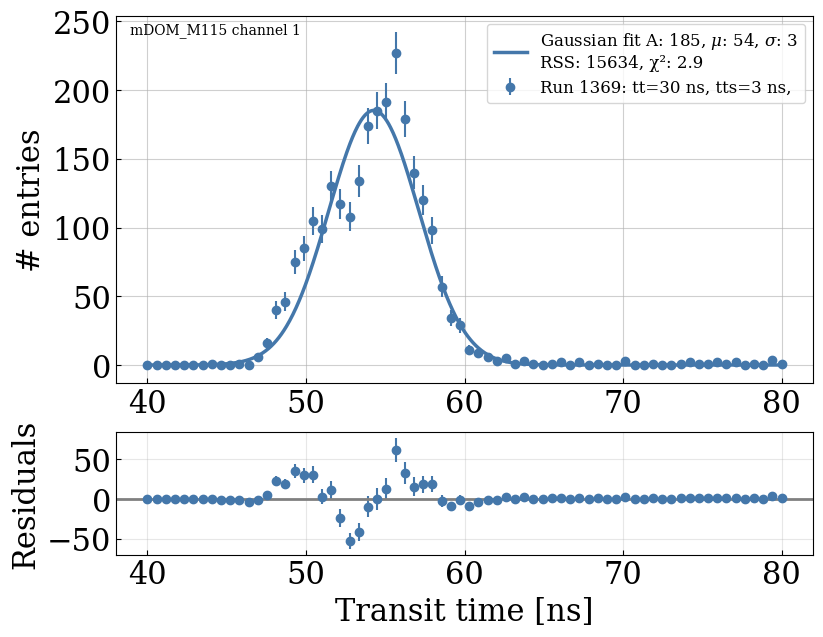

In [186]:
plot_single_gaussian_fit_residual("mDOM_M115", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1369])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1122.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1433.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1434.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1435.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1436.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1440.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_3_pmt_DM03162_1441.json', '/Users/epaudel/research_ua/icecube/

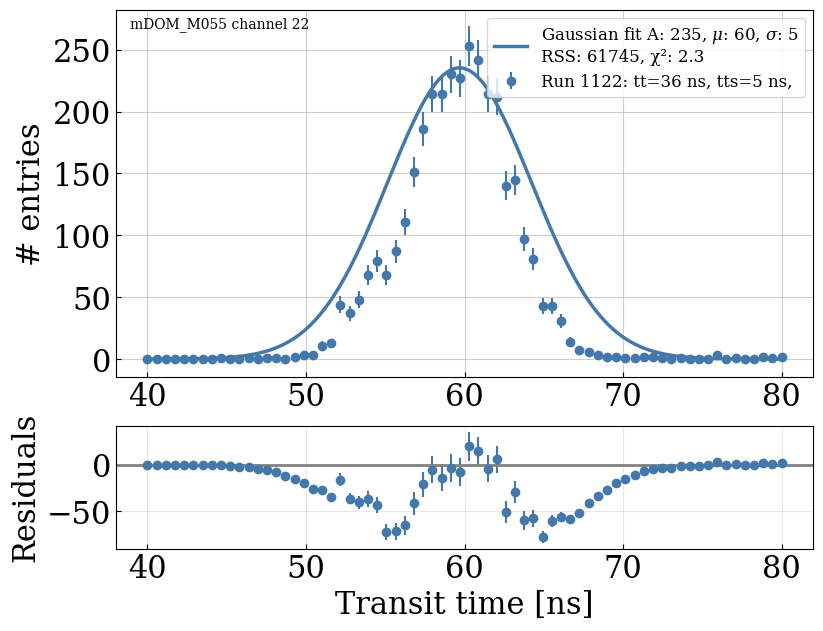

In [187]:
plot_single_transit_time_run_residual("mDOM_M055", 22, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1122])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1443.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1434.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1435.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1433.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1441.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1436.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M055_v1/mDOM_M055_v1_ch_22_pmt_DM05881_1122.json', '/Users/epaudel/research_ua/ic

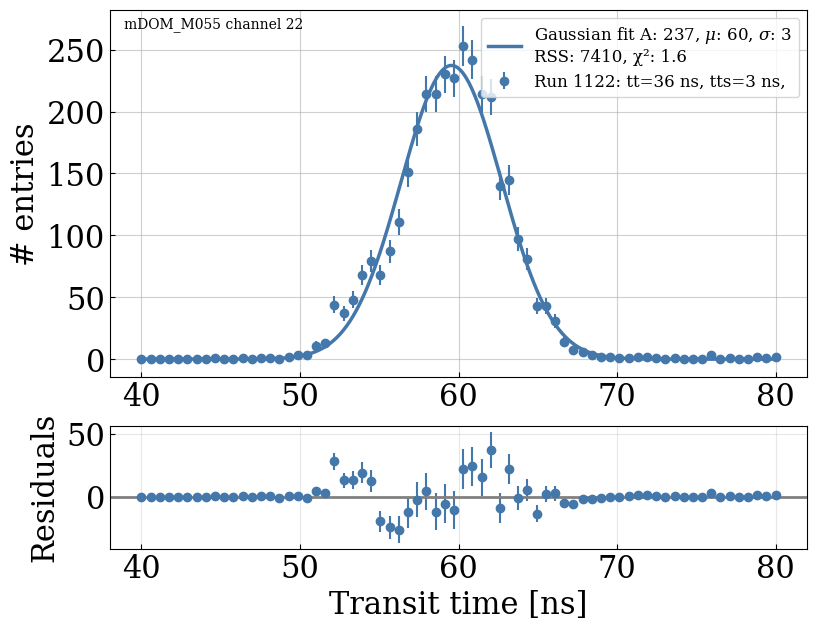

In [188]:
plot_single_gaussian_fit_residual("mDOM_M055", 22, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[1122])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M160_v1/mDOM_M160_v1_ch_3_pmt_DM13854_1021.json']
available channels for mDOM_M160: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M160_v1/mDOM_M160_v1_ch_21_pmt_DM05963_1021.json']
mdom mDOM_M160 channel 21 Run 1021: tt 44.0 ns, tts 4.0 ns, a 163.1, b 56.0, c 4.0, chi2 5.0, hv 93.8 V


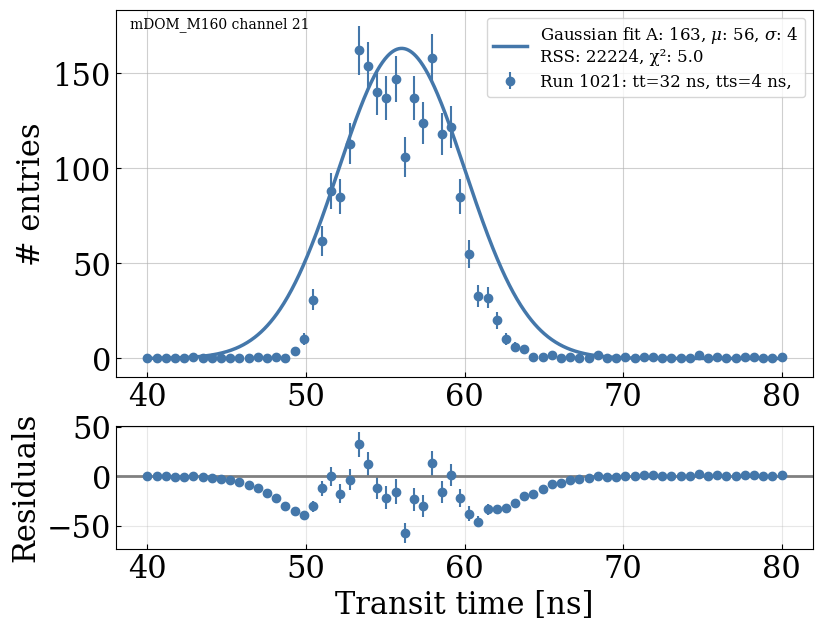

In [189]:
plot_single_transit_time_run_residual("mDOM_M160", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M160_v1/mDOM_M160_v1_ch_21_pmt_DM05963_1021.json']


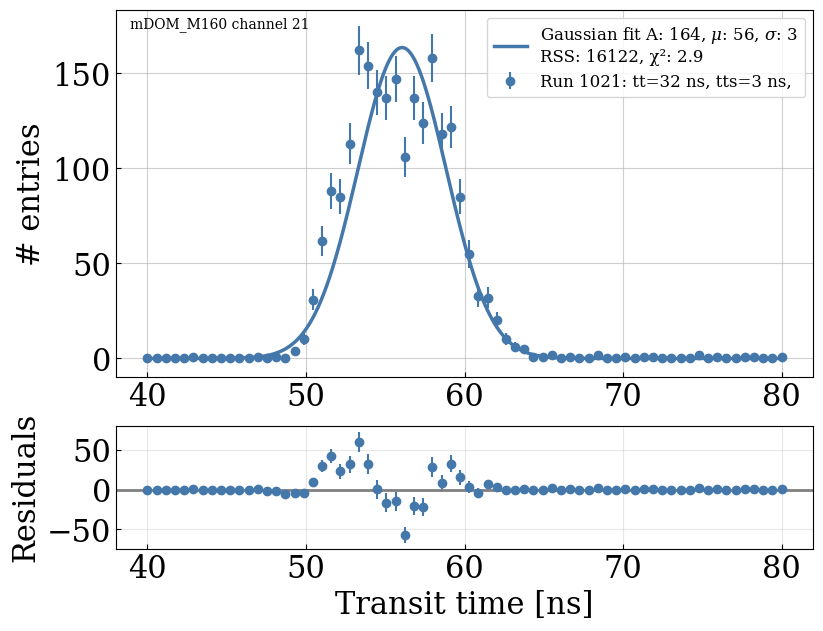

In [190]:
plot_single_gaussian_fit_residual("mDOM_M160", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M101_v1/mDOM_M101_v1_ch_21_pmt_DM13633_1054.json']


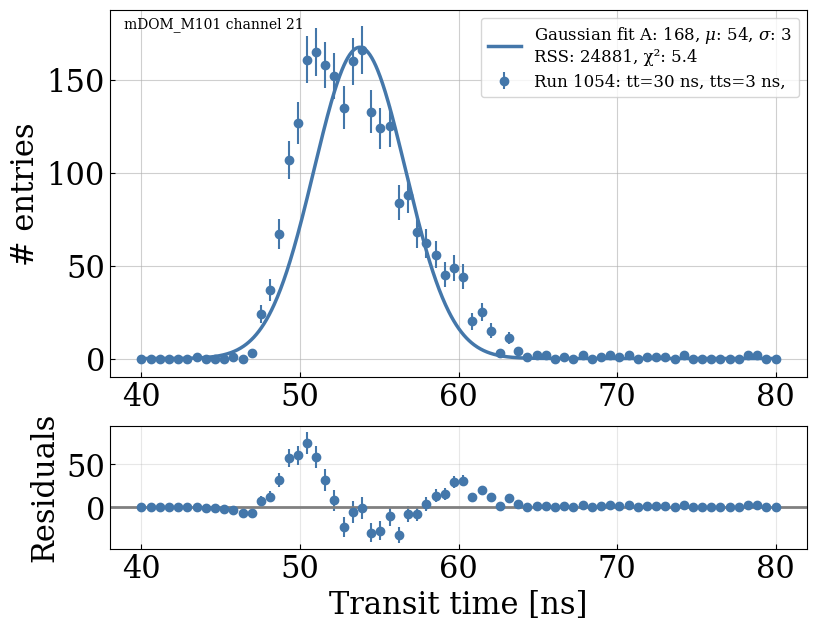

In [191]:
plot_single_gaussian_fit_residual("mDOM_M101", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M074_v1/mDOM_M074_v1_ch_21_pmt_DM04695_184.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M074_v1/mDOM_M074_v1_ch_21_pmt_DM04695_673.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M074_v1/mDOM_M074_v1_ch_21_pmt_DM04695_672.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M074_v1/mDOM_M074_v1_ch_21_pmt_DM04695_671.json']


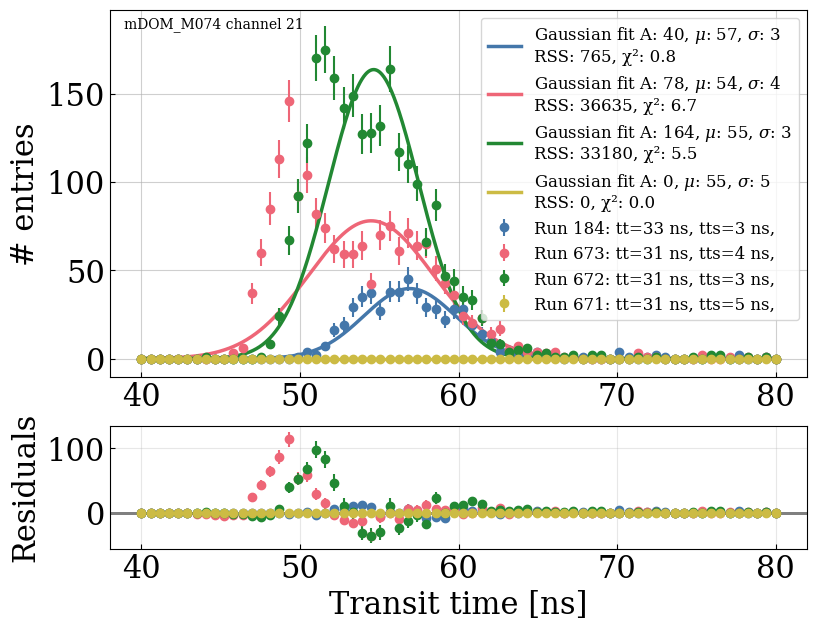

In [192]:
plot_single_gaussian_fit_residual("mDOM_M074", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M083_v1/mDOM_M083_v1_ch_21_pmt_DM08286_1081.json']


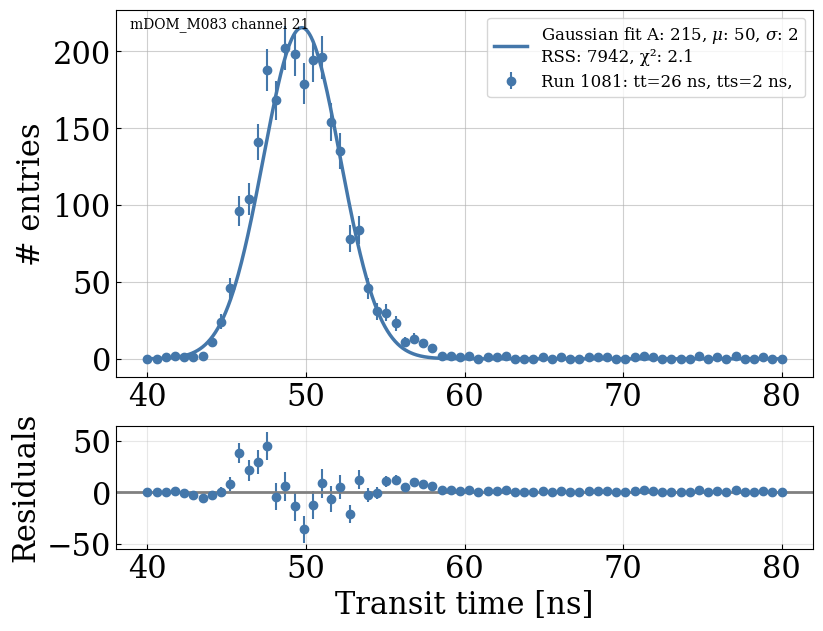

In [193]:
plot_single_gaussian_fit_residual("mDOM_M083", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_853.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_798.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_320.json', '/Users/epaudel/research_ua/icecube/u

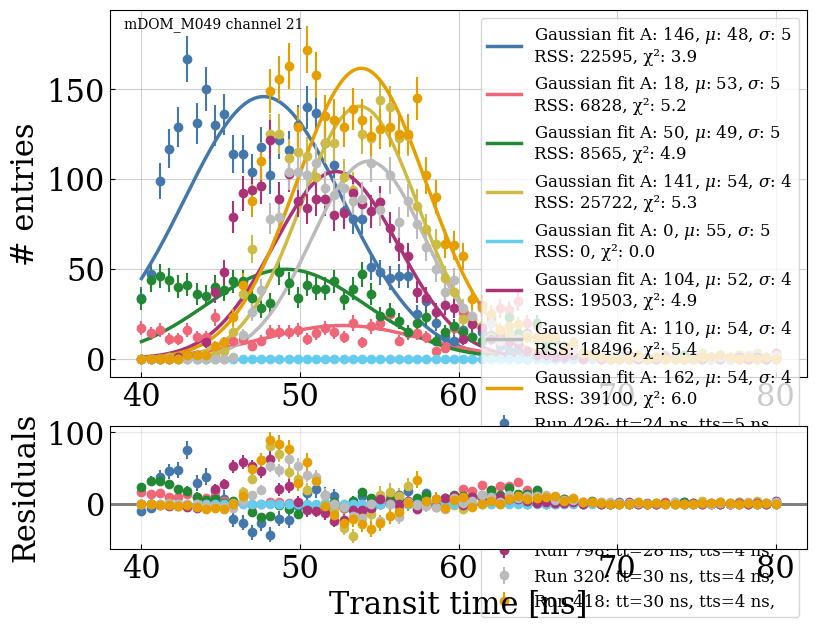

In [194]:
plot_single_gaussian_fit_residual("mDOM_M049", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_798.json', '/Users/epaudel/research_ua/icecube/upgrade

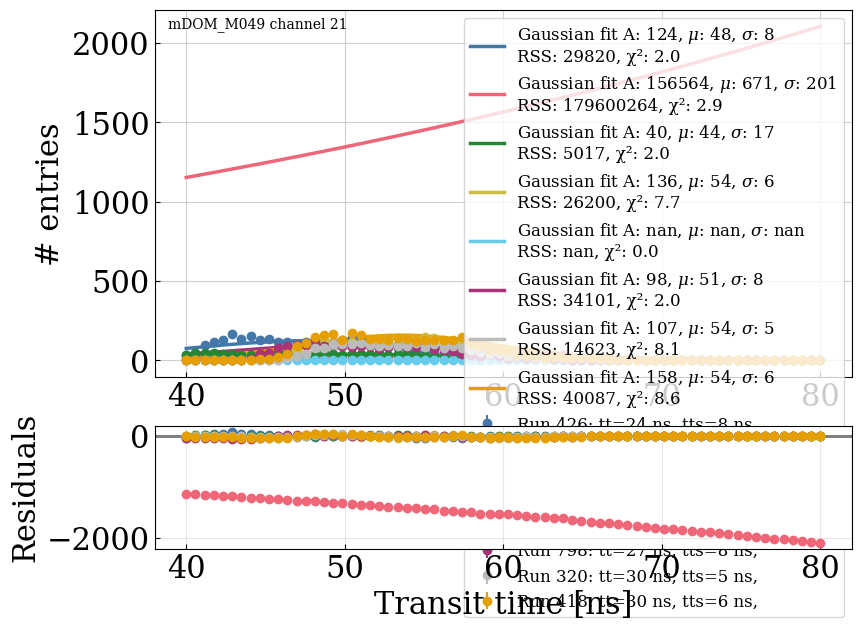

In [195]:
plot_single_transit_time_run_residual("mDOM_M049", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_853.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_798.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_21_pmt_DM04474_320.json', '/Users/epaudel/research_ua/icecube/u

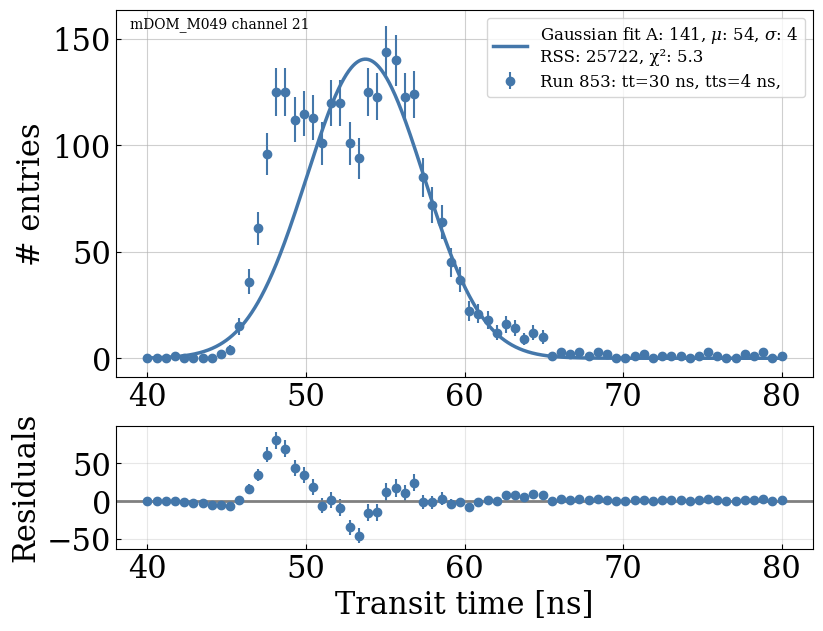

In [196]:
plot_single_gaussian_fit_residual("mDOM_M049", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[853])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_772.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_676.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_677.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_773.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_775.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_779.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_160.json', '/Users/epaudel/research_ua/icecube/u

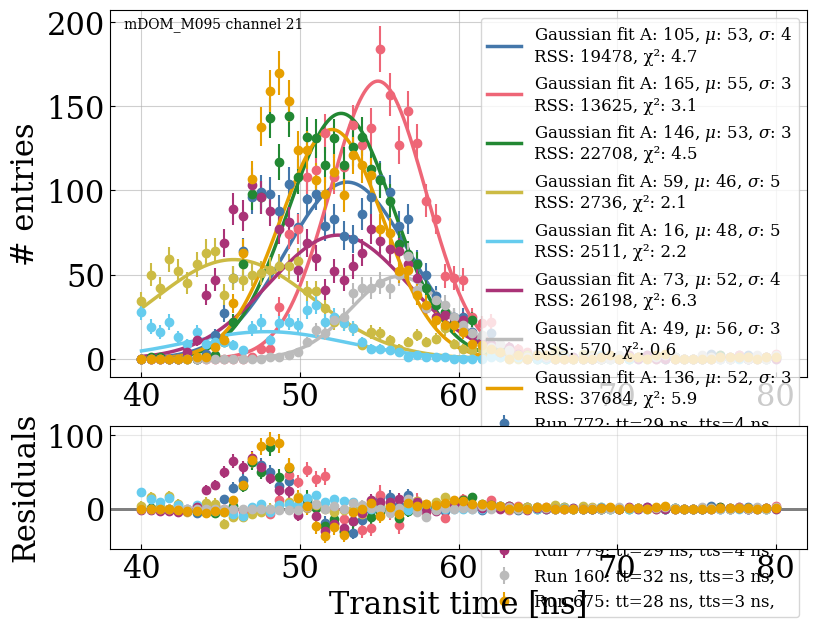

In [197]:
plot_single_gaussian_fit_residual("mDOM_M095", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_772.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_676.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_677.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_773.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_775.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_779.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_21_pmt_DM05543_160.json', '/Users/epaudel/research_ua/icecube/u

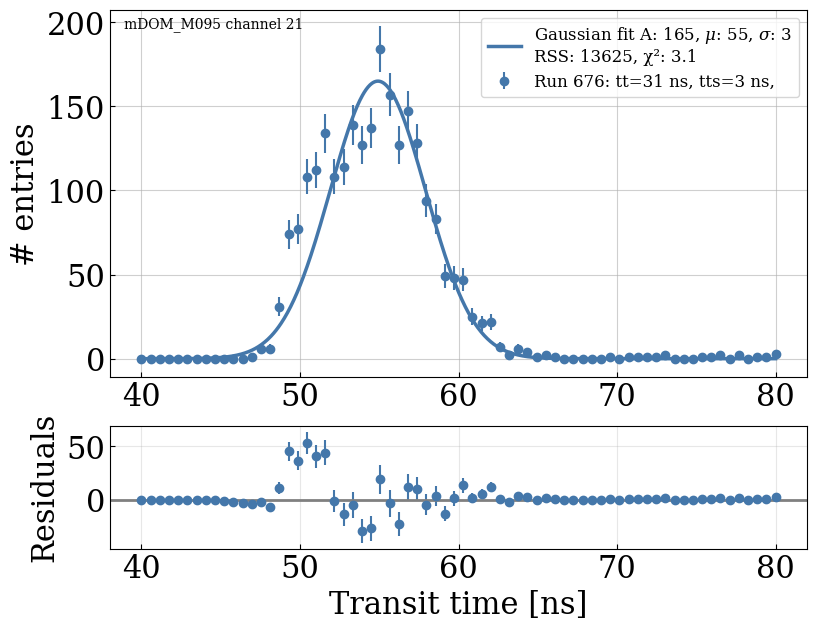

In [198]:
plot_single_gaussian_fit_residual("mDOM_M095", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[676])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_160.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_675.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_676.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_677.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_772.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_773.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_775.json', '/Users/epaudel/research_ua/icecube/upgrade

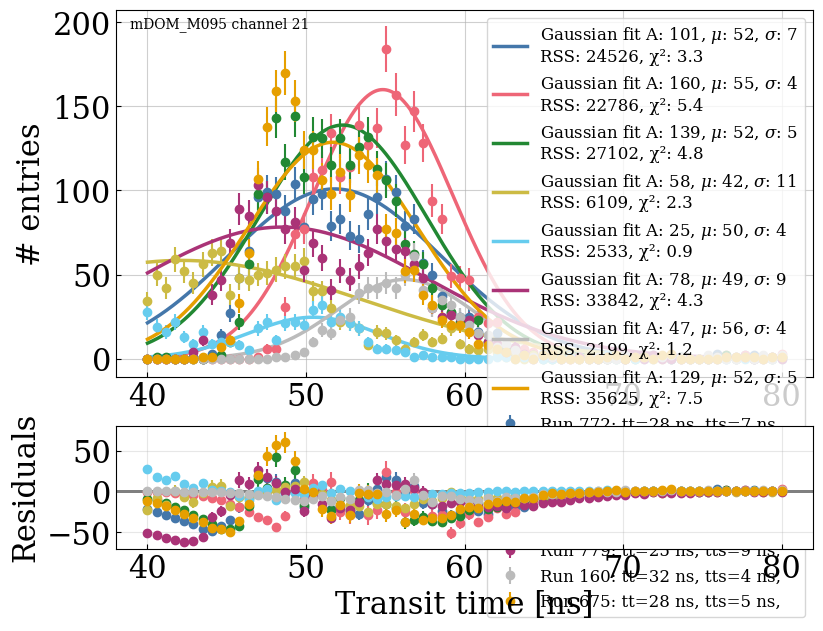

In [199]:
plot_single_transit_time_run_residual("mDOM_M095", 21, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_675.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_160.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_775.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_779.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_773.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_677.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_18_pmt_DM08327_676.json', '/Users/epaudel/research_ua/icecube/u

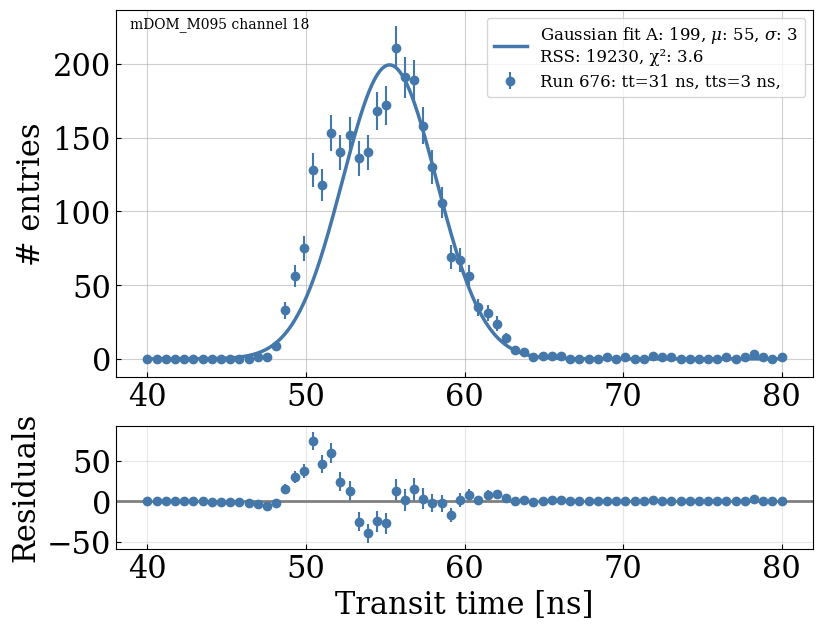

In [200]:
plot_single_gaussian_fit_residual("mDOM_M095", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[676])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M063_v1/mDOM_M063_v1_ch_18_pmt_DM04214_960.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M063_v1/mDOM_M063_v1_ch_18_pmt_DM04214_957.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M063_v1/mDOM_M063_v1_ch_18_pmt_DM04214_1427.json']


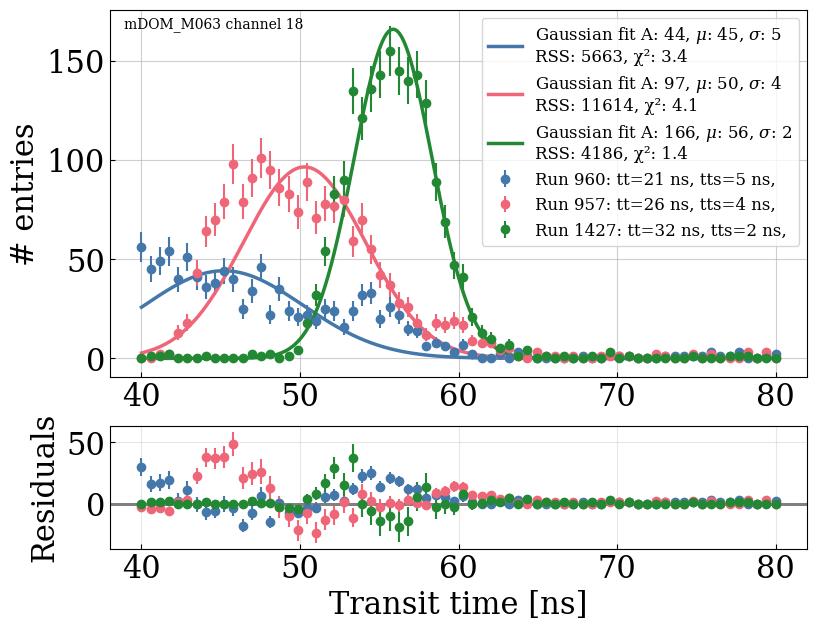

In [201]:
plot_single_gaussian_fit_residual("mDOM_M063", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_12_pmt_DM12705_140.json']


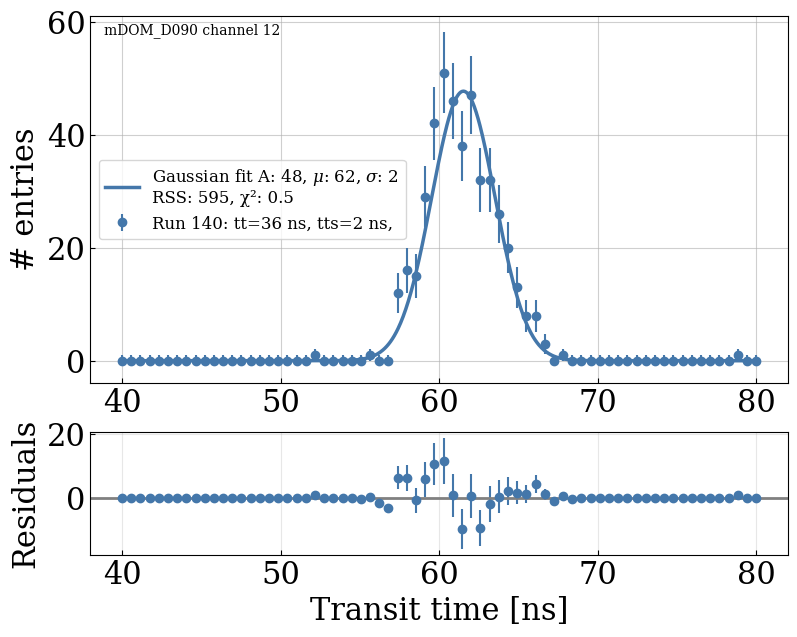

In [202]:
plot_single_gaussian_fit_residual("mDOM_D090", 12, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_3_pmt_DM11504_140.json']
available channels for mDOM_D090: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_12_pmt_DM12705_140.json']
mdom mDOM_D090 channel 12 Run 140: tt 48.6 ns, tts 2.4 ns, a 42.4, b 60.6, c -2.4, chi2 2.1, hv 83.1 V


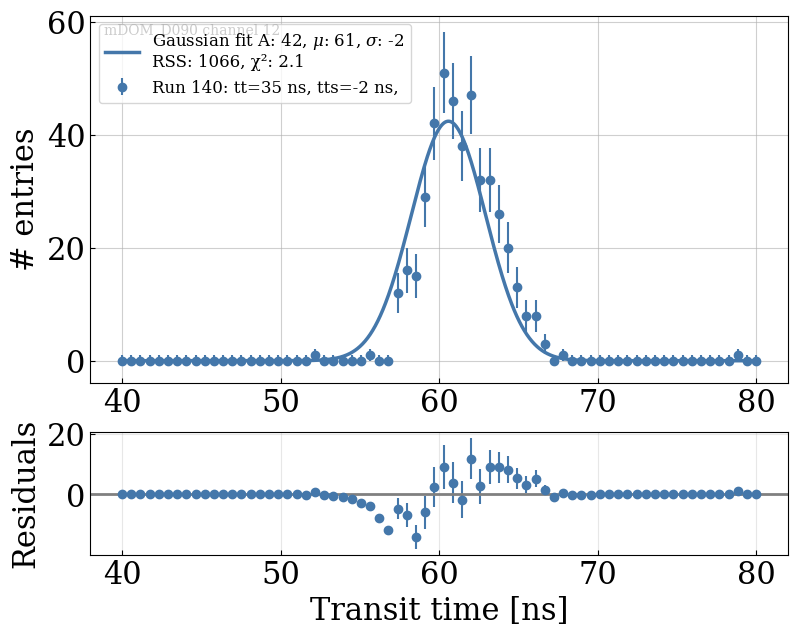

In [203]:
plot_single_transit_time_run_residual("mDOM_D090", 12, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_796.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_1426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_180.json']


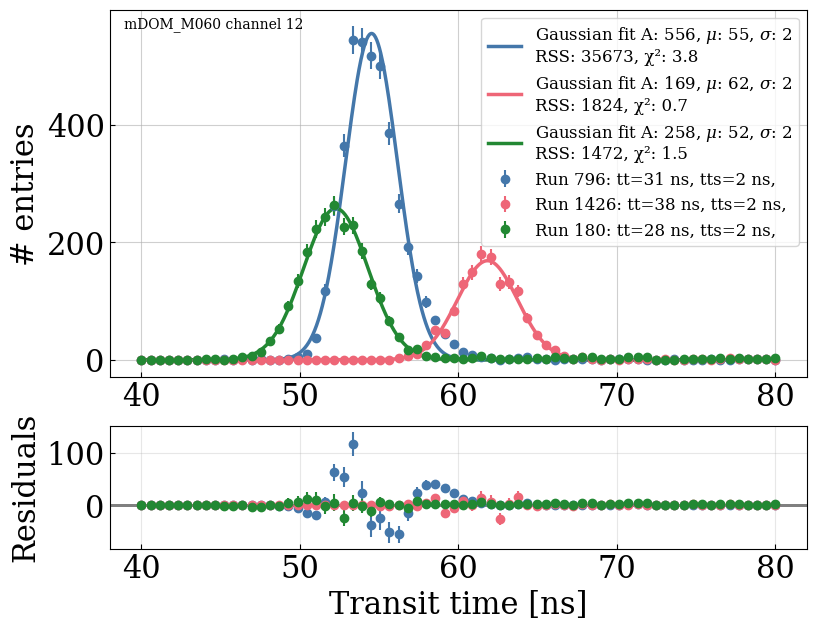

In [204]:
plot_single_gaussian_fit_residual("mDOM_M060", 12, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_3_pmt_DM07409_1426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_3_pmt_DM07409_180.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_3_pmt_DM07409_796.json']
available channels for mDOM_M060: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_796.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_1426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M060_v1/mDOM_M060_v1_ch_12_pmt_DM05518_180.json']
mdom mDOM_M060 channel 12 Run 796: tt 42.

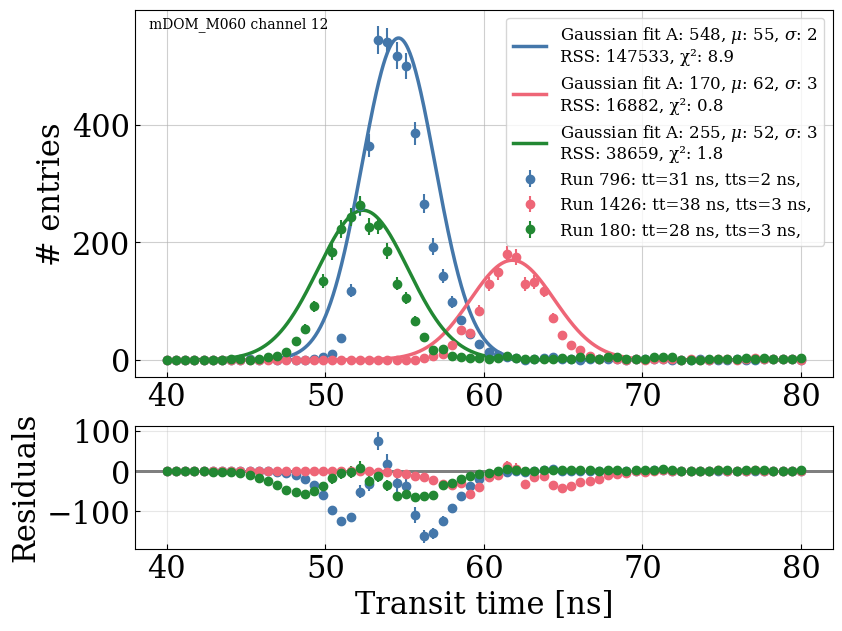

In [205]:
plot_single_transit_time_run_residual("mDOM_M060", 12, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_3_pmt_DM12074_44.json']
available channels for mDOM_D068: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_1_pmt_DM12442_44.json']
mdom mDOM_D068 channel 1 Run 44: tt 45.6 ns, tts 2.5 ns, a 101.5, b 57.6, c -2.5, chi2 0.4, hv nan V


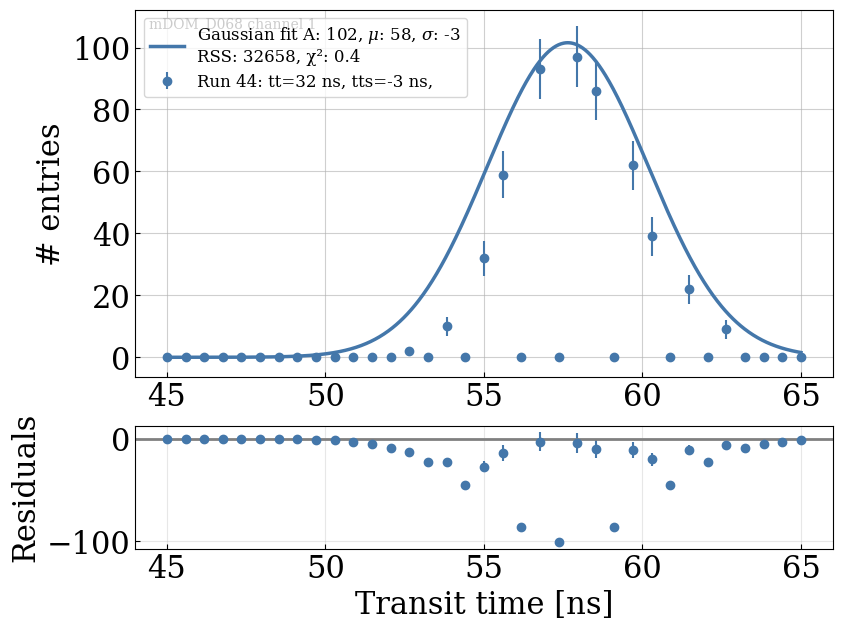

In [206]:
plot_single_transit_time_run_residual("mDOM_D068", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_0_pmt_DM09689_44.json']


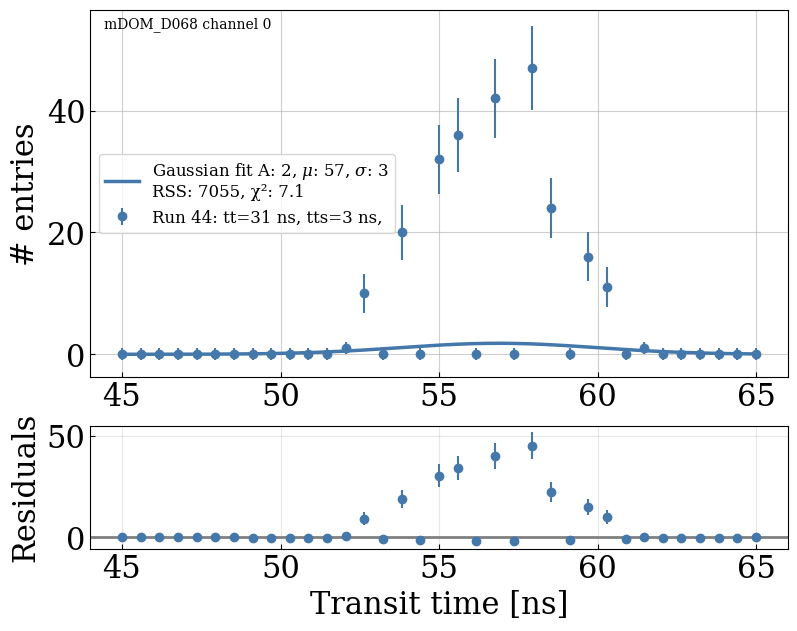

In [207]:
plot_single_gaussian_fit_residual("mDOM_D068", 0, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

In [208]:
mdom_list = ['mDOM_D030', 'mDOM_D054', 'mDOM_D084', 'mDOM_D199', 'mDOM_D015', 'mDOM_D039', 'mDOM_D070', 'mDOM_D034', 'mDOM_D196', 'mDOM_D092', 'mDOM_D067', 'mDOM_D007', 'mDOM_D090', 'mDOM_D029', 'mDOM_D211', 'mDOM_D209', 'mDOM_D089', 'mDOM_D036', 'mDOM_D206', 'mDOM_D068', 'mDOM_D020', 'mDOM_D208']


meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_3_pmt_DM12074_44.json']
available channels for mDOM_D068: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_0_pmt_DM09689_44.json']
mdom mDOM_D068 channel 0 Run 44: tt 44.7 ns, tts 2.7 ns, a 45.4, b 56.7, c 2.7, chi2 1.5, hv nan V


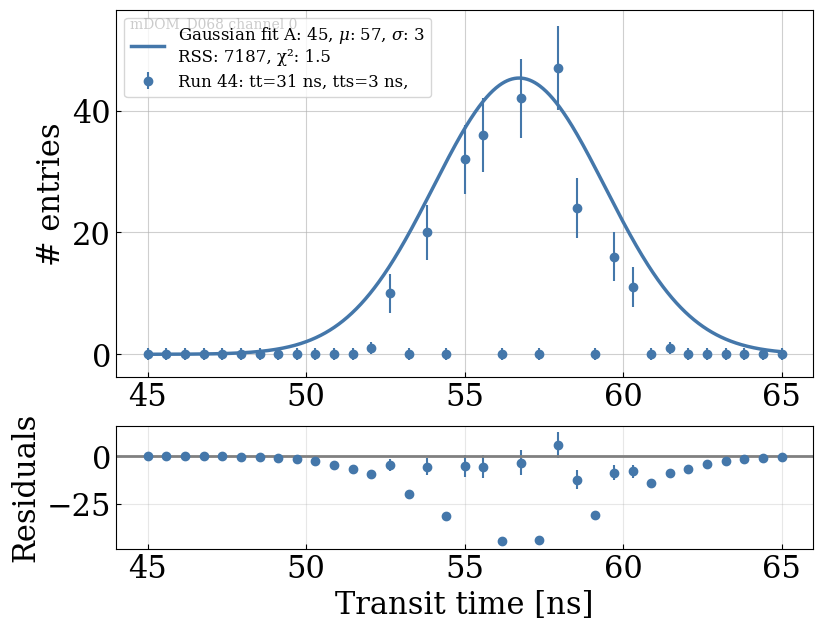

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_3_pmt_DM12074_44.json']
available channels for mDOM_D068: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_1_pmt_DM12442_44.json']
mdom mDOM_D068 channel 1 Run 44: tt 45.6 ns, tts 2.5 ns, a 101.5, b 57.6, c -2.5, chi2 0.4, hv nan V


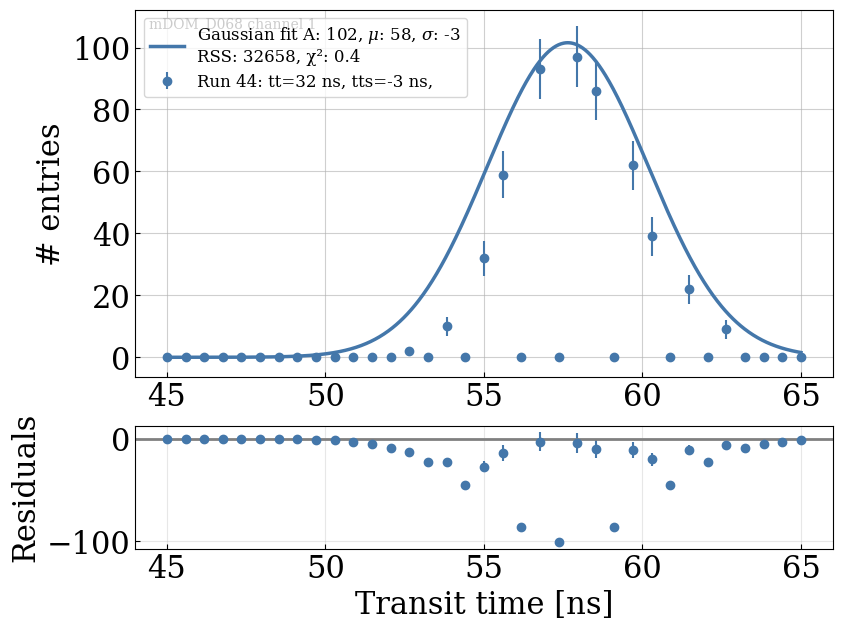

In [209]:
tts_outliers = ['mDOM_D068_channel_0_44',
 'mDOM_D068_channel_1_44',
 'mDOM_D068_channel_2_44',
 'mDOM_D068_channel_3_44',
 'mDOM_D068_channel_4_44',
 'mDOM_D068_channel_5_44',
 'mDOM_D068_channel_6_44',
 'mDOM_D068_channel_7_44',
 'mDOM_D068_channel_8_44',
 'mDOM_D068_channel_9_44',
 'mDOM_D068_channel_10_44',
 'mDOM_D068_channel_11_44',
 'mDOM_D068_channel_12_44',
 'mDOM_D068_channel_13_44',
 'mDOM_D068_channel_14_44',
 'mDOM_D068_channel_15_44',
 'mDOM_D068_channel_16_44',
 'mDOM_D068_channel_17_44',
 'mDOM_D068_channel_18_44',
 'mDOM_D068_channel_19_44',
 'mDOM_D068_channel_21_44',
 'mDOM_D068_channel_22_44',
 'mDOM_D068_channel_23_44',
 'mDOM_D039_channel_0_46',
 'mDOM_D039_channel_1_46',
 'mDOM_D039_channel_2_46',
 'mDOM_D039_channel_3_46',
 'mDOM_D039_channel_4_46',
 'mDOM_D039_channel_5_46',
 'mDOM_D039_channel_6_46',
 'mDOM_D039_channel_7_46',
 'mDOM_D039_channel_8_46',
 'mDOM_D039_channel_9_46',
 'mDOM_D039_channel_10_46',
 'mDOM_D039_channel_11_46',
 'mDOM_D039_channel_12_46',
 'mDOM_D039_channel_13_46',
 'mDOM_D039_channel_14_46',
 'mDOM_D039_channel_15_46',
 'mDOM_D039_channel_16_46',
 'mDOM_D039_channel_17_46',
 'mDOM_D039_channel_18_46',
 'mDOM_D039_channel_19_46',
 'mDOM_D039_channel_20_46',
 'mDOM_D039_channel_21_46',
 'mDOM_D039_channel_22_46',
 'mDOM_D039_channel_23_46',
 'mDOM_D029_channel_0_48',
 'mDOM_D029_channel_2_48',
 'mDOM_D029_channel_3_48',
 'mDOM_D029_channel_4_48',
 'mDOM_D029_channel_5_48',
 'mDOM_D029_channel_6_48',
 'mDOM_D029_channel_7_48',
 'mDOM_D029_channel_8_48',
 'mDOM_D029_channel_9_48',
 'mDOM_D029_channel_10_48',
 'mDOM_D029_channel_11_48',
 'mDOM_D029_channel_12_48',
 'mDOM_D029_channel_13_48',
 'mDOM_D029_channel_14_48',
 'mDOM_D029_channel_15_48',
 'mDOM_D029_channel_16_48',
 'mDOM_D029_channel_17_48',
 'mDOM_D029_channel_18_48',
 'mDOM_D029_channel_19_48',
 'mDOM_D029_channel_20_48',
 'mDOM_D029_channel_21_48',
 'mDOM_D029_channel_22_48',
 'mDOM_D029_channel_23_48',
 'mDOM_D090_channel_0_140',
 'mDOM_D090_channel_6_140',
 'mDOM_D090_channel_14_140',
 'mDOM_D090_channel_21_140',
 'mDOM_D036_channel_4_100',
 'mDOM_D067_channel_0_42',
 'mDOM_D067_channel_1_42',
 'mDOM_D067_channel_2_42',
 'mDOM_D067_channel_3_42',
 'mDOM_D067_channel_4_42',
 'mDOM_D067_channel_5_42',
 'mDOM_D067_channel_6_42',
 'mDOM_D067_channel_7_42',
 'mDOM_D067_channel_8_42',
 'mDOM_D067_channel_9_42',
 'mDOM_D067_channel_10_42',
 'mDOM_D067_channel_11_42',
 'mDOM_D067_channel_12_42',
 'mDOM_D067_channel_13_42',
 'mDOM_D067_channel_14_42',
 'mDOM_D067_channel_15_42',
 'mDOM_D067_channel_16_42',
 'mDOM_D067_channel_17_42',
 'mDOM_D067_channel_18_42',
 'mDOM_D067_channel_19_42',
 'mDOM_D067_channel_20_42',
 'mDOM_D067_channel_21_42',
 'mDOM_D067_channel_22_42',
 'mDOM_D067_channel_23_42',
 'mDOM_D084_channel_20_143',
 'mDOM_D211_channel_0_317',
 'mDOM_D211_channel_1_317',
 'mDOM_D211_channel_2_317',
 'mDOM_D211_channel_3_317',
 'mDOM_D211_channel_4_317',
 'mDOM_D211_channel_5_317',
 'mDOM_D211_channel_6_317',
 'mDOM_D211_channel_7_317',
 'mDOM_D211_channel_8_317',
 'mDOM_D211_channel_9_317',
 'mDOM_D211_channel_10_317',
 'mDOM_D211_channel_11_317',
 'mDOM_D211_channel_12_317',
 'mDOM_D211_channel_13_317',
 'mDOM_D211_channel_14_317',
 'mDOM_D211_channel_15_317',
 'mDOM_D211_channel_16_317',
 'mDOM_D211_channel_17_317',
 'mDOM_D211_channel_19_317',
 'mDOM_D211_channel_20_317',
 'mDOM_D211_channel_21_317',
 'mDOM_D211_channel_23_317',
 'mDOM_D007_channel_18_22',
 'mDOM_D034_channel_0_47',
 'mDOM_D034_channel_1_47',
 'mDOM_D034_channel_2_47',
 'mDOM_D034_channel_3_47',
 'mDOM_D034_channel_4_47',
 'mDOM_D034_channel_5_47',
 'mDOM_D034_channel_6_47',
 'mDOM_D034_channel_7_47',
 'mDOM_D034_channel_8_47',
 'mDOM_D034_channel_9_47',
 'mDOM_D034_channel_11_47',
 'mDOM_D034_channel_12_47',
 'mDOM_D034_channel_13_47',
 'mDOM_D034_channel_14_47',
 'mDOM_D034_channel_15_47',
 'mDOM_D034_channel_16_47',
 'mDOM_D034_channel_17_47',
 'mDOM_D034_channel_18_47',
 'mDOM_D034_channel_19_47',
 'mDOM_D034_channel_20_47',
 'mDOM_D034_channel_21_47',
 'mDOM_D034_channel_22_47',
 'mDOM_D034_channel_23_47',
 'mDOM_D206_channel_0_320',
 'mDOM_D206_channel_1_320',
 'mDOM_D206_channel_2_320',
 'mDOM_D206_channel_3_320',
 'mDOM_D206_channel_4_320',
 'mDOM_D206_channel_5_320',
 'mDOM_D206_channel_6_320',
 'mDOM_D206_channel_7_320',
 'mDOM_D206_channel_8_320',
 'mDOM_D206_channel_9_320',
 'mDOM_D206_channel_10_320',
 'mDOM_D206_channel_11_320',
 'mDOM_D206_channel_12_320',
 'mDOM_D206_channel_13_320',
 'mDOM_D206_channel_14_320',
 'mDOM_D206_channel_15_320',
 'mDOM_D206_channel_16_320',
 'mDOM_D206_channel_17_320',
 'mDOM_D206_channel_18_320',
 'mDOM_D206_channel_19_320',
 'mDOM_D206_channel_20_320',
 'mDOM_D206_channel_21_320',
 'mDOM_D206_channel_22_320',
 'mDOM_D206_channel_23_320',
 'mDOM_D092_channel_7_139',
 'mDOM_D030_channel_0_40',
 'mDOM_D030_channel_1_40',
 'mDOM_D030_channel_2_40',
 'mDOM_D030_channel_3_40',
 'mDOM_D030_channel_4_40',
 'mDOM_D030_channel_5_40',
 'mDOM_D030_channel_6_40',
 'mDOM_D030_channel_7_40',
 'mDOM_D030_channel_8_40',
 'mDOM_D030_channel_9_40',
 'mDOM_D030_channel_10_40',
 'mDOM_D030_channel_11_40',
 'mDOM_D030_channel_12_40',
 'mDOM_D030_channel_13_40',
 'mDOM_D030_channel_14_40',
 'mDOM_D030_channel_15_40',
 'mDOM_D030_channel_16_40',
 'mDOM_D030_channel_17_40',
 'mDOM_D030_channel_18_40',
 'mDOM_D030_channel_19_40',
 'mDOM_D030_channel_20_40',
 'mDOM_D030_channel_21_40',
 'mDOM_D030_channel_22_40',
 'mDOM_D030_channel_23_40',
 'mDOM_D020_channel_0_43',
 'mDOM_D020_channel_1_43',
 'mDOM_D020_channel_2_43',
 'mDOM_D020_channel_3_43',
 'mDOM_D020_channel_4_43',
 'mDOM_D020_channel_5_43',
 'mDOM_D020_channel_6_43',
 'mDOM_D020_channel_7_43',
 'mDOM_D020_channel_8_43',
 'mDOM_D020_channel_9_43',
 'mDOM_D020_channel_10_43',
 'mDOM_D020_channel_11_43',
 'mDOM_D020_channel_12_43',
 'mDOM_D020_channel_13_43',
 'mDOM_D020_channel_14_43',
 'mDOM_D020_channel_15_43',
 'mDOM_D020_channel_16_43',
 'mDOM_D020_channel_17_43',
 'mDOM_D020_channel_18_43',
 'mDOM_D020_channel_19_43',
 'mDOM_D020_channel_20_43',
 'mDOM_D020_channel_21_43',
 'mDOM_D020_channel_22_43',
 'mDOM_D020_channel_23_43',
 'mDOM_D054_channel_17_24',
 'mDOM_D015_channel_18_2',
 'mDOM_D015_channel_22_2',
 'mDOM_D070_channel_9_99',
 'mDOM_D196_channel_0_319',
 'mDOM_D196_channel_1_319',
 'mDOM_D196_channel_2_319',
 'mDOM_D196_channel_3_319',
 'mDOM_D196_channel_4_319',
 'mDOM_D196_channel_5_319',
 'mDOM_D196_channel_6_319',
 'mDOM_D196_channel_7_319',
 'mDOM_D196_channel_8_319',
 'mDOM_D196_channel_9_319',
 'mDOM_D196_channel_10_319',
 'mDOM_D196_channel_11_319',
 'mDOM_D196_channel_12_319',
 'mDOM_D196_channel_13_319',
 'mDOM_D196_channel_14_319',
 'mDOM_D196_channel_15_319',
 'mDOM_D196_channel_16_319',
 'mDOM_D196_channel_17_319',
 'mDOM_D196_channel_18_319',
 'mDOM_D196_channel_19_319',
 'mDOM_D196_channel_20_319',
 'mDOM_D196_channel_21_319',
 'mDOM_D196_channel_22_319',
 'mDOM_D196_channel_23_319',
 'mDOM_D199_channel_0_322',
 'mDOM_D199_channel_1_322',
 'mDOM_D199_channel_2_322',
 'mDOM_D199_channel_3_322',
 'mDOM_D199_channel_4_322',
 'mDOM_D199_channel_5_322',
 'mDOM_D199_channel_6_322',
 'mDOM_D199_channel_7_322',
 'mDOM_D199_channel_8_322',
 'mDOM_D199_channel_9_322',
 'mDOM_D199_channel_10_322',
 'mDOM_D199_channel_11_322',
 'mDOM_D199_channel_12_322',
 'mDOM_D199_channel_13_322',
 'mDOM_D199_channel_14_322',
 'mDOM_D199_channel_15_322',
 'mDOM_D199_channel_16_322',
 'mDOM_D199_channel_17_322',
 'mDOM_D199_channel_18_322',
 'mDOM_D199_channel_19_322',
 'mDOM_D199_channel_20_322',
 'mDOM_D199_channel_21_322',
 'mDOM_D199_channel_22_322',
 'mDOM_D199_channel_23_322',
 'mDOM_D208_channel_0_321',
 'mDOM_D208_channel_1_321',
 'mDOM_D208_channel_2_321',
 'mDOM_D208_channel_3_321',
 'mDOM_D208_channel_4_321',
 'mDOM_D208_channel_5_321',
 'mDOM_D208_channel_6_321',
 'mDOM_D208_channel_7_321',
 'mDOM_D208_channel_8_321',
 'mDOM_D208_channel_9_321',
 'mDOM_D208_channel_10_321',
 'mDOM_D208_channel_11_321',
 'mDOM_D208_channel_12_321',
 'mDOM_D208_channel_13_321',
 'mDOM_D208_channel_14_321',
 'mDOM_D208_channel_15_321',
 'mDOM_D208_channel_16_321',
 'mDOM_D208_channel_17_321',
 'mDOM_D208_channel_18_321',
 'mDOM_D208_channel_19_321',
 'mDOM_D208_channel_20_321',
 'mDOM_D208_channel_21_321',
 'mDOM_D208_channel_22_321',
 'mDOM_D208_channel_23_321',
 'mDOM_D209_channel_0_318',
 'mDOM_D209_channel_1_318',
 'mDOM_D209_channel_2_318',
 'mDOM_D209_channel_3_318',
 'mDOM_D209_channel_4_318',
 'mDOM_D209_channel_5_318',
 'mDOM_D209_channel_6_318',
 'mDOM_D209_channel_7_318',
 'mDOM_D209_channel_8_318',
 'mDOM_D209_channel_9_318',
 'mDOM_D209_channel_10_318',
 'mDOM_D209_channel_11_318',
 'mDOM_D209_channel_12_318',
 'mDOM_D209_channel_13_318',
 'mDOM_D209_channel_14_318',
 'mDOM_D209_channel_15_318',
 'mDOM_D209_channel_16_318',
 'mDOM_D209_channel_17_318',
 'mDOM_D209_channel_18_318',
 'mDOM_D209_channel_19_318',
 'mDOM_D209_channel_20_318',
 'mDOM_D209_channel_21_318',
 'mDOM_D209_channel_22_318',
 'mDOM_D209_channel_23_318',
 'mDOM_D089_channel_18_116']
for imdom_pmt_run in tts_outliers[:2]:
    # print(imdom_pmt_run)
    mdom,channel_run = imdom_pmt_run.split("_channel_")
    channel,run = channel_run.split("_")
    # plot_single_gaussian_fit_residual(mdom, channel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
    plot_single_transit_time_run_residual(mdom, channel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

In [210]:
mdoms_without_mixed_zeros = ['mDOM_D090_channel_0_140',
 'mDOM_D090_channel_6_140',
 'mDOM_D090_channel_14_140',
 'mDOM_D090_channel_21_140',
 'mDOM_D036_channel_4_100',
 'mDOM_D084_channel_20_143',
 'mDOM_D211_channel_6_317',
 'mDOM_D007_channel_18_22',
 'mDOM_D034_channel_21_47',
 'mDOM_D092_channel_7_139',
 'mDOM_D054_channel_17_24',
 'mDOM_D015_channel_18_2',
 'mDOM_D015_channel_22_2',
 'mDOM_D070_channel_9_99',
 'mDOM_D208_channel_6_321',
 'mDOM_D208_channel_10_321',
 'mDOM_D208_channel_18_321',
 'mDOM_D208_channel_22_321',
 'mDOM_D209_channel_18_318',
 'mDOM_D209_channel_22_318',
 'mDOM_D089_channel_18_116']


meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_0_pmt_DM11903_140.json']


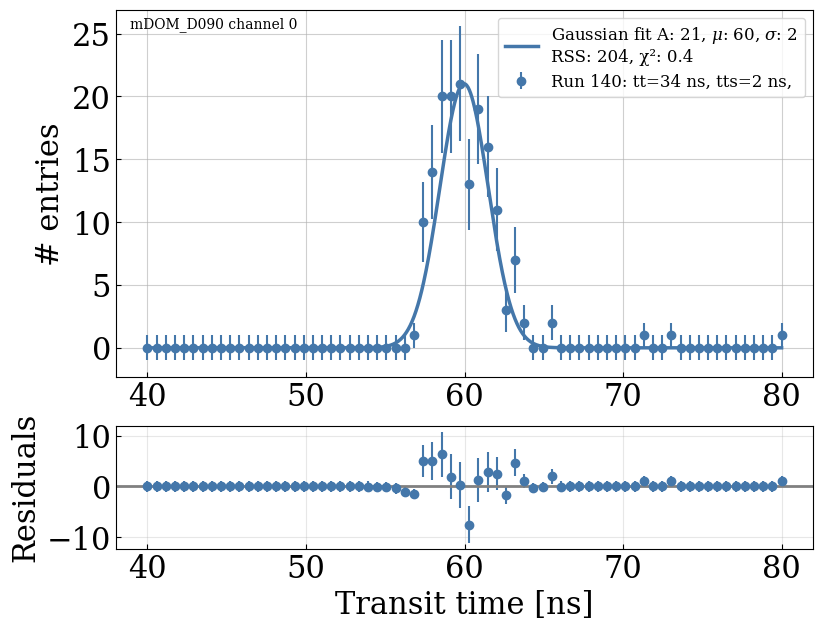

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_6_pmt_DM08740_140.json']


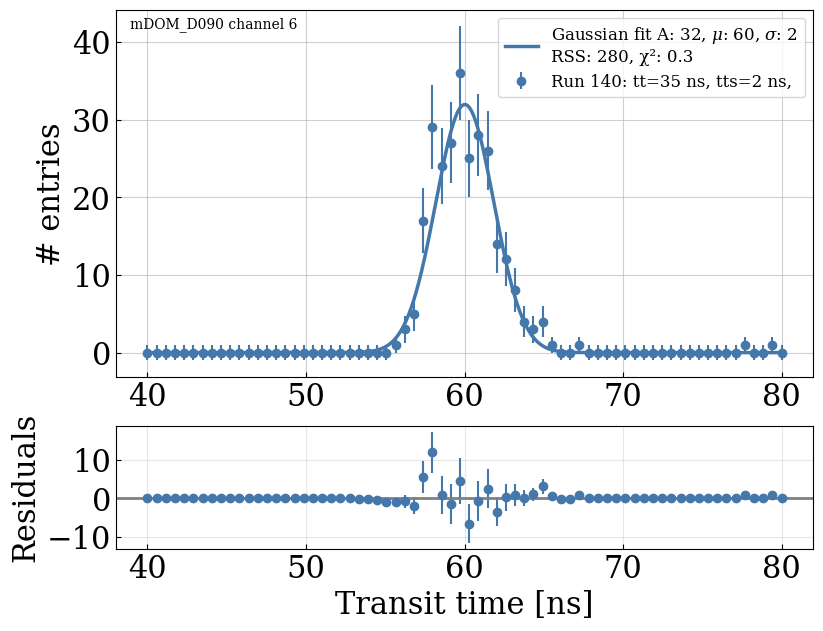

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_14_pmt_DM12907_140.json']


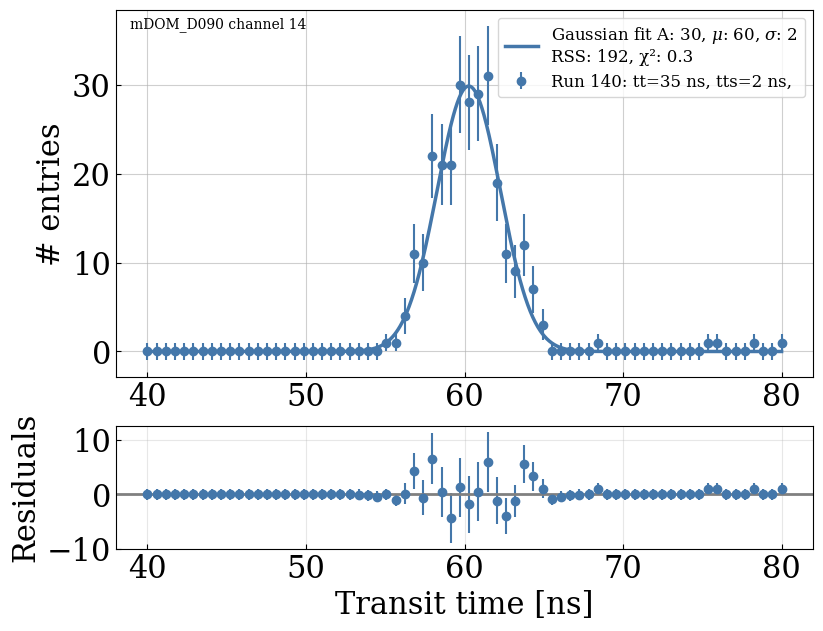

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D090_v1/mDOM_D090_v1_ch_21_pmt_DM11500_140.json']


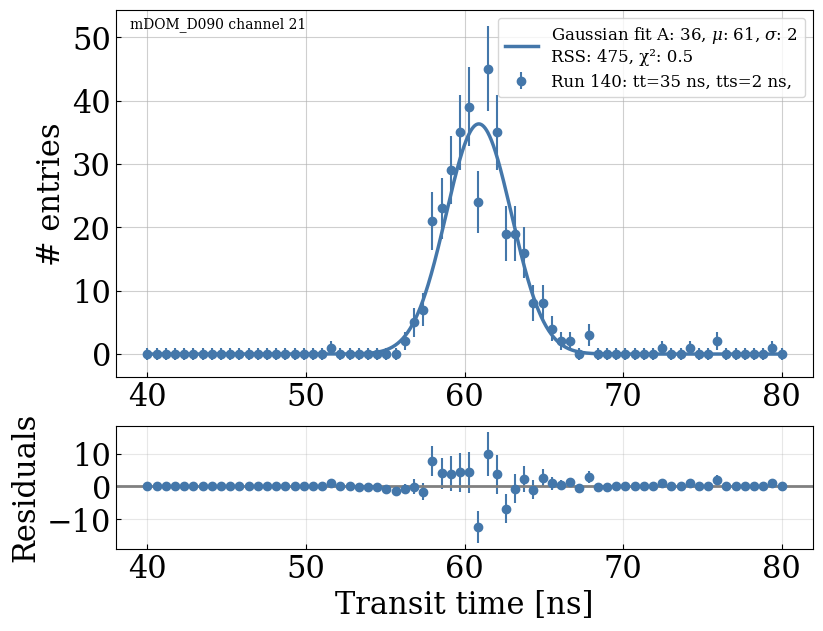

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D036_v1/mDOM_D036_v1_ch_4_pmt_DM05961_100.json']


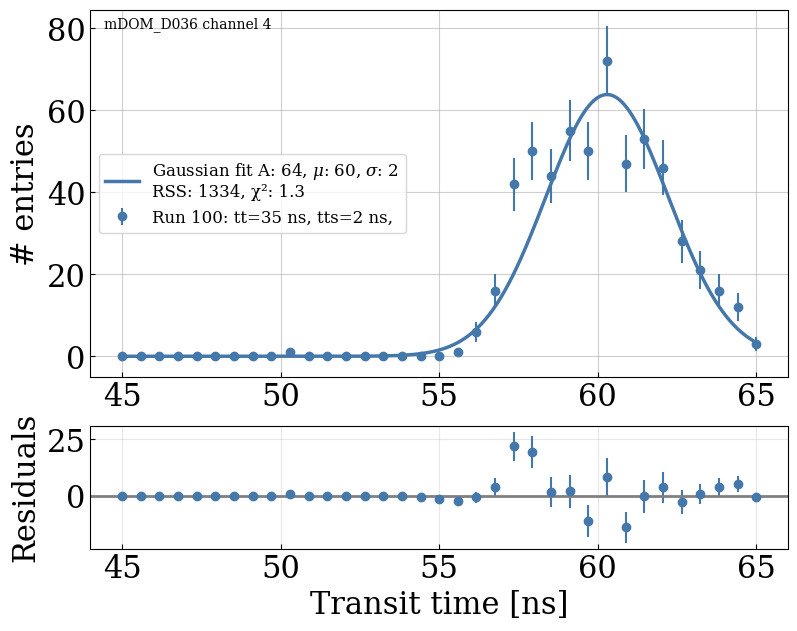

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D084_v1/mDOM_D084_v1_ch_20_pmt_DM12200_143.json']


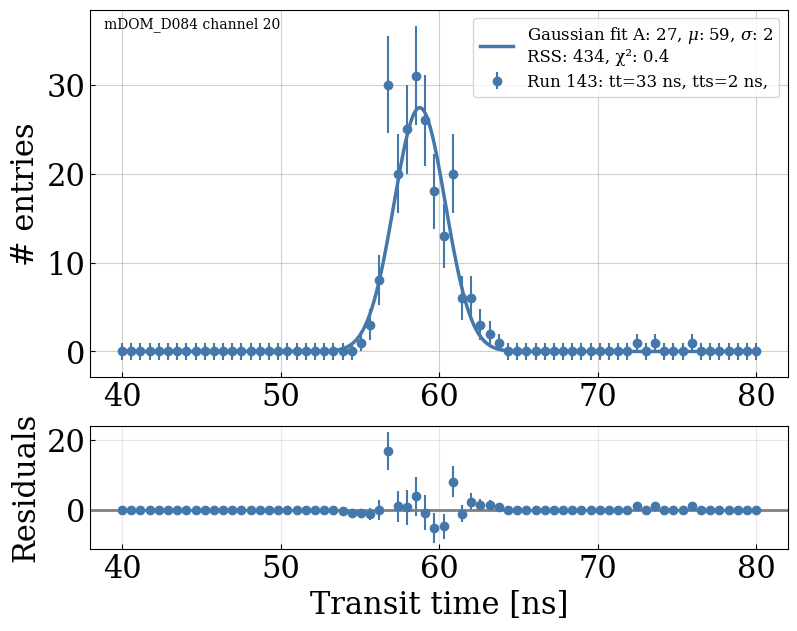

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D211_v1/mDOM_D211_v1_ch_6_pmt_DM10848_317.json']


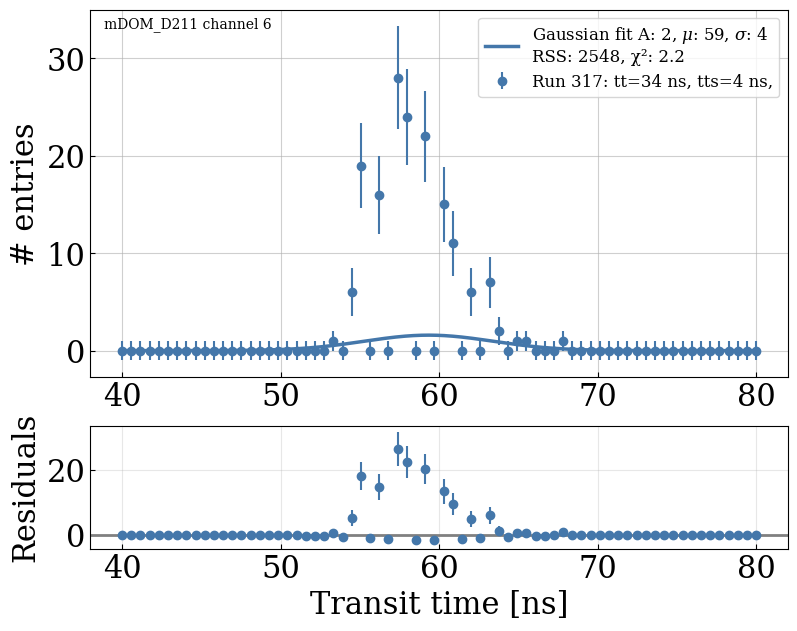

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D007_v1/mDOM_D007_v1_ch_18_pmt_DM00684_22.json']


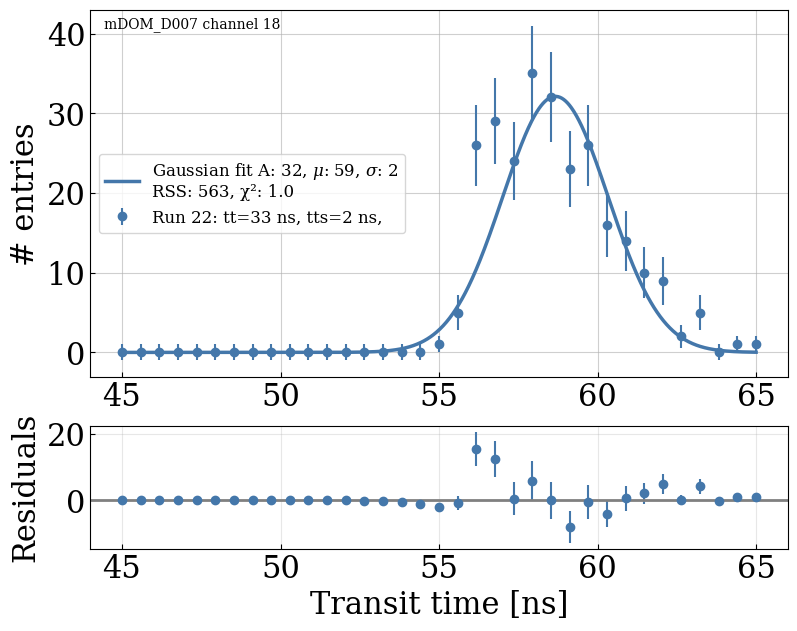

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D034_v1/mDOM_D034_v1_ch_21_pmt_DM04557_47.json']


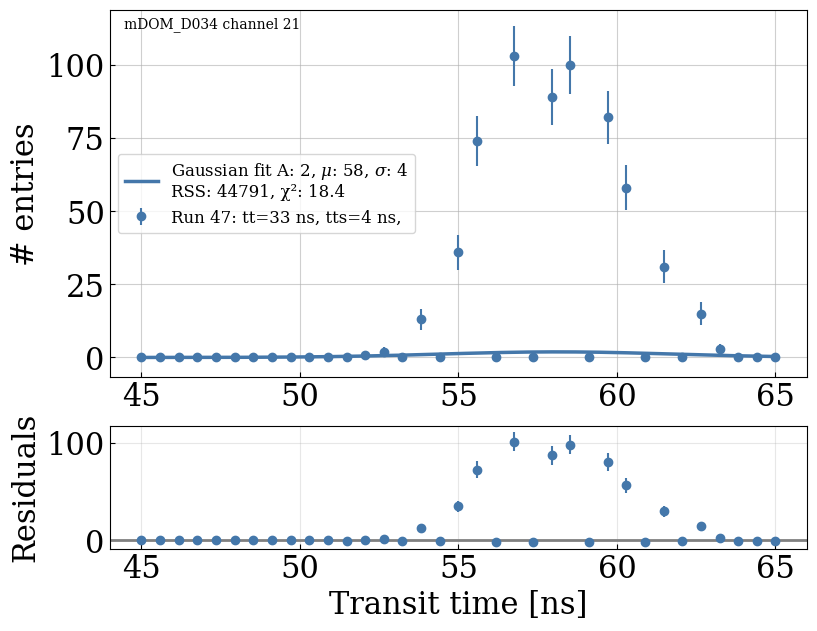

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D092_v1/mDOM_D092_v1_ch_7_pmt_DM12123_139.json']


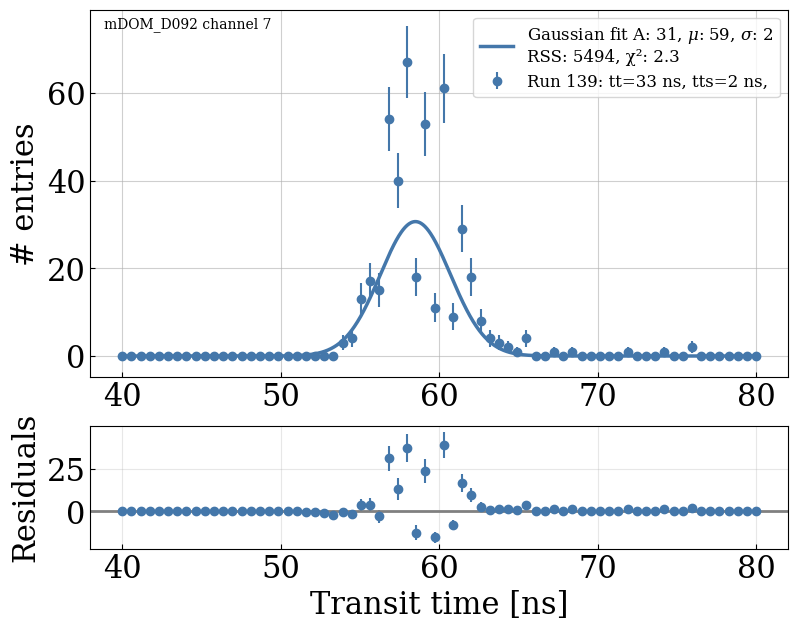

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D054_v1/mDOM_D054_v1_ch_17_pmt_DM04688_24.json']


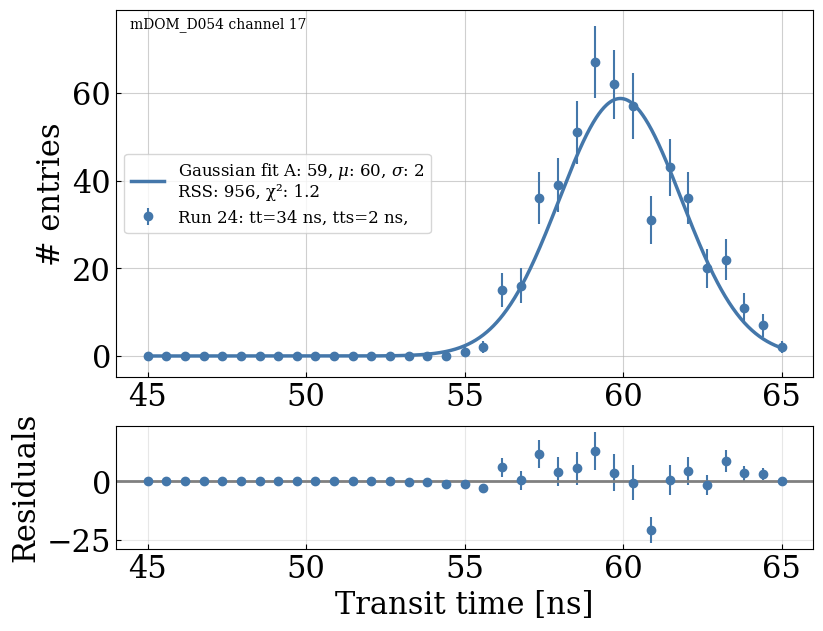

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D015_v1/mDOM_D015_v1_ch_18_pmt_DM06259_2.json']


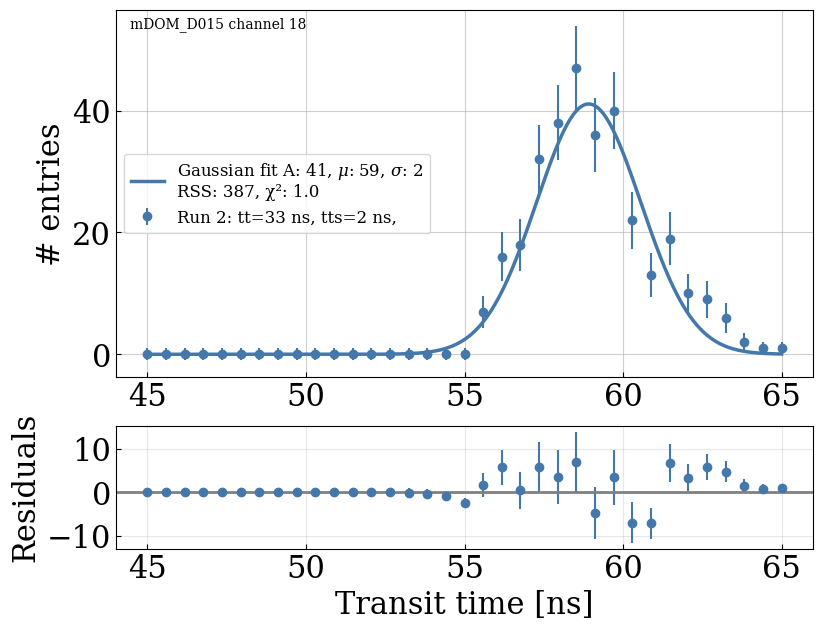

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D015_v1/mDOM_D015_v1_ch_22_pmt_DM03522_2.json']


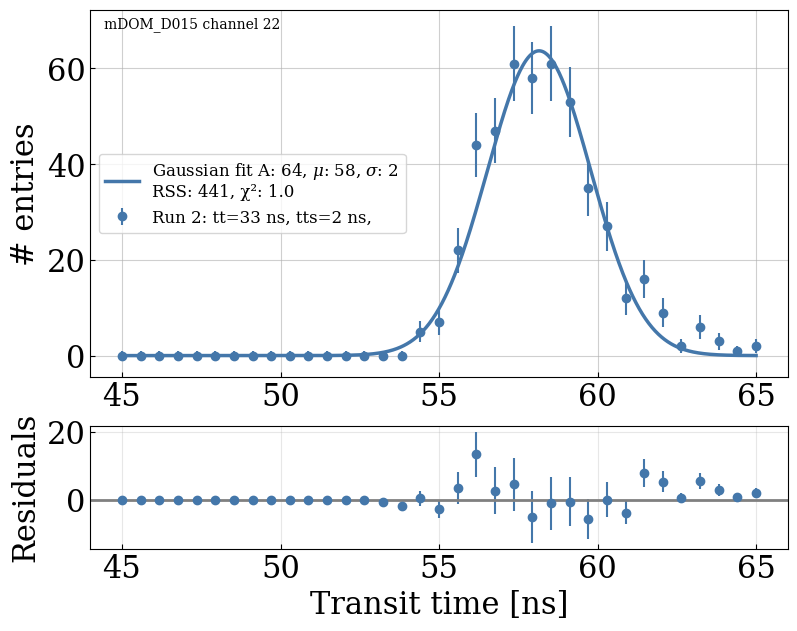

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D070_v1/mDOM_D070_v1_ch_9_pmt_DM12102_99.json']


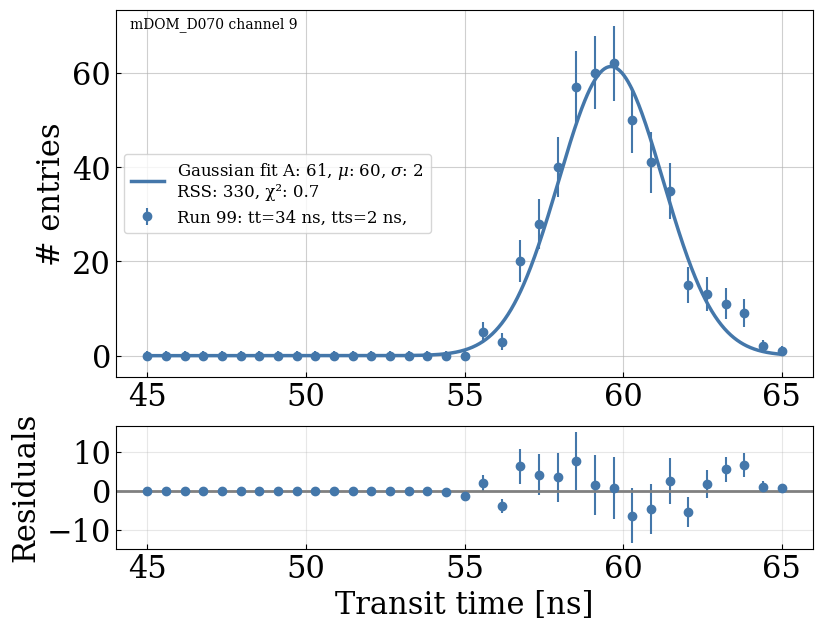

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D208_v1/mDOM_D208_v1_ch_6_pmt_DM03049_321.json']


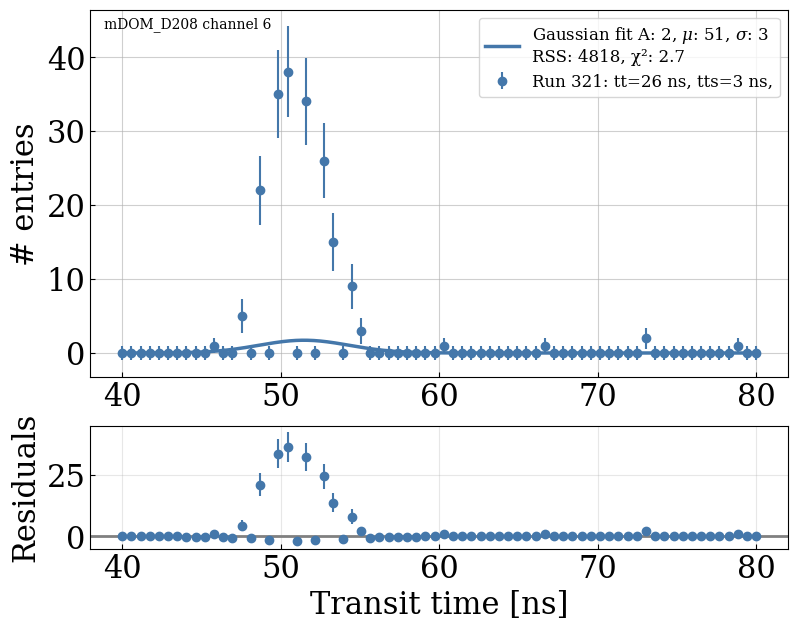

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D208_v1/mDOM_D208_v1_ch_10_pmt_DM01195_321.json']


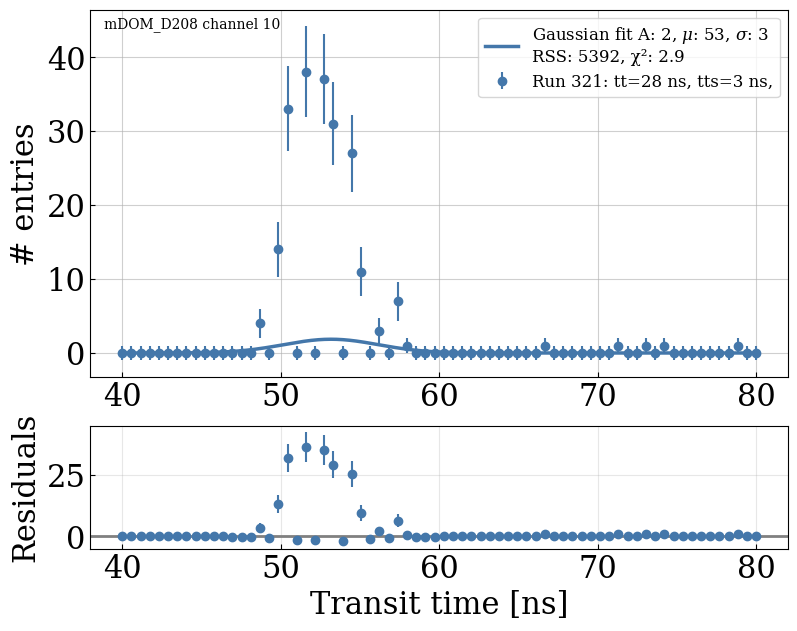

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D208_v1/mDOM_D208_v1_ch_18_pmt_DM09124_321.json']


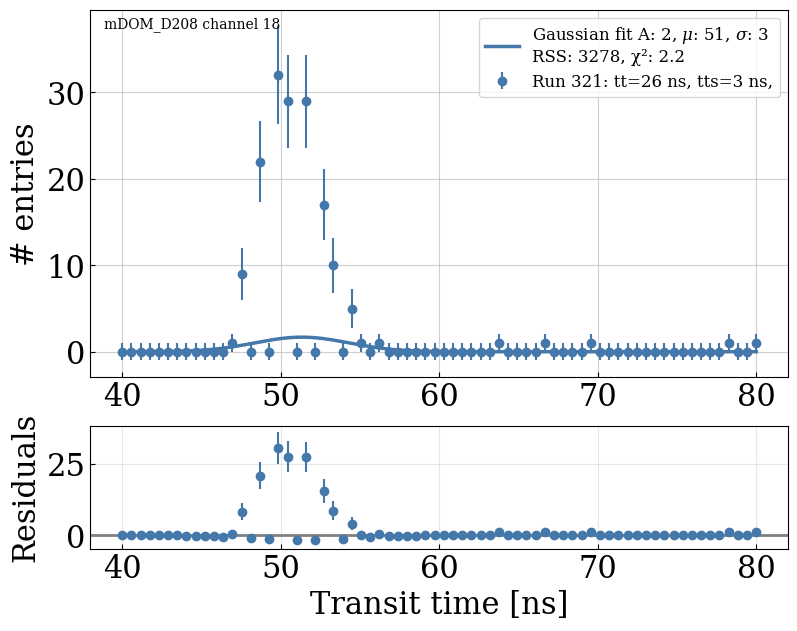

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D208_v1/mDOM_D208_v1_ch_22_pmt_DM01164_321.json']


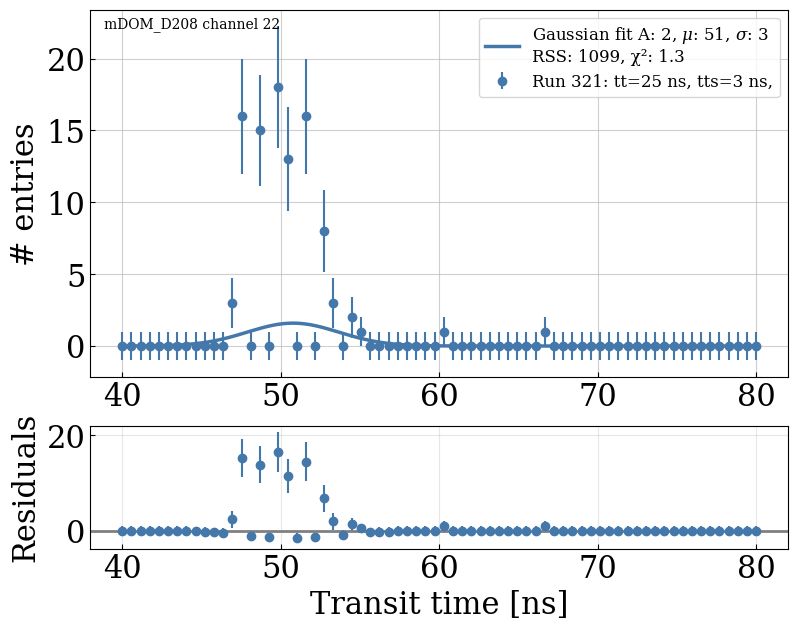

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D209_v1/mDOM_D209_v1_ch_18_pmt_DM11085_318.json']


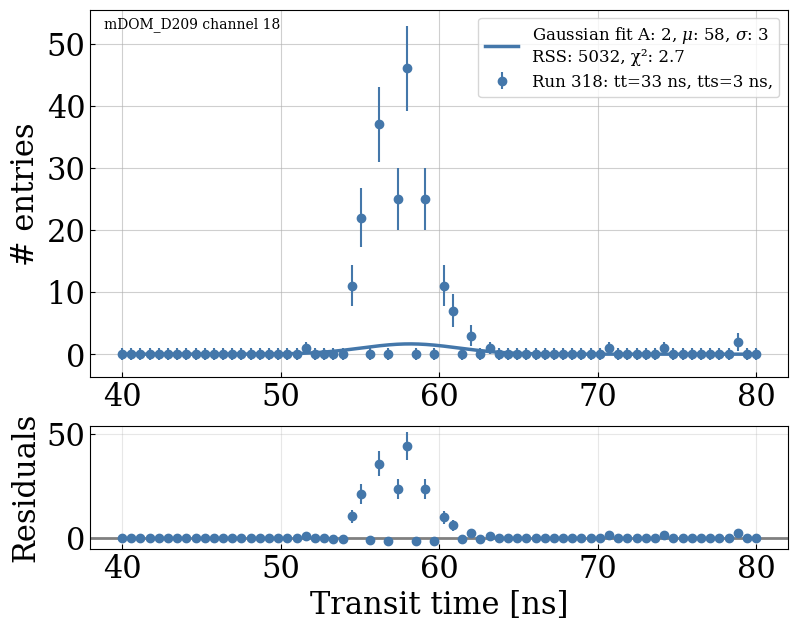

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D209_v1/mDOM_D209_v1_ch_22_pmt_DM09139_318.json']


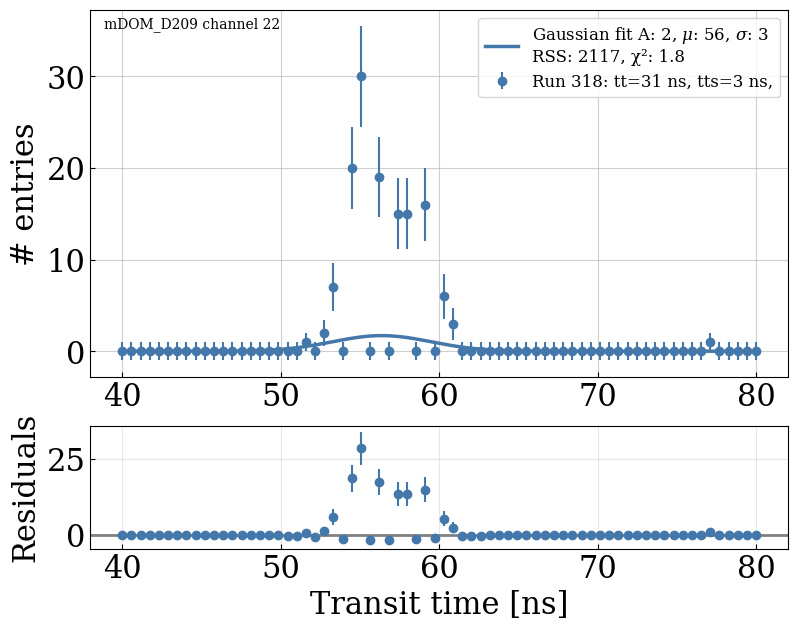

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D089_v1/mDOM_D089_v1_ch_18_pmt_DM12710_116.json']


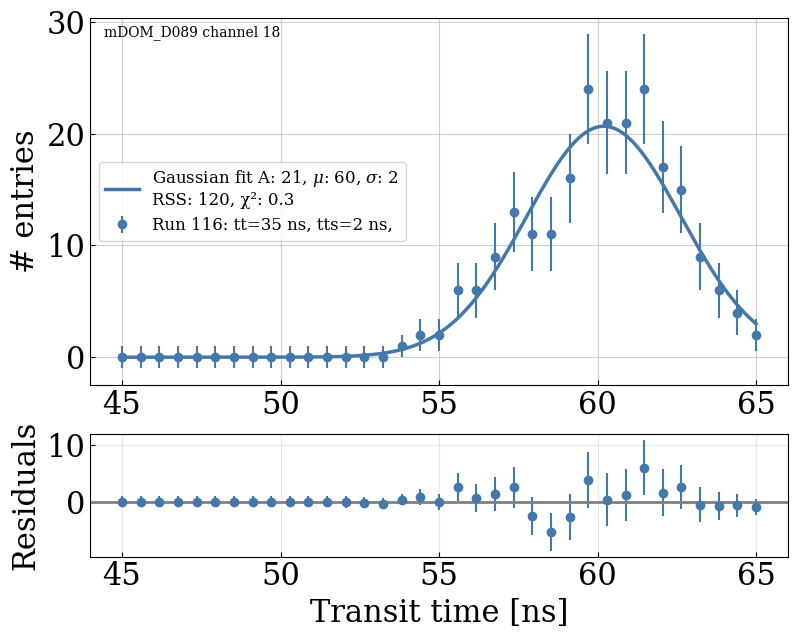

In [211]:
for imdom_pmt_run in mdoms_without_mixed_zeros:
    # print(imdom_pmt_run)
    mdom,channel_run = imdom_pmt_run.split("_channel_")
    channel,run = channel_run.split("_")
    plot_single_gaussian_fit_residual(mdom, channel, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D059_v1/mDOM_D059_v1_ch_2_pmt_DM00546_53.json']


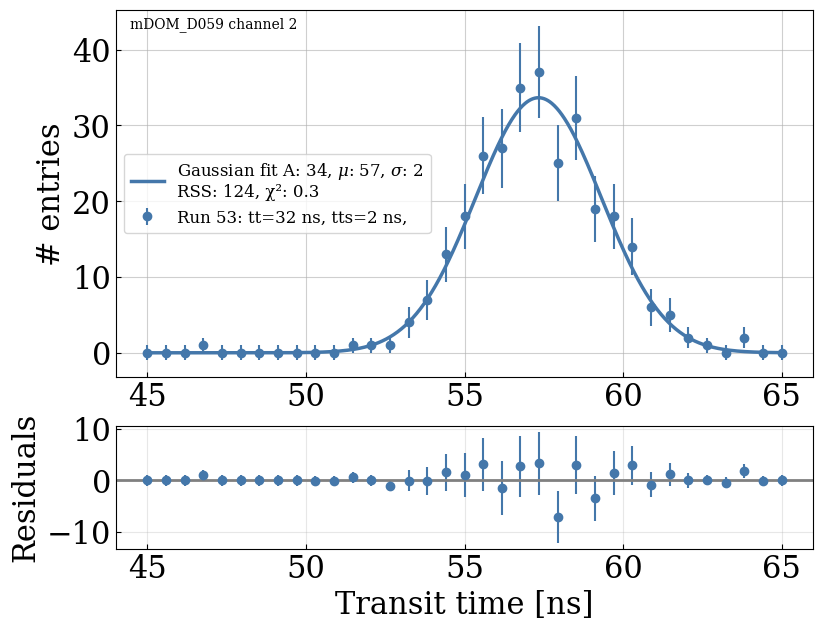

In [212]:
plot_single_gaussian_fit_residual("mDOM_D059", 2, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_3_pmt_DM07283_60.json']
available channels for mDOM_D023: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_19_pmt_DM01056_60.json']
mdom mDOM_D023 channel 19 Run 60: tt 42.7 ns, tts 2.5 ns, a 51.6, b 54.7, c 2.5, chi2 1.0, hv nan V


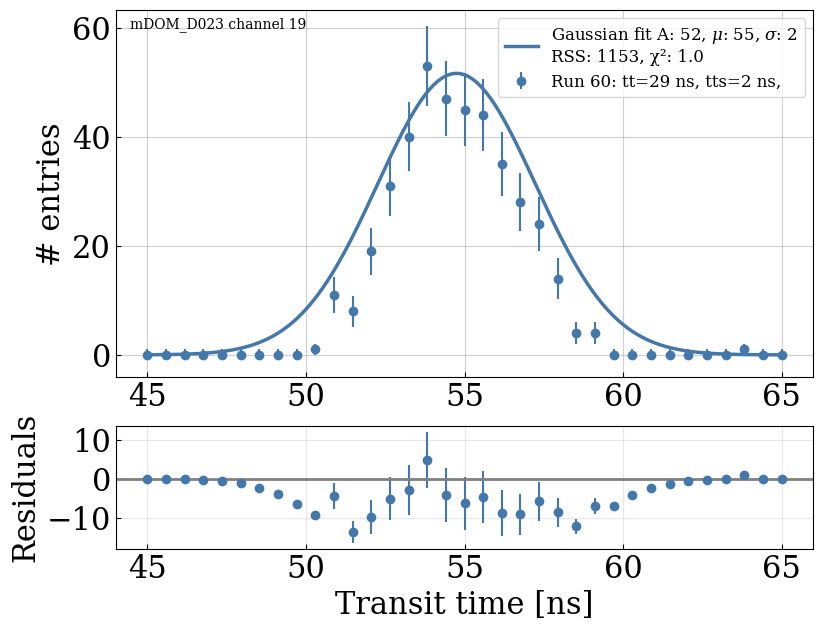

In [213]:
plot_single_transit_time_run_residual("mDOM_D023", 19, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_19_pmt_DM01056_60.json']


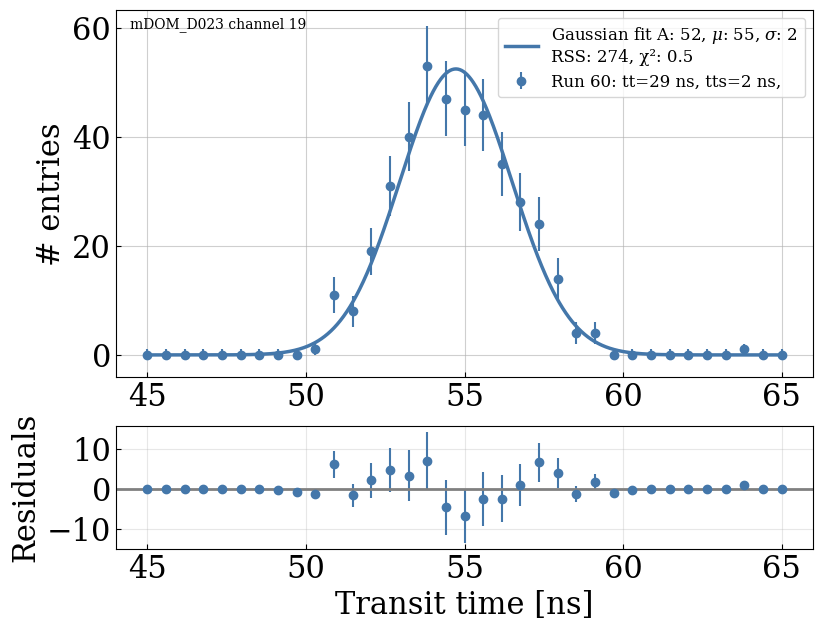

In [214]:
plot_single_gaussian_fit_residual("mDOM_D023", 19, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M085_v1/mDOM_M085_v1_ch_3_pmt_DM12272_1025.json']
available channels for mDOM_M085: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M085_v1/mDOM_M085_v1_ch_18_pmt_DM10993_1025.json']
mdom mDOM_M085 channel 18 Run 1025: tt 47.1 ns, tts 3.0 ns, a 193.6, b 59.1, c 3.0, chi2 0.8, hv 85.8 V


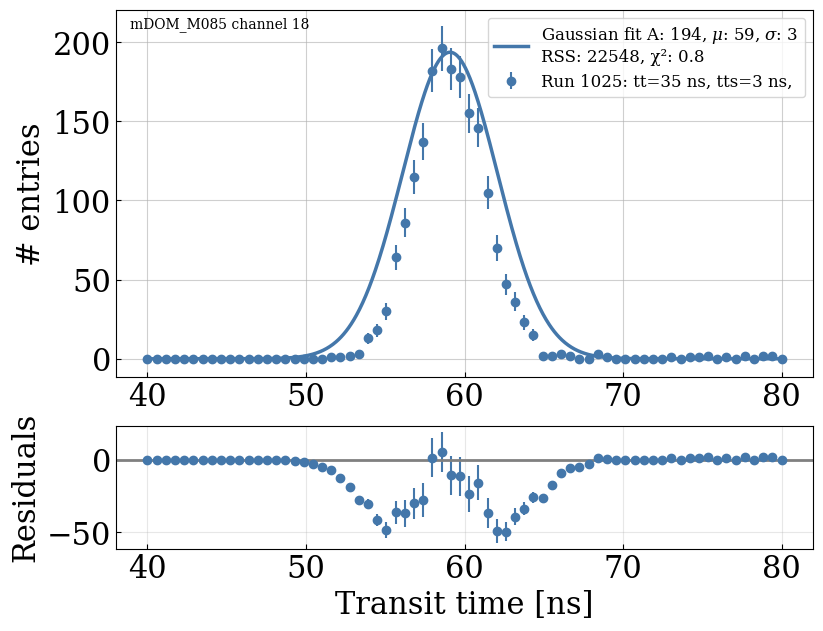

In [215]:
plot_single_transit_time_run_residual("mDOM_M085", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M162_v1/mDOM_M162_v1_ch_3_pmt_DM10094_977.json']
available channels for mDOM_M162: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M162_v1/mDOM_M162_v1_ch_13_pmt_DM09176_977.json']
mdom mDOM_M162 channel 13 Run 977: tt 232.2 ns, tts 65.4 ns, a 7159.3, b 244.2, c 65.4, chi2 0.0, hv 96.8 V


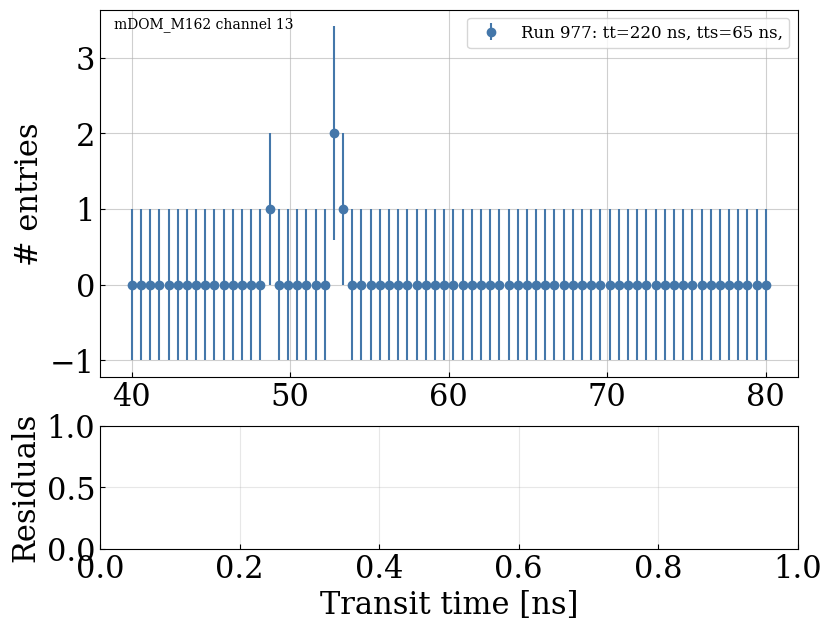

In [226]:
plot_single_transit_time_run_residual("mDOM_M162", 13, mdom_tt_dir, plotFolder,fit_line=False,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_281.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_320.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_418.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_424.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_426.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_427.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M049_v1/mDOM_M049_v1_ch_3_pmt_DM05533_798.json', '/Users/epaudel/research_ua/icecube/upgrade

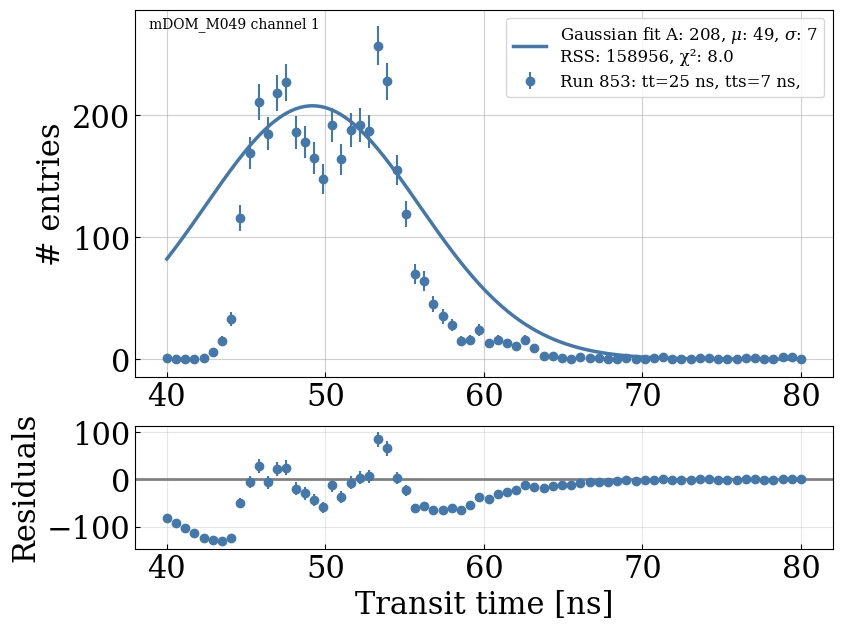

In [217]:
plot_single_transit_time_run_residual("mDOM_M049", 1, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[853])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_3_pmt_DM14177_1465.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_3_pmt_DM14177_756.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_3_pmt_DM14177_758.json']
available channels for mDOM_M137: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_1465.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_758.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_756.json']
mdom mDOM_M137 channel 4 Run 1465: tt 35.2 ns, t

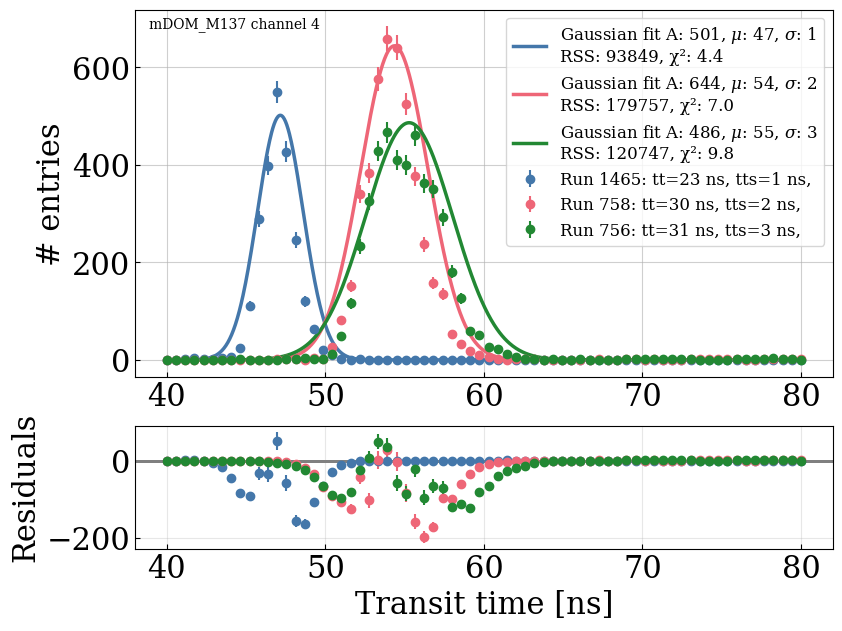

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_1465.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_758.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M137_v1/mDOM_M137_v1_ch_4_pmt_DM13716_756.json']


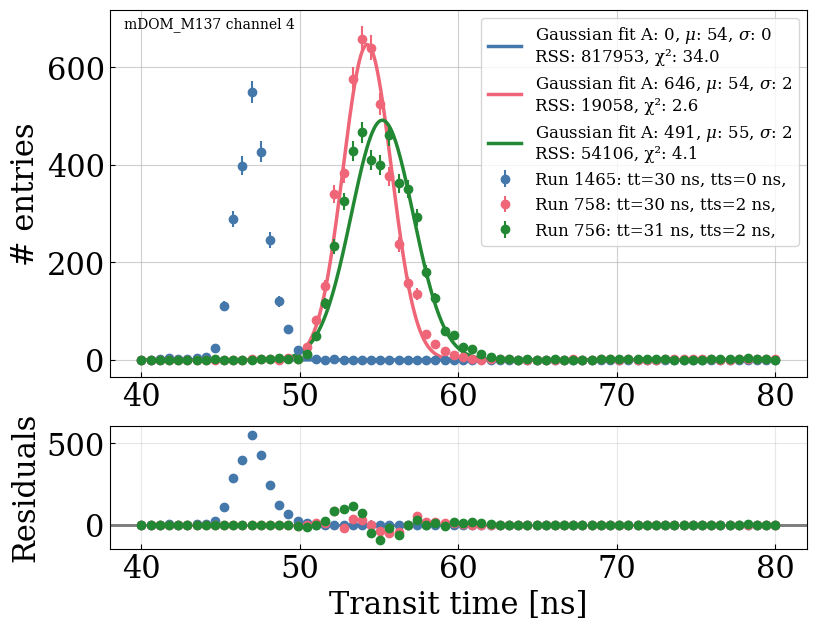

In [218]:
plot_single_transit_time_run_residual("mDOM_M137", 4, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
plot_single_gaussian_fit_residual("mDOM_M137", 4, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_3_pmt_DM07283_60.json']
available channels for mDOM_D023: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_19_pmt_DM01056_60.json']
mdom mDOM_D023 channel 19 Run 60: tt 42.7 ns, tts 2.5 ns, a 51.6, b 54.7, c 2.5, chi2 1.0, hv nan V


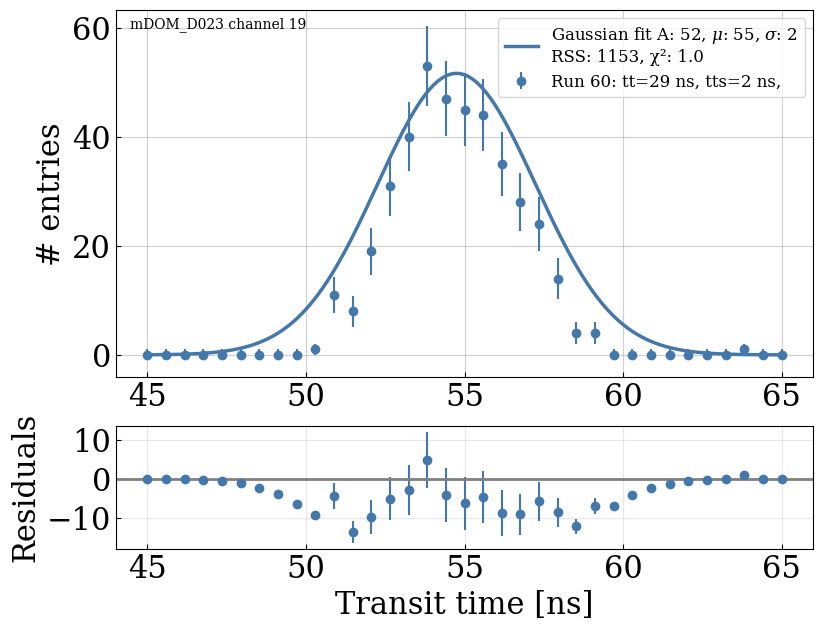

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D023_v1/mDOM_D023_v1_ch_19_pmt_DM01056_60.json']


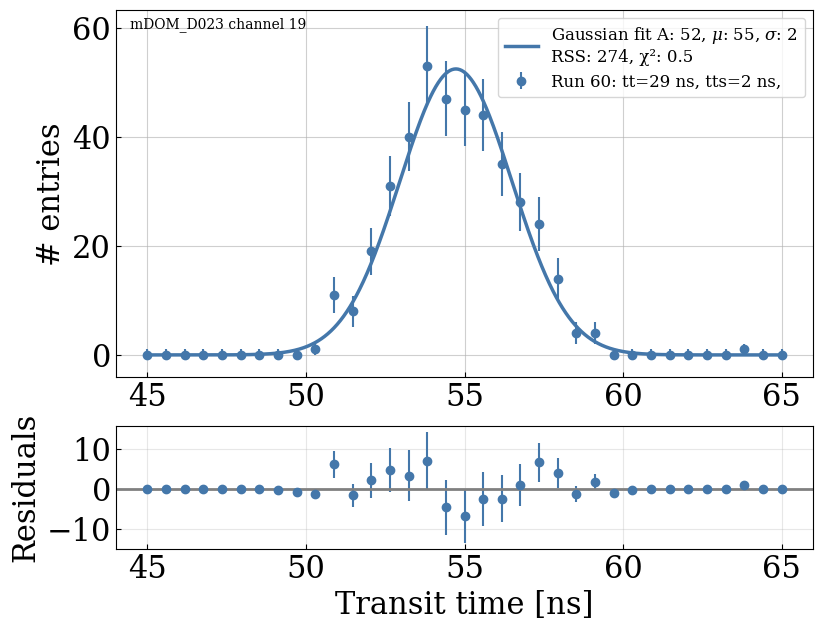

In [219]:
plot_single_transit_time_run_residual("mDOM_D023", 19, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
plot_single_gaussian_fit_residual("mDOM_D023", 19, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M085_v1/mDOM_M085_v1_ch_3_pmt_DM12272_1025.json']
available channels for mDOM_M085: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M085_v1/mDOM_M085_v1_ch_18_pmt_DM10993_1025.json']
mdom mDOM_M085 channel 18 Run 1025: tt 47.1 ns, tts 3.0 ns, a 193.6, b 59.1, c 3.0, chi2 0.8, hv 85.8 V


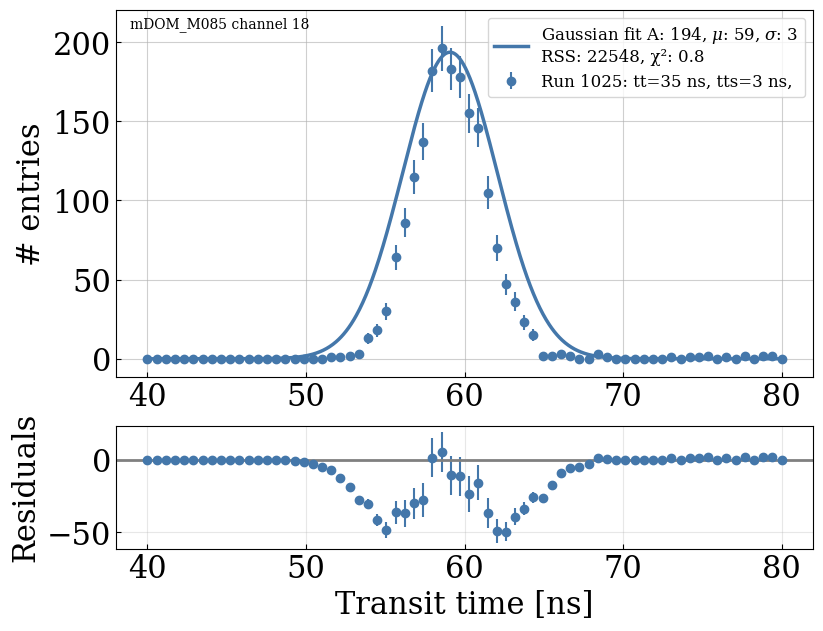

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M085_v1/mDOM_M085_v1_ch_18_pmt_DM10993_1025.json']


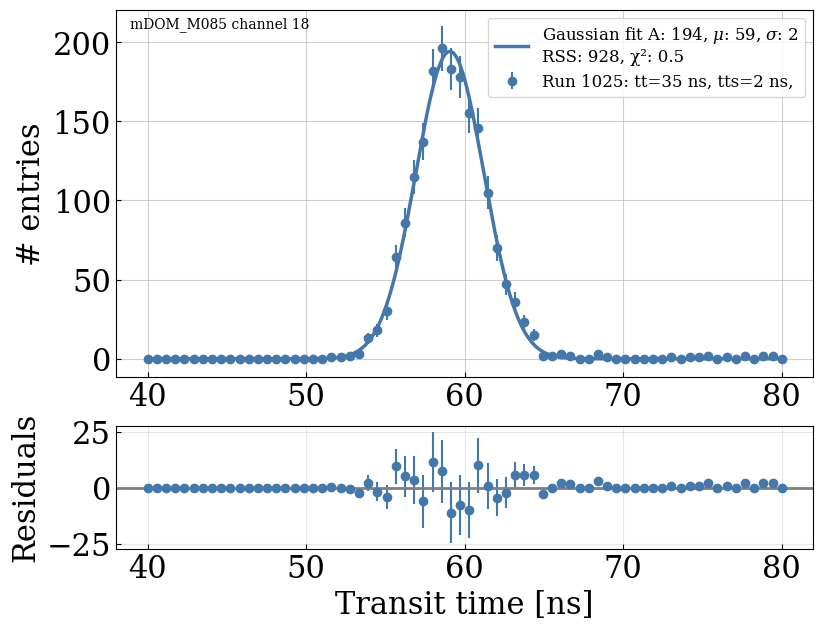

In [220]:
plot_single_transit_time_run_residual("mDOM_M085", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
plot_single_gaussian_fit_residual("mDOM_M085", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_160.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_675.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_676.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_677.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_772.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_773.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_775.json', '/Users/epaudel/research_ua/icecube/upgrade

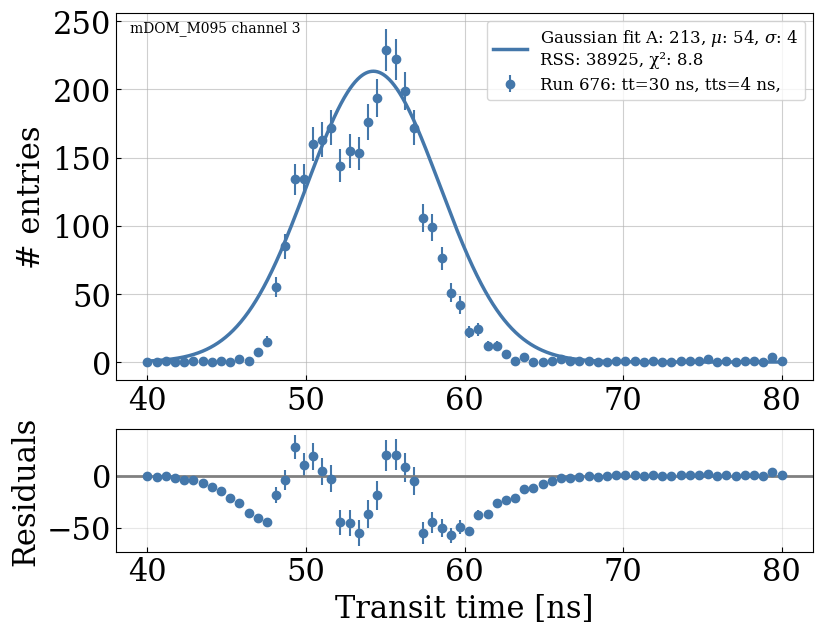

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_160.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_675.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_779.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_775.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_772.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_676.json', '/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_M095_v1/mDOM_M095_v1_ch_3_pmt_DM06326_677.json', '/Users/epaudel/research_ua/icecube/upgrade/

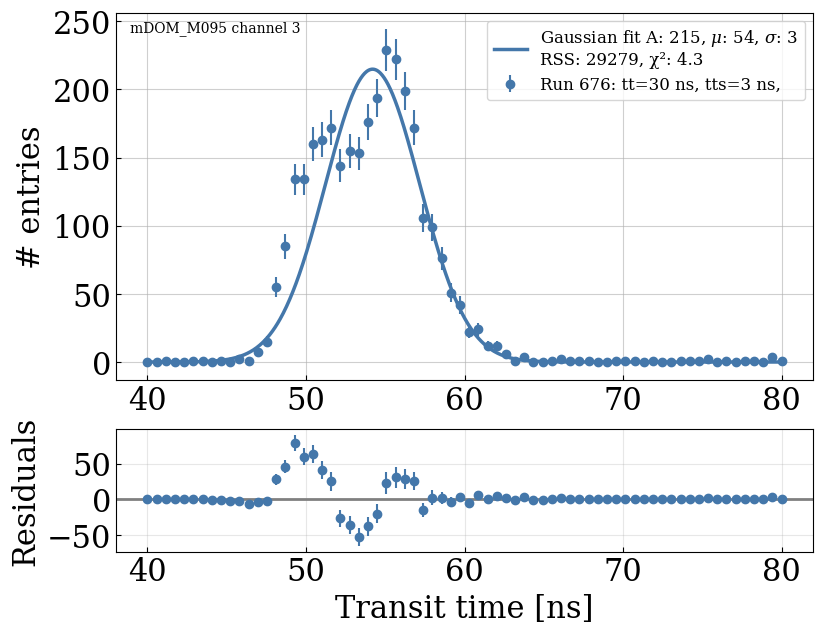

In [221]:
plot_single_transit_time_run_residual("mDOM_M095", 3, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[676])
plot_single_gaussian_fit_residual("mDOM_M095", 3, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[676])

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_3_pmt_DM12074_44.json']
available channels for mDOM_D068: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_11_pmt_DM12064_44.json']
mdom mDOM_D068 channel 11 Run 44: tt 44.5 ns, tts 2.3 ns, a 134.4, b 56.5, c 2.3, chi2 3.8, hv nan V


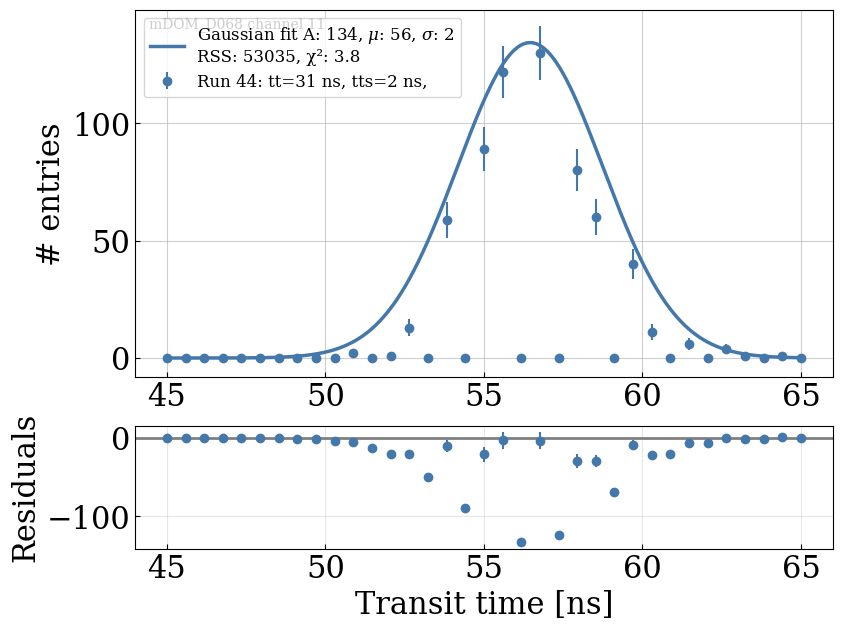

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_11_pmt_DM12064_44.json']


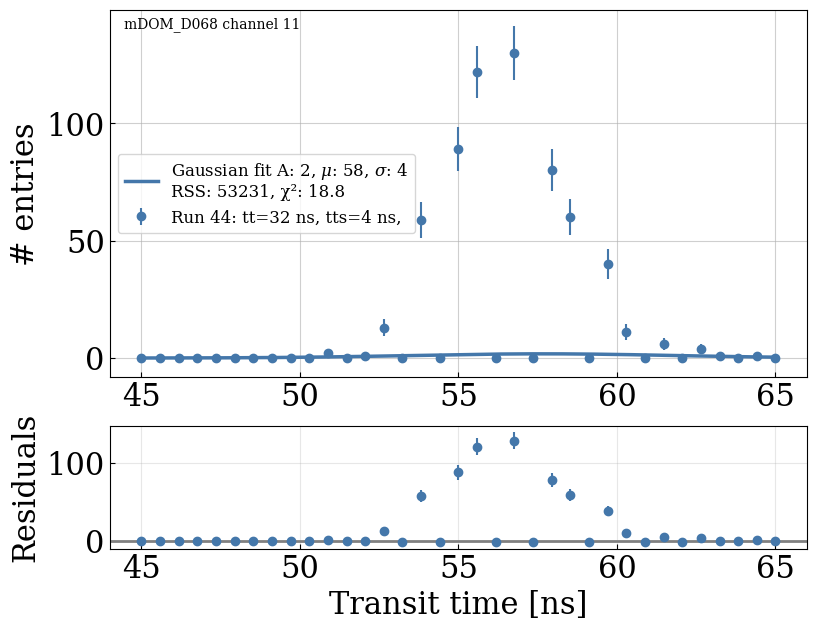

In [222]:
plot_single_transit_time_run_residual("mDOM_D068", 11, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
plot_single_gaussian_fit_residual("mDOM_D068", 11, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])

In [235]:
def plot_single_gaussian_fit_residual_zero_suppress(mDOM_prod_id, channel, mdom_tt_dir, plotFolder,fit_line=False,fit_xlim=[-30,100],include_runs=[],remove_pedestal=None,merge_bins=None) -> None:
    '''Plots the transit time histogram for a single mDOM and all its channels'''
    meas_files = glob.glob(f"{mdom_tt_dir}/{mDOM_prod_id}*/*.json")
    # print(f"meas files {sorted([ifile for ifile in meas_files if "ch_3" in ifile])}")

    available_channels = [extract_channel(ifile) for ifile in meas_files]
    # print(f"available channels for {mDOM_prod_id}: {list(set(available_channels))}")
    meas_files = [ifile for ifile in meas_files if int(extract_channel(ifile)) == int(channel)]
    print(f"meas file {meas_files}")
    if len(meas_files) == 0:
        print(f"meas files for {mDOM_prod_id} channel {channel}: {meas_files}")
    if "_M" in mDOM_prod_id:
        correction = C_msu
    elif "_D" in mDOM_prod_id:
        correction = C_desy
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(9, 7),
                                    gridspec_kw={'height_ratios': [3, 1]})
    x_label = ""
    y_label = ""
    color_num = 0
    for i,ifile in enumerate(meas_files):
        with open(ifile, 'r') as f:
            data = json.load(f)
            transit_times = []
            y_values = data["meas_data"][0]['y_values']
            # print(f"sum of y values {ifile} {sum(y_values)}")
            x_min = data["meas_data"][0]["x_min"]
            x_max = data["meas_data"][0]["x_max"]
            n_bins = data["meas_data"][0]["n_bins"]
            x_values = np.linspace(x_min,x_max,n_bins)
            x_label = data["meas_data"][0]["x_label"]
            y_label = data["meas_data"][0]["y_label"]
            if remove_pedestal is not None:
                x_values_wo_ped = []
                y_values_wo_ped = []
                for ix,iy in zip(x_values,y_values):
                    if abs(iy - remove_pedestal) > 0.001:
                        x_values_wo_ped.append(ix)
                        y_values_wo_ped.append(iy)

                x_values = x_values_wo_ped
                y_values = y_values_wo_ped
                # print(x_values)
            if merge_bins is not None:
                y_values, x_values = merge_bins_reduceat(y_values, x_values, n=merge_bins)
            run = data["run_number"]
            if len(include_runs) > 0 and run not in include_runs:
                continue
            # ax.step(x_values,y_values,ls='-',lw = 2.5,c=colorsCustom[i],label=f" tt {mu:.1f}\u00B1{sigma:.1f} ns PMT HV {hv:.1f} V {temperature:.1f} \u00b0C Run {run}",alpha=1)
            ######################################################################
            initial_guess = [np.max(y_values), 55, 5]
            bounds = ([0, 45, 0.1], #lower limits
                       [np.max(y_values)+100, 65, 5])      # upper limits
            poisson_errors = np.sqrt(np.asarray(y_values))
            poisson_errors[poisson_errors == 0] = 1

            try:
                popt, pcov = curve_fit(gaussian,x_values,y_values,p0=initial_guess,bounds=bounds,maxfev=10000,sigma=poisson_errors,absolute_sigma=True)

                # print(f"popt {popt} {pcov}")



                #####################different initial guess and boundaries###########

                # initial_guess = [np.max(y_values), 55, 3]
                # # bounds = ([0, 30, 0.1,0, 30, 0.1], #lower limits
                # #            [np.max(y_values)+100, 80, 6,np.max(y_values)+100, 80, 6])      # upper limits
                # bounds = ([0.5*np.max(y_values), 45, 0.1], #lower limits
                #             [np.max(y_values)+100, 65, 5])      # upper limits


                # poisson_errors = np.sqrt(np.asarray(y_values))
                # poisson_errors[poisson_errors == 0] = 1

                # popt, pcov = curve_fit(
                #     gaussian,
                #     x_values, y_values,
                #     p0=initial_guess,
                #     bounds=bounds,
                #     maxfev=10000,
                #     sigma=poisson_errors,
                #     absolute_sigma=True
                # )


                perr = np.sqrt(np.diag(pcov))
                perr_dof = perr / np.sqrt(len(x_values) - len(popt))
                chi2 = np.sum(((y_values - gaussian(x_values, *popt))/poisson_errors)**2)
                ndof = len(x_values) - len(popt)
                reduced_chi2 = chi2 / ndof
                a,b,c = popt
                # print(a,b,c)

                # -------------------------------------------------------------------
                # Plot
                # -------------------------------------------------------------------
                y_fit = gaussian(x_values, *popt)
                residuals = y_values - y_fit
                RSS = np.sum(residuals**2)
                ax1.errorbar(x_values, y_values, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], label=f"Run {run}: tt={b-correction:.0f} ns, tts={c:.0f} ns,",alpha=1)
                if fit_line:
                    x_values_fit = np.linspace(min(x_values),max(x_values),1000)
                    ax1.plot(x_values_fit, gaussian(x_values_fit,*popt),  '-',c=colorsCustom[color_num],  linewidth=2.5,   label=rf'Gaussian fit A: {a:.0f}, $\mu$: {b:.0f}, $\sigma$: {c:.0f}'+'\n'+f'RSS: {RSS:.0f}, χ²: {reduced_chi2:.1f}')
                    ax2.errorbar(x_values, residuals, yerr=poisson_errors, fmt='o', color=colorsCustom[color_num], alpha=1)
                    ax2.axhline(0, color="gray", linewidth=2)
            except RuntimeError as e:
                print(f"Fit failed for {ifile} with error: {e}")
        color_num += 1

    ax2.set_ylabel('Residuals', fontsize=22)
    ax2.grid(True, alpha=0.3)
    ax2.tick_params(axis='both',which='both', direction='in', labelsize=22)                

    ax1.tick_params(axis='both',which='both', direction='in', labelsize=22)
    ax1.text(0.02, 0.95, f"{mDOM_prod_id} channel {channel}", transform=ax1.transAxes, ha='left', fontsize=10)
    # ax1.text(0.55, 0.95, f"{mDOM_prod_id} channel {channel} {get_pmt_uid(mDOM_prod_id, int(channel), mdom_tt_dir)}", transform=ax1.transAxes, ha='left', fontsize=10)
    ax2.set_xlabel(f"{x_label}", fontsize=22)
    ax1.set_ylabel(f"{y_label}", fontsize=22)
    ax1.grid(True,alpha=0.6)
    ax1.legend(fontsize=12,ncols=1)
    ax1.set_xlim(fit_xlim)
    ax2.set_xlim(fit_xlim)
    plot_name = f"{plotFolder}/{mDOM_prod_id}_channel_{channel}"
    # plt.savefig(plot_name+".png",transparent=False,bbox_inches='tight')
    # plt.savefig(plot_name+".pdf",transparent=False,bbox_inches='tight')
    # plt.close()
    plt.show()

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_3_pmt_DM12074_44.json']
available channels for mDOM_D068: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_11_pmt_DM12064_44.json']
mdom mDOM_D068 channel 11 Run 44: tt 44.5 ns, tts 2.3 ns, a 134.4, b 56.5, c 2.3, chi2 3.8, hv nan V


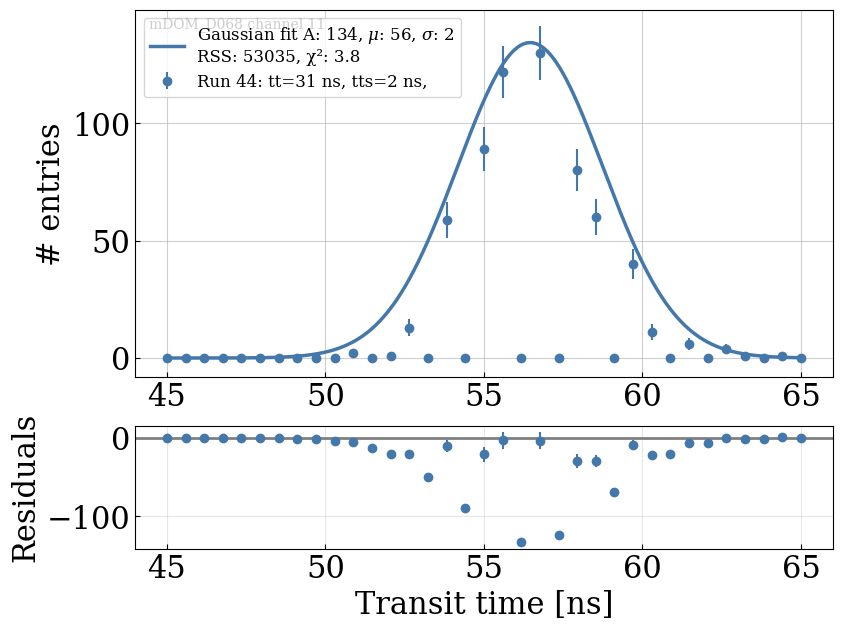

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D068_v1/mDOM_D068_v1_ch_11_pmt_DM12064_44.json']


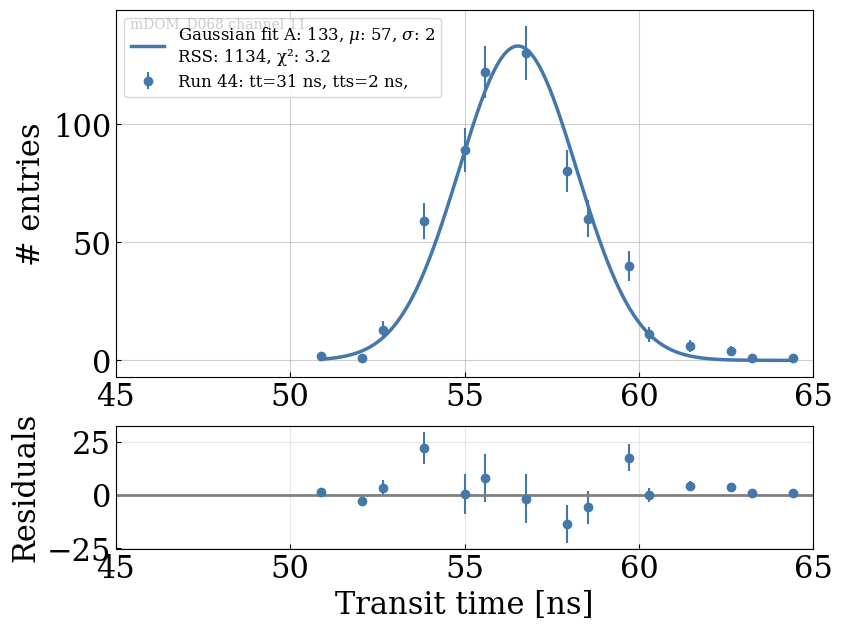

In [239]:
plot_single_transit_time_run_residual("mDOM_D068", 11, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[-30,100],include_runs=[])
plot_single_gaussian_fit_residual_zero_suppress("mDOM_D068", 11, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[45,65],include_runs=[],remove_pedestal=0,merge_bins=None)

meas files ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D036_v1/mDOM_D036_v1_ch_3_pmt_DM04721_100.json']
available channels for mDOM_D036: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D036_v1/mDOM_D036_v1_ch_18_pmt_DM13463_100.json']
mdom mDOM_D036 channel 18 Run 100: tt 24.4 ns, tts 0.8 ns, a 5.7, b 36.4, c 0.8, chi2 27.4, hv 82.5 V


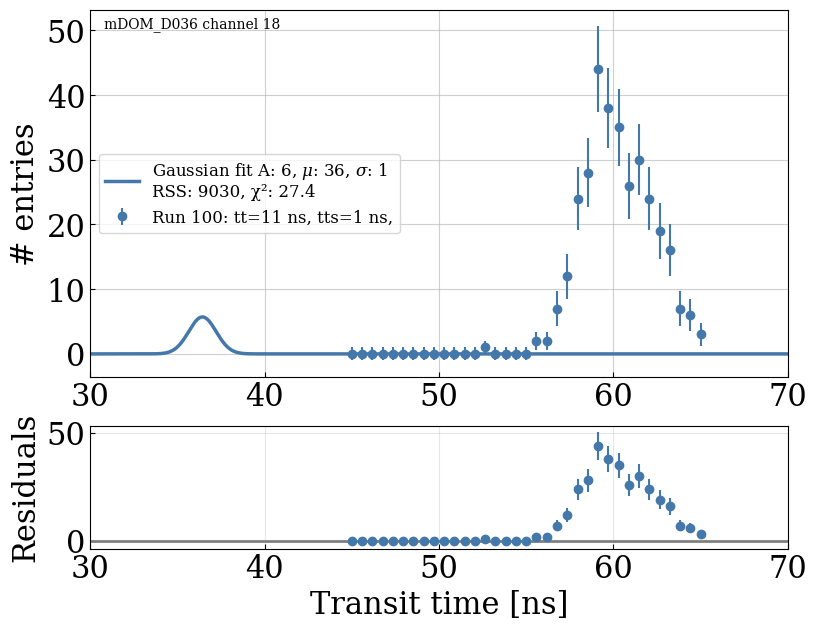

meas file ['/Users/epaudel/research_ua/icecube/upgrade/timing_calibration/data/mdom_transit/mDOM_D036_v1/mDOM_D036_v1_ch_18_pmt_DM13463_100.json']


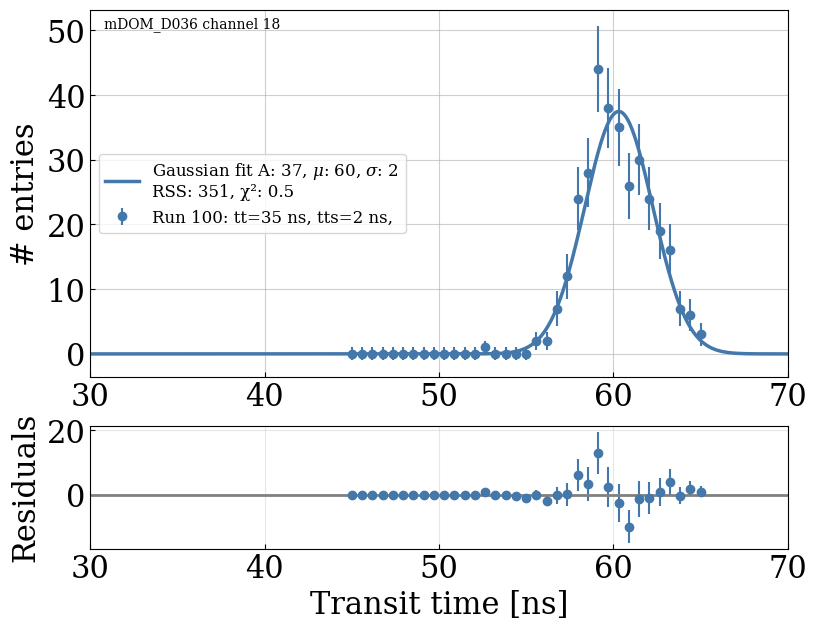

In [256]:
plot_single_transit_time_run_residual("mDOM_D036", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[30,70],include_runs=[])
plot_single_gaussian_fit_residual("mDOM_D036", 18, mdom_tt_dir, plotFolder,fit_line=True,fit_xlim=[30,70],include_runs=[])